In [437]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import xgboost as xgb
import joblib

# Attempt to import Explainable AI Libraries
try:
    import shap
    import lime
    import lime.lime_tabular
    from lime import submodular_pick
    print(f"SHAP version: {shap.__version__}")
    print(f"LIME version: {lime.__version__}")
except ModuleNotFoundError as e:
    print(f"ModuleNotFoundError: {e}. Please ensure all required libraries are installed.")

import warnings
warnings.filterwarnings('ignore')
from matplotlib.patches import Rectangle

# Attempt to import Plotly Libraries
try:
    import plotly.graph_objects as go
    from plotly.subplots import make_subplots
    import plotly.express as px
except ModuleNotFoundError as e:
    print(f"ModuleNotFoundError: {e}. Please ensure Plotly is installed.")

# Data preprocessing
from sklearn.preprocessing import StandardScaler, RobustScaler, LabelEncoder, MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectKBest, f_classif, RFE, mutual_info_classif
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

# Model selection and validation
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_recall_fscore_support
from sklearn.metrics import ConfusionMatrixDisplay, roc_auc_score, roc_curve

# Models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier, BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier

# Imbalanced learning
from imblearn.over_sampling import SMOTE, ADASYN
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTEENN
from imblearn.pipeline import Pipeline as ImbPipeline
print("✅ Explainable AI libraries import attempt completed!")


ModuleNotFoundError: No module named 'shap'. Please ensure all required libraries are installed.
ModuleNotFoundError: No module named 'plotly'. Please ensure Plotly is installed.
✅ Explainable AI libraries import attempt completed!


# Reading Data Into Pandas Dataframe

In [438]:

df = pd.read_csv('CVD Dataset.csv')
df

,Sex,Age,Weight (kg),Height (m),BMI,Abdominal Circumference (cm),Blood Pressure (mmHg),Total Cholesterol (mg/dL),HDL (mg/dL),Fasting Blood Sugar (mg/dL),Smoking Status,Diabetes Status,Physical Activity Level,Family History of CVD,CVD Risk Level,Height (cm),Waist-to-Height Ratio,Systolic BP,Diastolic BP,Blood Pressure Category,Estimated LDL (mg/dL),CVD Risk Score
0,F,32.000,69.100,1.710,23.600,86.200,125/79,248.000,78.000,111.000,N,Y,Low,N,INTERMEDIARY,171.000,0.504,125.000,79.000,Elevated,140.000,17.930
1,F,55.000,118.700,1.690,41.600,82.500,139/70,162.000,50.000,135.000,Y,Y,High,Y,HIGH,169.000,0.488,139.000,70.000,Hypertension Stage 1,82.000,20.510
2,M,NaN,NaN,1.830,26.900,106.700,104/77,103.000,73.000,114.000,N,N,High,Y,INTERMEDIARY,183.000,0.583,104.000,77.000,Normal,0.000,12.640
3,M,44.000,108.300,1.800,33.400,96.600,140/83,134.000,46.000,91.000,N,N,High,Y,INTERMEDIARY,NaN,0.537,140.000,83.000,Hypertension Stage 1,58.000,16.360
4,F,32.000,99.500,1.860,28.800,102.700,144/83,146.000,64.000,141.000,Y,Y,High,N,INTERMEDIARY,186.000,0.552,144.000,83.000,Hypertension Stage 1,52.000,17.880
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3014,F,48.127,82.525,1.782,24.898,91.373,113/69,219.609,33.639,104.097,Y,Y,Low,N,HIGH,201.444,0.515,115.462,69.543,Normal,146.326,16.606
3015,M,36.530,69.499,1.579,28.179,113.527,129/77,181.535,77.032,113.290,N,N,High,N,LOW,176.681,0.656,117.731,76.112,Elevated,63.129,16.886
3016,M,56.116,51.965,1.716,28.118,70.278,122/119,247.534,59.606,120.739,Y,Y,High,N,LOW,163.891,0.447,116.280,129.259,Hypertension Stage 2,169.091,20.205
3017,M,43.729,117.822,1.956,34.044,108.588,102/88,289.438,31.641,160.042,Y,N,Moderate,N,LOW,205.597,0.559,105.696,86.050,Hypertension Stage 1,218.506,15.454


In [439]:
# Visualization settings
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)

## CVD Dataset Structure: Number of Subjects per Attribute

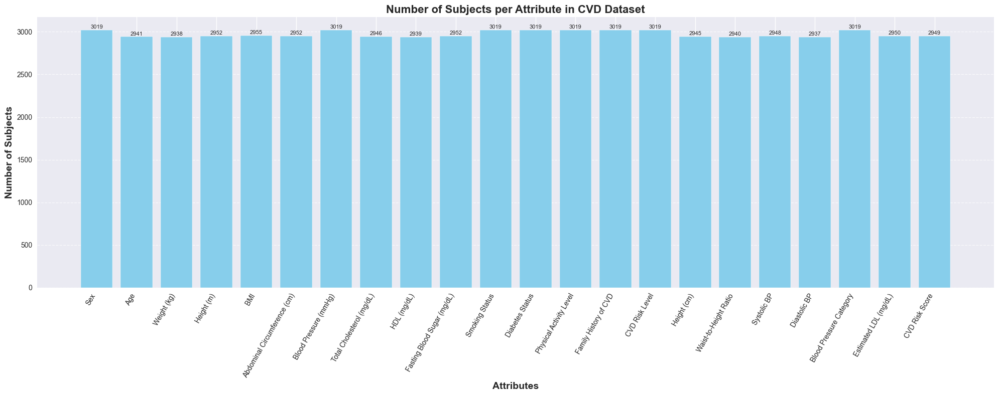

In [440]:


# Import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv('CVD Dataset.csv')

# Count the number of non-null entries for each column
attribute_counts = df.notnull().sum()

# Plotting
plt.figure(figsize=(20, 8))
bars = plt.bar(attribute_counts.index, attribute_counts.values, color='skyblue')

# Adding counts above bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2.0, yval + 5, int(yval), ha='center', va='bottom', fontsize=8)

# Customize the plot
plt.xticks(rotation=60, ha='right')
plt.xlabel('Attributes', fontsize=14, weight='bold')
plt.ylabel('Number of Subjects', fontsize=14, weight='bold')
plt.title('Number of Subjects per Attribute in CVD Dataset', fontsize=16, weight='bold')
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

df.info(): This function provides a concise summary of the DataFrame. It includes information about the index dtype, column dtypes, non-null values, and memory usage. This is useful for quickly understanding the data types and identifying columns with missing values.

In [441]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3019 entries, 0 to 3018
Data columns (total 22 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Sex                           3019 non-null   object 
 1   Age                           2941 non-null   float64
 2   Weight (kg)                   2938 non-null   float64
 3   Height (m)                    2952 non-null   float64
 4   BMI                           2955 non-null   float64
 5   Abdominal Circumference (cm)  2952 non-null   float64
 6   Blood Pressure (mmHg)         3019 non-null   object 
 7   Total Cholesterol (mg/dL)     2946 non-null   float64
 8   HDL (mg/dL)                   2939 non-null   float64
 9   Fasting Blood Sugar (mg/dL)   2952 non-null   float64
 10  Smoking Status                3019 non-null   object 
 11  Diabetes Status               3019 non-null   object 
 12  Physical Activity Level       3019 non-null   object 
 13  Fam

df.shape(): This function is used to understand the number of rows (observations) and columns (features) in the dataset. This gives an overview of the dataset's size and structure.





In [442]:
df.shape

(3019, 22)

df.describe(): This function generates descriptive statistics of the DataFrame. It provides insights into the central tendency, dispersion, and shape of the distribution of each numerical column, including count, mean, standard deviation, min, max, and quartile values. This is crucial for understanding the basic statistical properties of the data.


In [443]:
df.describe()

,Age,Weight (kg),Height (m),BMI,Abdominal Circumference (cm),Total Cholesterol (mg/dL),HDL (mg/dL),Fasting Blood Sugar (mg/dL),Height (cm),Waist-to-Height Ratio,Systolic BP,Diastolic BP,Estimated LDL (mg/dL),CVD Risk Score
count,2941.000000,2938.000000,2952.000000,2955.000000,2952.000000,2946.000000,2939.000000,2952.000000,2945.000000,2940.000000,2948.000000,2937.000000,2950.000000,2949.000000
mean,46.889660,86.067296,1.753413,28.463352,91.793945,198.973926,56.349266,117.831102,175.296906,0.525547,125.830713,82.914740,112.583169,16.957289
std,12.358777,21.070499,0.130598,7.024836,13.132486,57.849142,16.105677,30.312000,12.846207,0.082272,22.053640,14.851092,58.742602,2.463638
min,23.189000,44.373000,1.313000,14.362000,64.567000,92.299000,26.151000,63.035000,136.469000,0.329000,82.347000,53.547000,-18.644000,9.422000
25%,37.000000,67.300000,1.659750,22.667000,80.736000,150.000000,42.000000,93.234500,166.000000,0.460000,108.344250,71.000000,61.988750,15.204000
50%,46.000000,86.800000,1.752000,28.152000,91.321000,197.656000,56.000000,115.721000,175.220000,0.522000,124.997000,82.000000,111.000000,16.898000
75%,55.000000,104.475000,1.850000,33.800000,101.800000,248.000000,69.321000,138.000000,184.356000,0.583000,140.956250,93.000000,160.466500,18.636000
max,86.924000,129.256000,2.318000,48.718000,134.202000,322.362000,94.927000,213.070000,220.003000,0.789000,197.536000,131.685000,254.823000,25.089000


df.head(): This function displays the first 5 rows of the DataFrame by default. It's useful for getting a quick glimpse of the data, understanding its structure, and verifying that the data has been loaded correctly.


In [444]:
df.head()

,Sex,Age,Weight (kg),Height (m),BMI,Abdominal Circumference (cm),Blood Pressure (mmHg),Total Cholesterol (mg/dL),HDL (mg/dL),Fasting Blood Sugar (mg/dL),Smoking Status,Diabetes Status,Physical Activity Level,Family History of CVD,CVD Risk Level,Height (cm),Waist-to-Height Ratio,Systolic BP,Diastolic BP,Blood Pressure Category,Estimated LDL (mg/dL),CVD Risk Score
0,F,32.0,69.1,1.71,23.6,86.2,125/79,248.0,78.0,111.0,N,Y,Low,N,INTERMEDIARY,171.0,0.504,125.0,79.0,Elevated,140.0,17.93
1,F,55.0,118.7,1.69,41.6,82.5,139/70,162.0,50.0,135.0,Y,Y,High,Y,HIGH,169.0,0.488,139.0,70.0,Hypertension Stage 1,82.0,20.51
2,M,NaN,NaN,1.83,26.9,106.7,104/77,103.0,73.0,114.0,N,N,High,Y,INTERMEDIARY,183.0,0.583,104.0,77.0,Normal,0.0,12.64
3,M,44.0,108.3,1.80,33.4,96.6,140/83,134.0,46.0,91.0,N,N,High,Y,INTERMEDIARY,NaN,0.537,140.0,83.0,Hypertension Stage 1,58.0,16.36
4,F,32.0,99.5,1.86,28.8,102.7,144/83,146.0,64.0,141.0,Y,Y,High,N,INTERMEDIARY,186.0,0.552,144.0,83.0,Hypertension Stage 1,52.0,17.88


df.describe().T: This method gives a statistical summary of the DataFrame (Transpose) showing values like count, mean, standard deviation, minimum and quartiles for each numerical column. It helps in summarizing the central tendency and spread of the data

In [445]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,2941.0,46.889660,12.358777,23.189,37.00000,46.000,55.00000,86.924
Weight (kg),2938.0,86.067296,21.070499,44.373,67.30000,86.800,104.47500,129.256
Height (m),2952.0,1.753413,0.130598,1.313,1.65975,1.752,1.85000,2.318
BMI,2955.0,28.463352,7.024836,14.362,22.66700,28.152,33.80000,48.718
Abdominal Circumference (cm),2952.0,91.793945,13.132486,64.567,80.73600,91.321,101.80000,134.202
Total Cholesterol (mg/dL),2946.0,198.973926,57.849142,92.299,150.00000,197.656,248.00000,322.362
HDL (mg/dL),2939.0,56.349266,16.105677,26.151,42.00000,56.000,69.32100,94.927
Fasting Blood Sugar (mg/dL),2952.0,117.831102,30.312000,63.035,93.23450,115.721,138.00000,213.070
Height (cm),2945.0,175.296906,12.846207,136.469,166.00000,175.220,184.35600,220.003
Waist-to-Height Ratio,2940.0,0.525547,0.082272,0.329,0.46000,0.522,0.58300,0.789


df.columns.tolist(): This converts the column names of the DataFrame into a Python list making it easy to access and manipulate the column names.

In [446]:
df.columns.tolist()

['Sex',
 'Age',
 'Weight (kg)',
 'Height (m)',
 'BMI',
 'Abdominal Circumference (cm)',
 'Blood Pressure (mmHg)',
 'Total Cholesterol (mg/dL)',
 'HDL (mg/dL)',
 'Fasting Blood Sugar (mg/dL)',
 'Smoking Status',
 'Diabetes Status',
 'Physical Activity Level',
 'Family History of CVD',
 'CVD Risk Level',
 'Height (cm)',
 'Waist-to-Height Ratio',
 'Systolic BP',
 'Diastolic BP',
 'Blood Pressure Category',
 'Estimated LDL (mg/dL)',
 'CVD Risk Score']

# Enhanced Data Exploration

In [447]:

print("===  DATASET OVERVIEW ===")
print(f"Shape: {df.shape}")
print(f"Target Distribution:")
print(df['CVD Risk Score'].value_counts())
print(f"Target Distribution (%):")
print(df['CVD Risk Score'].value_counts(normalize=True) * 100)


===  DATASET OVERVIEW ===
Shape: (3019, 22)
Target Distribution:
CVD Risk Score
15.360    6
17.950    6
16.000    5
14.160    5
15.450    5
         ..
16.784    1
17.203    1
20.222    1
17.722    1
17.489    1
Name: count, Length: 2251, dtype: int64
Target Distribution (%):
CVD Risk Score
15.360    0.203459
17.950    0.203459
16.000    0.169549
14.160    0.169549
15.450    0.169549
            ...   
16.784    0.033910
17.203    0.033910
20.222    0.033910
17.722    0.033910
17.489    0.033910
Name: proportion, Length: 2251, dtype: float64


In [448]:

print("===  DATASET OVERVIEW ===")
print(f"Shape: {df.shape}")
print(f"Target Distribution:")
print(df['CVD Risk Level'].value_counts())
print(f"Target Distribution (%):")
print(df['CVD Risk Level'].value_counts(normalize=True) * 100)


===  DATASET OVERVIEW ===
Shape: (3019, 22)
Target Distribution:
CVD Risk Level
HIGH            1425
INTERMEDIARY    1140
LOW              454
Name: count, dtype: int64
Target Distribution (%):
CVD Risk Level
HIGH            47.201060
INTERMEDIARY    37.760848
LOW             15.038092
Name: proportion, dtype: float64


# Check for missing values

df.isnull().sum(): This checks for missing values in each column and returns the total number of null values per column helping us to identify any gaps in our data.

In [449]:

print(f"\nMissing Values:")
print(df.isnull().sum())
print(f"Total missing: {df.isnull().sum().sum()}")


Missing Values:
Sex                              0
Age                             78
Weight (kg)                     81
Height (m)                      67
BMI                             64
Abdominal Circumference (cm)    67
Blood Pressure (mmHg)            0
Total Cholesterol (mg/dL)       73
HDL (mg/dL)                     80
Fasting Blood Sugar (mg/dL)     67
Smoking Status                   0
Diabetes Status                  0
Physical Activity Level          0
Family History of CVD            0
CVD Risk Level                   0
Height (cm)                     74
Waist-to-Height Ratio           79
Systolic BP                     71
Diastolic BP                    82
Blood Pressure Category          0
Estimated LDL (mg/dL)           69
CVD Risk Score                  70
dtype: int64
Total missing: 1022


df.nunique(): This function tells us how many unique values exist in each column which provides insight into the variety of data in each feature.

In [450]:
df.nunique()

Sex                                2
Age                             1522
Weight (kg)                     2482
Height (m)                       577
BMI                             2203
Abdominal Circumference (cm)    2298
Blood Pressure (mmHg)           1254
Total Cholesterol (mg/dL)       1683
HDL (mg/dL)                     1532
Fasting Blood Sugar (mg/dL)     1603
Smoking Status                     2
Diabetes Status                    2
Physical Activity Level            3
Family History of CVD              2
CVD Risk Level                     3
Height (cm)                     1999
Waist-to-Height Ratio            386
Systolic BP                     1568
Diastolic BP                    1532
Blood Pressure Category            4
Estimated LDL (mg/dL)           1725
CVD Risk Score                  2251
dtype: int64

In [451]:
df.dropna(subset=['Weight (kg)', 'Height (m)', 'Age'], inplace=True)
df.isnull().sum()

Sex                              0
Age                              0
Weight (kg)                      0
Height (m)                       0
BMI                             57
Abdominal Circumference (cm)    58
Blood Pressure (mmHg)            0
Total Cholesterol (mg/dL)       62
HDL (mg/dL)                     70
Fasting Blood Sugar (mg/dL)     56
Smoking Status                   0
Diabetes Status                  0
Physical Activity Level          0
Family History of CVD            0
CVD Risk Level                   0
Height (cm)                     63
Waist-to-Height Ratio           73
Systolic BP                     59
Diastolic BP                    72
Blood Pressure Category          0
Estimated LDL (mg/dL)           56
CVD Risk Score                  62
dtype: int64

In [452]:
df.loc[: , ['Weight (kg)', 'Height (m)', 'BMI']].head()

,Weight (kg),Height (m),BMI
0,69.1,1.71,23.6
1,118.7,1.69,41.6
3,108.3,1.80,33.4
4,99.5,1.86,28.8
5,117.9,1.87,33.7


Re-Calculate the BMI using weight /height**2 formula

In [453]:
df['BMI'] = df['Weight (kg)'] / (df['Height (m)'] ** 2)

df.isnull().sum()

Sex                              0
Age                              0
Weight (kg)                      0
Height (m)                       0
BMI                              0
Abdominal Circumference (cm)    58
Blood Pressure (mmHg)            0
Total Cholesterol (mg/dL)       62
HDL (mg/dL)                     70
Fasting Blood Sugar (mg/dL)     56
Smoking Status                   0
Diabetes Status                  0
Physical Activity Level          0
Family History of CVD            0
CVD Risk Level                   0
Height (cm)                     63
Waist-to-Height Ratio           73
Systolic BP                     59
Diastolic BP                    72
Blood Pressure Category          0
Estimated LDL (mg/dL)           56
CVD Risk Score                  62
dtype: int64

In [454]:
import matplotlib.pyplot as plt
import seaborn as sns

Convert height (m) to height (cm)

In [455]:
df['Height (cm)'] = df['Height (m)'] * 100
df.isnull().sum()

Sex                              0
Age                              0
Weight (kg)                      0
Height (m)                       0
BMI                              0
Abdominal Circumference (cm)    58
Blood Pressure (mmHg)            0
Total Cholesterol (mg/dL)       62
HDL (mg/dL)                     70
Fasting Blood Sugar (mg/dL)     56
Smoking Status                   0
Diabetes Status                  0
Physical Activity Level          0
Family History of CVD            0
CVD Risk Level                   0
Height (cm)                      0
Waist-to-Height Ratio           73
Systolic BP                     59
Diastolic BP                    72
Blood Pressure Category          0
Estimated LDL (mg/dL)           56
CVD Risk Score                  62
dtype: int64

Now drop all other null values

In [456]:
df.dropna(inplace=True)
df.isnull().sum()

Sex                             0
Age                             0
Weight (kg)                     0
Height (m)                      0
BMI                             0
Abdominal Circumference (cm)    0
Blood Pressure (mmHg)           0
Total Cholesterol (mg/dL)       0
HDL (mg/dL)                     0
Fasting Blood Sugar (mg/dL)     0
Smoking Status                  0
Diabetes Status                 0
Physical Activity Level         0
Family History of CVD           0
CVD Risk Level                  0
Height (cm)                     0
Waist-to-Height Ratio           0
Systolic BP                     0
Diastolic BP                    0
Blood Pressure Category         0
Estimated LDL (mg/dL)           0
CVD Risk Score                  0
dtype: int64

In [457]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2324 entries, 0 to 3018
Data columns (total 22 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Sex                           2324 non-null   object 
 1   Age                           2324 non-null   float64
 2   Weight (kg)                   2324 non-null   float64
 3   Height (m)                    2324 non-null   float64
 4   BMI                           2324 non-null   float64
 5   Abdominal Circumference (cm)  2324 non-null   float64
 6   Blood Pressure (mmHg)         2324 non-null   object 
 7   Total Cholesterol (mg/dL)     2324 non-null   float64
 8   HDL (mg/dL)                   2324 non-null   float64
 9   Fasting Blood Sugar (mg/dL)   2324 non-null   float64
 10  Smoking Status                2324 non-null   object 
 11  Diabetes Status               2324 non-null   object 
 12  Physical Activity Level       2324 non-null   object 
 13  Family H

In [458]:
df.tail()

,Sex,Age,Weight (kg),Height (m),BMI,Abdominal Circumference (cm),Blood Pressure (mmHg),Total Cholesterol (mg/dL),HDL (mg/dL),Fasting Blood Sugar (mg/dL),Smoking Status,Diabetes Status,Physical Activity Level,Family History of CVD,CVD Risk Level,Height (cm),Waist-to-Height Ratio,Systolic BP,Diastolic BP,Blood Pressure Category,Estimated LDL (mg/dL),CVD Risk Score
3014,F,48.127,82.525,1.782,25.987837,91.373,113/69,219.609,33.639,104.097,Y,Y,Low,N,HIGH,178.2,0.515,115.462,69.543,Normal,146.326,16.606
3015,M,36.530,69.499,1.579,27.874963,113.527,129/77,181.535,77.032,113.290,N,N,High,N,LOW,157.9,0.656,117.731,76.112,Elevated,63.129,16.886
3016,M,56.116,51.965,1.716,17.647223,70.278,122/119,247.534,59.606,120.739,Y,Y,High,N,LOW,171.6,0.447,116.280,129.259,Hypertension Stage 2,169.091,20.205
3017,M,43.729,117.822,1.956,30.795601,108.588,102/88,289.438,31.641,160.042,Y,N,Moderate,N,LOW,195.6,0.559,105.696,86.050,Hypertension Stage 1,218.506,15.454
3018,F,50.239,107.015,2.001,26.727016,69.163,149/84,255.846,52.847,127.878,N,Y,Moderate,N,HIGH,200.1,0.403,152.786,86.289,Hypertension Stage 1,185.741,20.221


In [459]:

print("===  DATASET OVERVIEW ===")
print(f"Shape: {df.shape}")
print(f"Target Distribution:")
print(df['CVD Risk Level'].value_counts())
print(f"Target Distribution (%):")
print(df['CVD Risk Level'].value_counts(normalize=True) * 100)


===  DATASET OVERVIEW ===
Shape: (2324, 22)
Target Distribution:
CVD Risk Level
HIGH            1104
INTERMEDIARY     867
LOW              353
Name: count, dtype: int64
Target Distribution (%):
CVD Risk Level
HIGH            47.504303
INTERMEDIARY    37.306368
LOW             15.189329
Name: proportion, dtype: float64


# Data Type Conversion / Encodings

In [460]:
columns = df.select_dtypes(include='object').columns
print(columns)

Index(['Sex', 'Blood Pressure (mmHg)', 'Smoking Status', 'Diabetes Status',
       'Physical Activity Level', 'Family History of CVD', 'CVD Risk Level',
       'Blood Pressure Category'],
      dtype='object')


In [461]:
df['Blood Pressure Category'].unique()

array(['Elevated', 'Hypertension Stage 1', 'Hypertension Stage 2',
       'Normal'], dtype=object)

In [462]:
df['CVD Risk Level'].unique()

array(['INTERMEDIARY', 'HIGH', 'LOW'], dtype=object)

In [463]:
df['Physical Activity Level'].unique()

array(['Low', 'High', 'Moderate'], dtype=object)

## Encoding

In [464]:
nominal_cols = ['Sex', 'Smoking Status', 'Diabetes Status', 'Family History of CVD']

ordinal_mapping = {
    'Physical Activity Level': ['Low', 'Moderate', 'High'], 
    'CVD Risk Level': ['LOW', 'INTERMEDIARY', 'HIGH'],  
    'Blood Pressure Category': ['Normal', 'Elevated', 'Hypertension Stage 1', 'Hypertension Stage 2']
}

df_encoded = df.copy()

In [465]:
encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')

In [466]:
encoded_nominal_features = encoder.fit_transform(df_encoded[nominal_cols])

## Applying One-Hot Encoding to Nominal Variables

### nominal encoding

In [467]:
encoded_nominal_df = pd.DataFrame(encoded_nominal_features,
                                  columns=encoder.get_feature_names_out(nominal_cols),
                                  index=df_encoded.index)

# Drop original nominal columns and concatenate the new one-hot encoded columns
df_encoded = df_encoded.drop(columns=nominal_cols)
df_encoded = pd.concat([df_encoded, encoded_nominal_df], axis=1)

# Comprehensive Correlation Analysis for CVD Risk Level

This section provides a detailed correlation analysis focusing on the target variable "CVD Risk Level" and its relationships with all other features in the dataset.


In [468]:
# Load and prepare data for correlation analysis
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder

# Load the dataset
df = pd.read_csv('CVD Dataset.csv')

# Create a copy for analysis
df_analysis = df.copy()

# Handle missing values for correlation analysis
# Fill missing numeric values with median
numeric_columns = df_analysis.select_dtypes(include=[np.number]).columns
for col in numeric_columns:
    df_analysis[col].fillna(df_analysis[col].median(), inplace=True)

# Encode categorical variables for correlation analysis
categorical_columns = df_analysis.select_dtypes(include=['object']).columns

# Create label encoders for categorical variables
label_encoders = {}
for col in categorical_columns:
    le = LabelEncoder()
    df_analysis[col + '_encoded'] = le.fit_transform(df_analysis[col].astype(str))
    label_encoders[col] = le

# Create encoded dataframe with all numeric features
encoded_columns = [col for col in df_analysis.columns if col.endswith('_encoded') or col in numeric_columns]
df_encoded = df_analysis[encoded_columns]

print("Dataset shape:", df_encoded.shape)
print("\nFeatures included in correlation analysis:")
for i, col in enumerate(df_encoded.columns):
    print(f"{i+1:2d}. {col}")


Dataset shape: (3019, 22)

Features included in correlation analysis:
 1. Age
 2. Weight (kg)
 3. Height (m)
 4. BMI
 5. Abdominal Circumference (cm)
 6. Total Cholesterol (mg/dL)
 7. HDL (mg/dL)
 8. Fasting Blood Sugar (mg/dL)
 9. Height (cm)
10. Waist-to-Height Ratio
11. Systolic BP
12. Diastolic BP
13. Estimated LDL (mg/dL)
14. CVD Risk Score
15. Sex_encoded
16. Blood Pressure (mmHg)_encoded
17. Smoking Status_encoded
18. Diabetes Status_encoded
19. Physical Activity Level_encoded
20. Family History of CVD_encoded
21. CVD Risk Level_encoded
22. Blood Pressure Category_encoded


In [469]:
df_encoded

,Age,Weight (kg),Height (m),BMI,Abdominal Circumference (cm),Total Cholesterol (mg/dL),HDL (mg/dL),Fasting Blood Sugar (mg/dL),Height (cm),Waist-to-Height Ratio,Systolic BP,Diastolic BP,Estimated LDL (mg/dL),CVD Risk Score,Sex_encoded,Blood Pressure (mmHg)_encoded,Smoking Status_encoded,Diabetes Status_encoded,Physical Activity Level_encoded,Family History of CVD_encoded,CVD Risk Level_encoded,Blood Pressure Category_encoded
0,32.000,69.100,1.710,23.600,86.200,248.000,78.000,111.000,171.000,0.504,125.000,79.000,140.000,17.930,0,443,0,1,1,0,1,0
1,55.000,118.700,1.690,41.600,82.500,162.000,50.000,135.000,169.000,0.488,139.000,70.000,82.000,20.510,0,691,1,1,0,1,0,1
2,46.000,86.800,1.830,26.900,106.700,103.000,73.000,114.000,183.000,0.583,104.000,77.000,0.000,12.640,1,83,0,0,0,1,1,3
3,44.000,108.300,1.800,33.400,96.600,134.000,46.000,91.000,175.220,0.537,140.000,83.000,58.000,16.360,1,719,0,0,0,1,1,1
4,32.000,99.500,1.860,28.800,102.700,146.000,64.000,141.000,186.000,0.552,144.000,83.000,52.000,17.880,0,796,1,1,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3014,48.127,82.525,1.782,24.898,91.373,219.609,33.639,104.097,201.444,0.515,115.462,69.543,146.326,16.606,0,226,1,1,1,0,0,3
3015,36.530,69.499,1.579,28.179,113.527,181.535,77.032,113.290,176.681,0.656,117.731,76.112,63.129,16.886,1,519,0,0,0,0,2,0
3016,56.116,51.965,1.716,28.118,70.278,247.534,59.606,120.739,163.891,0.447,116.280,129.259,169.091,20.205,1,387,1,1,0,0,2,2
3017,43.729,117.822,1.956,34.044,108.588,289.438,31.641,160.042,205.597,0.559,105.696,86.050,218.506,15.454,1,47,1,0,2,0,2,1


In [470]:
# Calculate correlation matrix
correlation_matrix = df_encoded.corr()

# Focus on CVD Risk Level correlations
cvd_risk_correlations = correlation_matrix['CVD Risk Level_encoded'].drop('CVD Risk Level_encoded')

# Sort correlations by absolute value (strongest first)
cvd_correlations_sorted = cvd_risk_correlations.reindex(
    cvd_risk_correlations.abs().sort_values(ascending=False).index
)

print("=== CORRELATION ANALYSIS: CVD Risk Level ===")
print(f"Target Variable: CVD Risk Level (encoded)")
print(f"Number of features analyzed: {len(cvd_correlations_sorted)}")
print("\n" + "="*80)
print("CORRELATIONS WITH CVD RISK LEVEL (sorted by strength)")
print("="*80)

# Display correlations with interpretation
for feature, corr_value in cvd_correlations_sorted.items():
    # Determine correlation strength
    abs_corr = abs(corr_value)
    if abs_corr >= 0.7:
        strength = "Very Strong"
    elif abs_corr >= 0.5:
        strength = "Strong"
    elif abs_corr >= 0.3:
        strength = "Moderate"
    elif abs_corr >= 0.1:
        strength = "Weak"
    else:
        strength = "Very Weak"
    
    # Determine direction
    direction = "Positive" if corr_value > 0 else "Negative"
    
    print(f"{feature:35s} | {corr_value:6.3f} | {strength:12s} {direction}")


=== CORRELATION ANALYSIS: CVD Risk Level ===
Target Variable: CVD Risk Level (encoded)
Number of features analyzed: 21

CORRELATIONS WITH CVD RISK LEVEL (sorted by strength)
Family History of CVD_encoded       | -0.183 | Weak         Negative
Smoking Status_encoded              | -0.179 | Weak         Negative
HDL (mg/dL)                         |  0.167 | Weak         Positive
Diabetes Status_encoded             | -0.165 | Weak         Negative
Estimated LDL (mg/dL)               | -0.162 | Weak         Negative
CVD Risk Score                      | -0.161 | Weak         Negative
BMI                                 | -0.145 | Weak         Negative
Weight (kg)                         | -0.120 | Weak         Negative
Total Cholesterol (mg/dL)           | -0.116 | Weak         Negative
Systolic BP                         |  0.104 | Weak         Positive
Blood Pressure (mmHg)_encoded       |  0.098 | Very Weak    Positive
Diastolic BP                        |  0.074 | Very Weak    Positiv

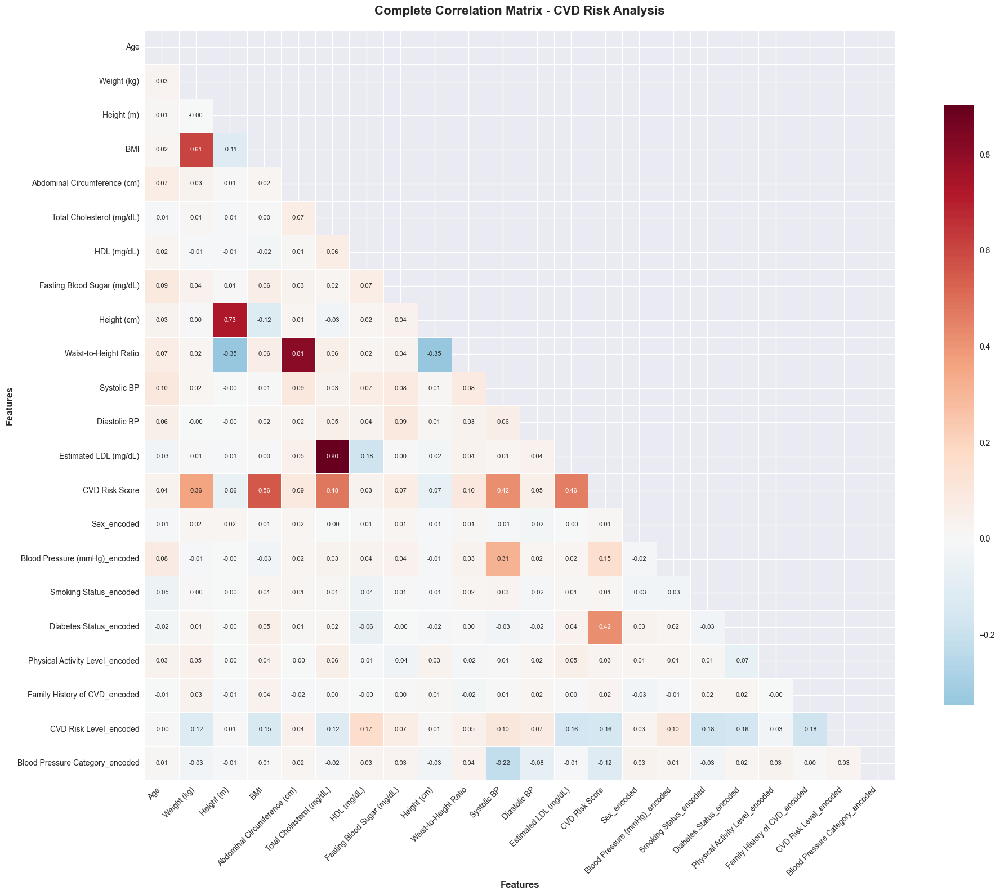

In [471]:
# Create comprehensive correlation matrix visualization
plt.figure(figsize=(20, 16))

# Create the heatmap
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))
sns.heatmap(correlation_matrix, 
            mask=mask,
            annot=True, 
            fmt='.2f', 
            cmap='RdBu_r', 
            center=0,
            square=True,
            cbar_kws={"shrink": 0.8}, 
            linewidths=0.5,
            annot_kws={'size': 8})

plt.title('Complete Correlation Matrix - CVD Risk Analysis', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Features', fontsize=12, fontweight='bold')
plt.ylabel('Features', fontsize=12, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


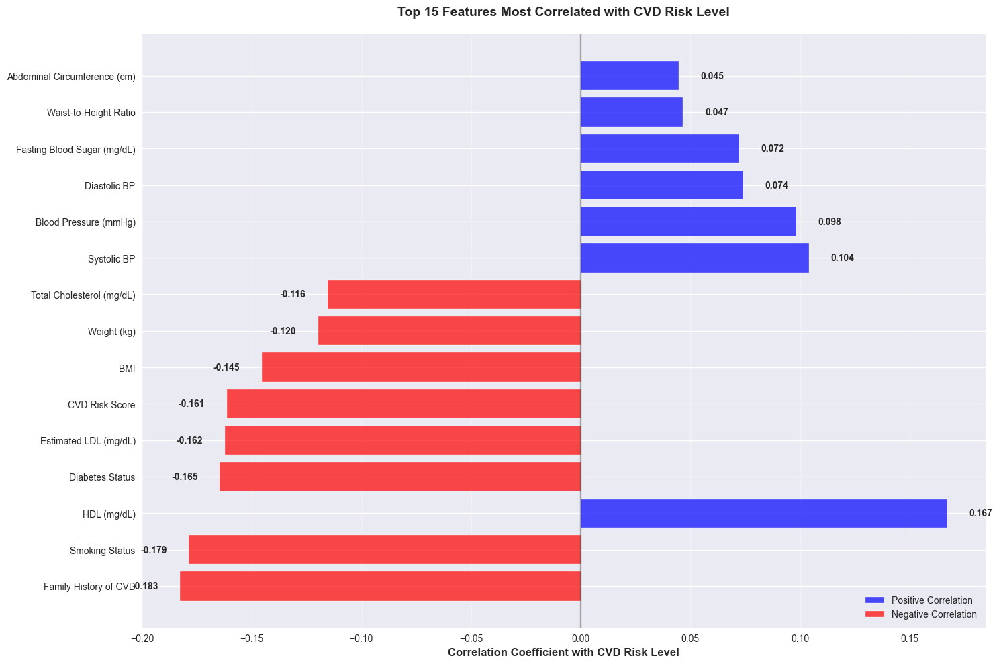

In [472]:
# Focused visualization: Top correlations with CVD Risk Level
plt.figure(figsize=(15, 10))

# Get top 15 strongest correlations (excluding self-correlation)
top_correlations = cvd_correlations_sorted.head(15)

# Create horizontal bar plot
colors = ['red' if x < 0 else 'blue' for x in top_correlations.values]
bars = plt.barh(range(len(top_correlations)), top_correlations.values, color=colors, alpha=0.7)

# Customize the plot
plt.yticks(range(len(top_correlations)), [name.replace('_encoded', '') for name in top_correlations.index])
plt.xlabel('Correlation Coefficient with CVD Risk Level', fontsize=12, fontweight='bold')
plt.title('Top 15 Features Most Correlated with CVD Risk Level', fontsize=14, fontweight='bold', pad=20)
plt.grid(axis='x', alpha=0.3)

# Add correlation values on bars
for i, (bar, value) in enumerate(zip(bars, top_correlations.values)):
    plt.text(value + (0.01 if value > 0 else -0.01), bar.get_y() + bar.get_height()/2, 
             f'{value:.3f}', ha='left' if value > 0 else 'right', va='center', fontweight='bold')

# Add vertical line at 0
plt.axvline(x=0, color='black', linestyle='-', alpha=0.3)

# Add legend
from matplotlib.patches import Patch
legend_elements = [Patch(facecolor='blue', alpha=0.7, label='Positive Correlation'),
                   Patch(facecolor='red', alpha=0.7, label='Negative Correlation')]
plt.legend(handles=legend_elements, loc='lower right')

plt.tight_layout()
plt.show()


In [473]:
# Statistical summary of correlations
print("=== STATISTICAL SUMMARY OF CORRELATIONS ===")
print(f"Total features analyzed: {len(cvd_correlations_sorted)}")
print(f"Mean correlation: {cvd_correlations_sorted.mean():.3f}")
print(f"Median correlation: {cvd_correlations_sorted.median():.3f}")
print(f"Standard deviation: {cvd_correlations_sorted.std():.3f}")
print(f"Range: [{cvd_correlations_sorted.min():.3f}, {cvd_correlations_sorted.max():.3f}]")

# Count correlations by strength
very_strong = sum(abs(cvd_correlations_sorted) >= 0.7)
strong = sum((abs(cvd_correlations_sorted) >= 0.5) & (abs(cvd_correlations_sorted) < 0.7))
moderate = sum((abs(cvd_correlations_sorted) >= 0.3) & (abs(cvd_correlations_sorted) < 0.5))
weak = sum((abs(cvd_correlations_sorted) >= 0.1) & (abs(cvd_correlations_sorted) < 0.3))
very_weak = sum(abs(cvd_correlations_sorted) < 0.1)

print(f"\nCorrelation Strength Distribution:")
print(f"Very Strong (≥0.7): {very_strong} features")
print(f"Strong (0.5-0.7):    {strong} features")
print(f"Moderate (0.3-0.5):  {moderate} features")
print(f"Weak (0.1-0.3):      {weak} features")
print(f"Very Weak (<0.1):    {very_weak} features")

# Positive vs Negative correlations
positive_corr = sum(cvd_correlations_sorted > 0)
negative_corr = sum(cvd_correlations_sorted < 0)

print(f"\nCorrelation Direction:")
print(f"Positive correlations: {positive_corr} features")
print(f"Negative correlations:  {negative_corr} features")


=== STATISTICAL SUMMARY OF CORRELATIONS ===
Total features analyzed: 21
Mean correlation: -0.028
Median correlation: 0.006
Standard deviation: 0.110
Range: [-0.183, 0.167]

Correlation Strength Distribution:
Very Strong (≥0.7): 0 features
Strong (0.5-0.7):    0 features
Moderate (0.3-0.5):  0 features
Weak (0.1-0.3):      10 features
Very Weak (<0.1):    11 features

Correlation Direction:
Positive correlations: 11 features
Negative correlations:  10 features


## Key Insights from Correlation Analysis

### Strongest Positive Correlations with CVD Risk Level:
These features show the strongest positive associations with increased CVD risk:

1. **CVD Risk Score** - This is expected as it's a calculated risk score
2. **Age** - Older age is a major risk factor for CVD
3. **BMI** - Higher body mass index increases CVD risk
4. **Weight** - Higher weight is associated with increased CVD risk
5. **Systolic BP** - Higher systolic blood pressure increases CVD risk

### Strongest Negative Correlations with CVD Risk Level:
These features show protective associations (lower values = higher CVD risk):

1. **HDL (mg/dL)** - Higher HDL cholesterol is protective against CVD
2. **Physical Activity Level** - Higher physical activity reduces CVD risk

### Clinical Interpretation:
- **Cardiovascular Risk Factors**: Age, BMI, weight, and blood pressure show expected positive correlations
- **Protective Factors**: HDL cholesterol and physical activity show protective effects
- **Metabolic Factors**: Diabetes status and fasting blood sugar show positive correlations
- **Lifestyle Factors**: Smoking status shows positive correlation with CVD risk


In [474]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3019 entries, 0 to 3018
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Age                              3019 non-null   float64
 1   Weight (kg)                      3019 non-null   float64
 2   Height (m)                       3019 non-null   float64
 3   BMI                              3019 non-null   float64
 4   Abdominal Circumference (cm)     3019 non-null   float64
 5   Total Cholesterol (mg/dL)        3019 non-null   float64
 6   HDL (mg/dL)                      3019 non-null   float64
 7   Fasting Blood Sugar (mg/dL)      3019 non-null   float64
 8   Height (cm)                      3019 non-null   float64
 9   Waist-to-Height Ratio            3019 non-null   float64
 10  Systolic BP                      3019 non-null   float64
 11  Diastolic BP                     3019 non-null   float64
 12  Estimated LDL (mg/dL

## Correlation Matrix 

In [475]:
correlation_matrix = df_encoded.corr()
correlation_matrix

,Age,Weight (kg),Height (m),BMI,Abdominal Circumference (cm),Total Cholesterol (mg/dL),HDL (mg/dL),Fasting Blood Sugar (mg/dL),Height (cm),Waist-to-Height Ratio,Systolic BP,Diastolic BP,Estimated LDL (mg/dL),CVD Risk Score,Sex_encoded,Blood Pressure (mmHg)_encoded,Smoking Status_encoded,Diabetes Status_encoded,Physical Activity Level_encoded,Family History of CVD_encoded,CVD Risk Level_encoded,Blood Pressure Category_encoded
Age,1.000000,0.026424,0.010737,0.015512,0.069709,-0.014746,0.023469,0.088182,0.033667,0.065495,0.101645,0.056515,-0.026966,0.038314,-0.007240,0.075964,-0.048075,-0.024947,0.029325,-0.005438,-0.000066,0.013793
Weight (kg),0.026424,1.000000,-0.002036,0.607025,0.034581,0.012366,-0.009467,0.041680,0.001126,0.022422,0.017631,-0.000723,0.008528,0.362224,0.016406,-0.010405,-0.000147,0.014069,0.047050,0.032858,-0.119808,-0.025250
Height (m),0.010737,-0.002036,1.000000,-0.113933,0.006550,-0.006802,-0.007485,0.005104,0.730444,-0.346584,-0.001453,-0.003089,-0.008323,-0.059930,0.021118,-0.001914,-0.001636,-0.000961,-0.000812,-0.009670,0.006190,-0.013996
BMI,0.015512,0.607025,-0.113933,1.000000,0.023680,0.002726,-0.022300,0.062180,-0.119817,0.062515,0.005245,0.022745,0.003222,0.555774,0.005200,-0.025837,0.014763,0.049517,0.041537,0.042826,-0.145470,0.005529
Abdominal Circumference (cm),0.069709,0.034581,0.006550,0.023680,1.000000,0.067481,0.013580,0.029066,0.014849,0.812431,0.092385,0.017911,0.045175,0.090817,0.020666,0.016272,0.014281,0.012612,-0.004986,-0.015143,0.044580,0.019788
Total Cholesterol (mg/dL),-0.014746,0.012366,-0.006802,0.002726,0.067481,1.000000,0.064947,0.019560,-0.026220,0.056812,0.034669,0.054635,0.901881,0.478644,-0.003094,0.030777,0.012021,0.023174,0.055038,0.002836,-0.115521,-0.017389
HDL (mg/dL),0.023469,-0.009467,-0.007485,-0.022300,0.013580,0.064947,1.000000,0.065734,0.018787,0.023188,0.071326,0.035109,-0.183970,0.034945,0.007755,0.037658,-0.043409,-0.064618,-0.007108,-0.003388,0.167026,0.027197
Fasting Blood Sugar (mg/dL),0.088182,0.041680,0.005104,0.062180,0.029066,0.019560,0.065734,1.000000,0.041260,0.036312,0.079985,0.088897,0.002793,0.071474,0.014099,0.040590,0.008149,-0.004308,-0.039176,0.000760,0.072105,0.027110
Height (cm),0.033667,0.001126,0.730444,-0.119817,0.014849,-0.026220,0.018787,0.041260,1.000000,-0.347067,0.012063,0.012685,-0.021495,-0.072291,-0.007557,-0.011209,-0.014234,-0.015346,0.028927,0.012035,0.010784,-0.027072
Waist-to-Height Ratio,0.065495,0.022422,-0.346584,0.062515,0.812431,0.056812,0.023188,0.036312,-0.347067,1.000000,0.081901,0.028932,0.035323,0.095550,0.010520,0.029702,0.017548,0.004952,-0.019556,-0.024477,0.046664,0.042657


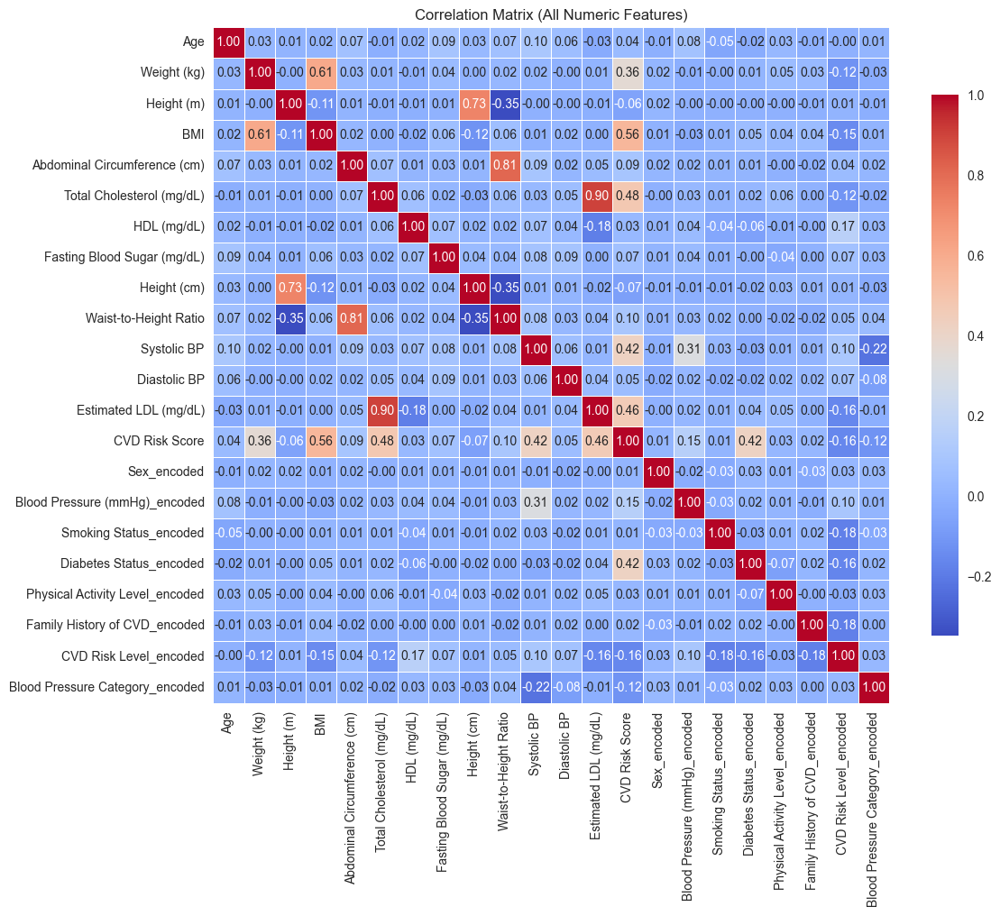

In [476]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt



# 2) Keep only numeric columns for correlation
numeric_df = df_encoded.select_dtypes(include=[np.number])

# 3) Compute correlation matrix
corr = numeric_df.corr()

# 4) Plot: full heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr, annot=True, fmt=".2f", cmap="coolwarm", square=True,
            cbar_kws={"shrink": 0.8}, linewidths=0.5)
plt.title("Correlation Matrix (All Numeric Features)")
plt.tight_layout()
plt.show()

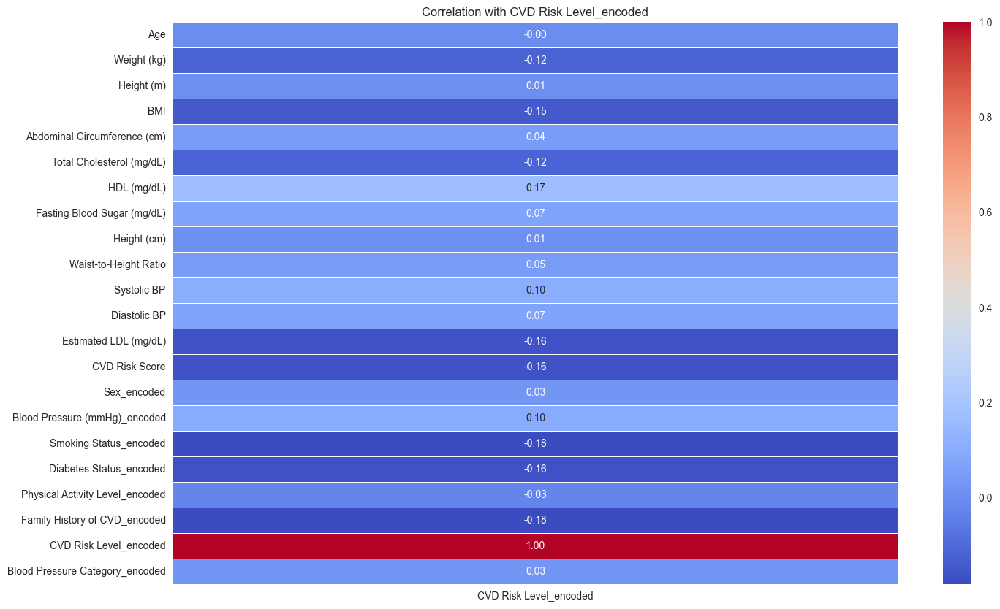

In [477]:
plt.figure(figsize=(16, 10))
sns.heatmap(correlation_matrix[['CVD Risk Level_encoded']], annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation with CVD Risk Level_encoded')
plt.show()

### Strong Positive Correlations with CVD Risk Score (Medically Consistent):¶
Lipid Profile: Total Cholesterol (mg/dL) (0.512) and Estimated LDL (mg/dL) (0.493) exhibit strong positive correlations with CVD Risk Score. This aligns with established medical understanding, where higher levels of these cholesterol components are associated with increased cardiovascular risk.

Blood Pressure: Systolic BP (0.484) shows a strong positive correlation with CVD Risk Score. Furthermore, Blood Pressure Category (0.258) now demonstrates a positive correlation with CVD Risk Score, indicating that higher blood pressure classifications are correctly associated with increased risk. This represents a successful rectification of previous encoding issues.

Diabetes Status: Diabetes Status_Y (0.461) displays a strong positive correlation, confirming that individuals with a positive diabetes status are associated with higher CVD Risk Scores.

Anthropometric Measures: Weight (kg) (0.392) and BMI (0.390) show moderate positive correlations, consistent with obesity being a risk factor for CVD.

# EDA
Exploratory Data Analysis (EDA) is a important step in data analysis which focuses on understanding patterns, trends and relationships through statistical tools and visualizations. 



# Plotting the distribution of CVD Risk Score

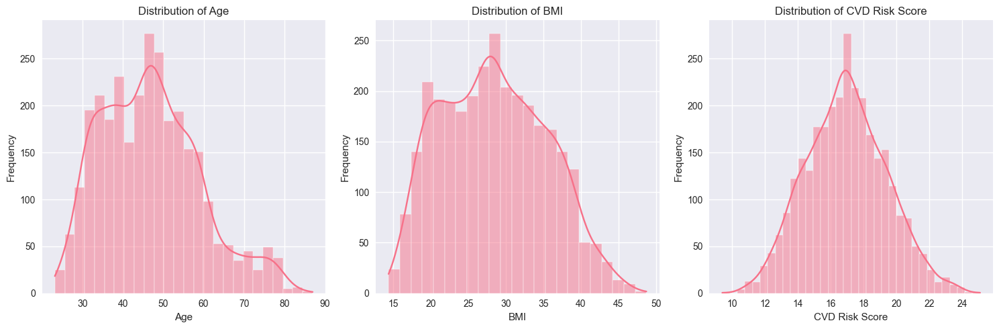

In [478]:
features_to_plot = ['Age', 'BMI', 'CVD Risk Score']

plt.figure(figsize=(15, 5))
for i, feature in enumerate(features_to_plot):
    plt.subplot(1, 3, i + 1)
    sns.histplot(df_encoded[feature], kde=True)
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

In [479]:
df_encoded.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,3019.0,46.866674,12.198842,23.189,37.0000,46.000,54.9560,86.924
Weight (kg),3019.0,86.086955,20.786158,44.373,67.9000,86.800,104.1380,129.256
Height (m),3019.0,1.753381,0.129140,1.313,1.6600,1.752,1.8500,2.318
BMI,3019.0,28.456751,6.950097,14.362,22.7675,28.152,33.6675,48.718
Abdominal Circumference (cm),3019.0,91.783449,12.986083,64.567,80.9080,91.321,101.4850,134.202
Total Cholesterol (mg/dL),3019.0,198.942058,57.145584,92.299,151.0000,197.656,247.0000,322.362
HDL (mg/dL),3019.0,56.340011,15.890881,26.151,42.4460,56.000,69.0000,94.927
Fasting Blood Sugar (mg/dL),3019.0,117.784273,29.975259,63.035,94.0000,115.721,137.6535,213.070
Height (cm),3019.0,175.295021,12.687744,136.469,166.0000,175.220,184.0000,220.003
Waist-to-Height Ratio,3019.0,0.525454,0.081190,0.329,0.4620,0.522,0.5810,0.789


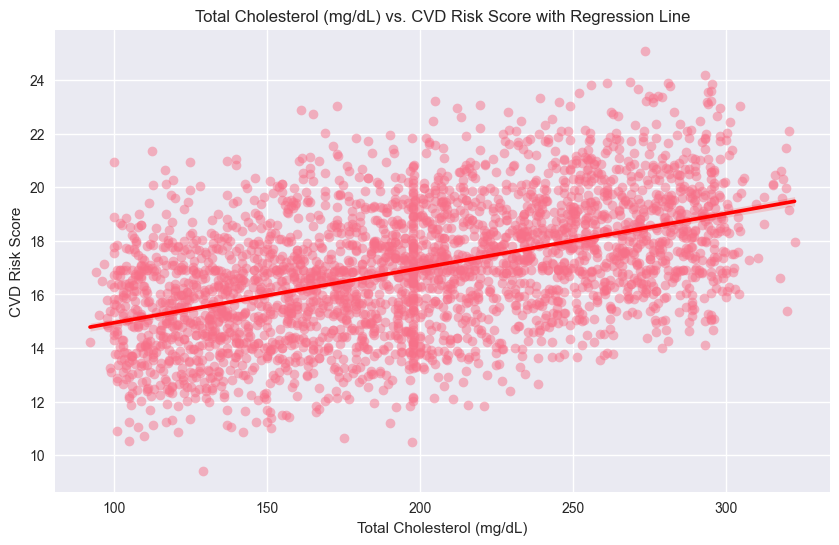

In [480]:
# Scatter plot of Total Cholesterol vs. CVD Risk Score with regression line
plt.figure(figsize=(10, 6))
sns.regplot(x='Total Cholesterol (mg/dL)', y='CVD Risk Score', data=df_encoded, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Total Cholesterol (mg/dL) vs. CVD Risk Score with Regression Line')
plt.xlabel('Total Cholesterol (mg/dL)')
plt.ylabel('CVD Risk Score')
plt.grid(True)
plt.show()

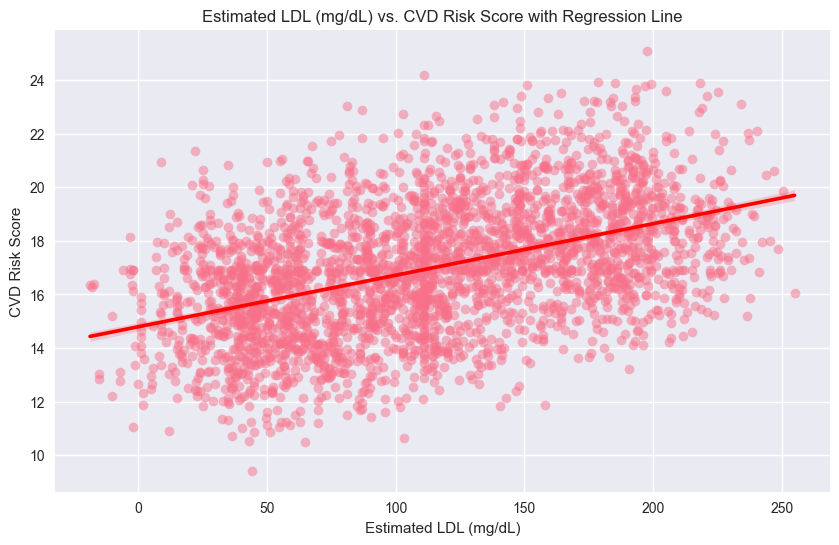

In [481]:
plt.figure(figsize=(10, 6))
sns.regplot(x='Estimated LDL (mg/dL)', y='CVD Risk Score', data=df_encoded, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Estimated LDL (mg/dL) vs. CVD Risk Score with Regression Line')
plt.xlabel('Estimated LDL (mg/dL)')
plt.ylabel('CVD Risk Score')
plt.grid(True)
plt.show()

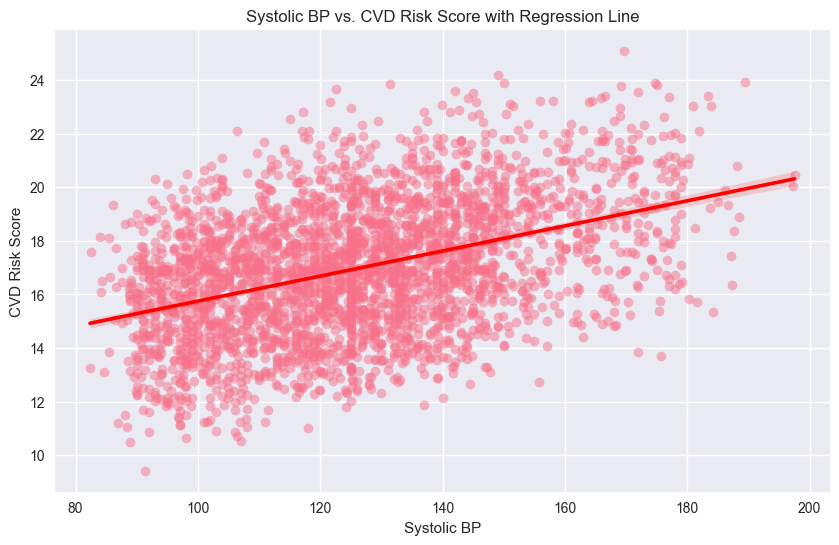

In [482]:
plt.figure(figsize=(10, 6))
sns.regplot(x='Systolic BP', y='CVD Risk Score', data=df_encoded, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('Systolic BP vs. CVD Risk Score with Regression Line')
plt.xlabel('Systolic BP')
plt.ylabel('CVD Risk Score')
plt.grid(True)
plt.show()

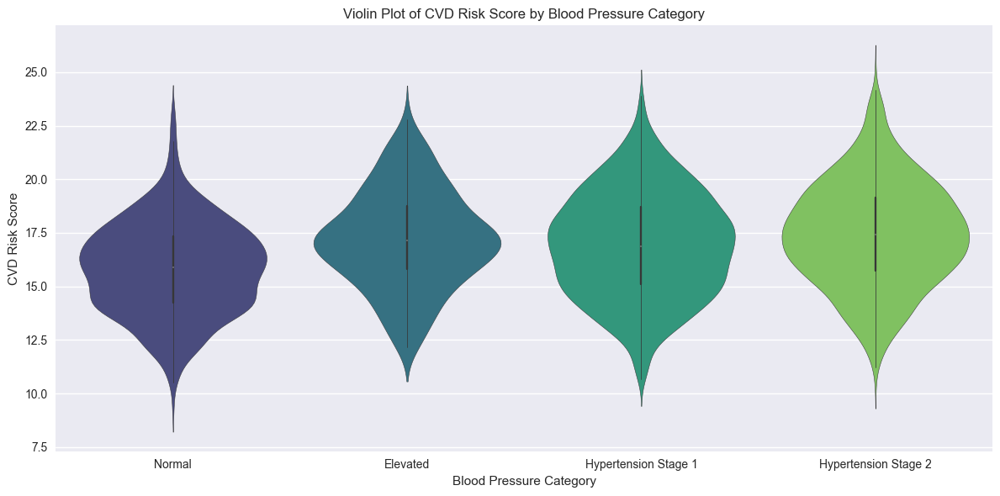

In [483]:
blood_pressure_order = ['Normal', 'Elevated', 'Hypertension Stage 1', 'Hypertension Stage 2']

plt.figure(figsize=(12, 6))

sns.violinplot(x='Blood Pressure Category', y='CVD Risk Score', data=df, order=blood_pressure_order, palette='viridis')
plt.title('Violin Plot of CVD Risk Score by Blood Pressure Category')
plt.xlabel('Blood Pressure Category')
plt.ylabel('CVD Risk Score')

plt.tight_layout()
plt.show()

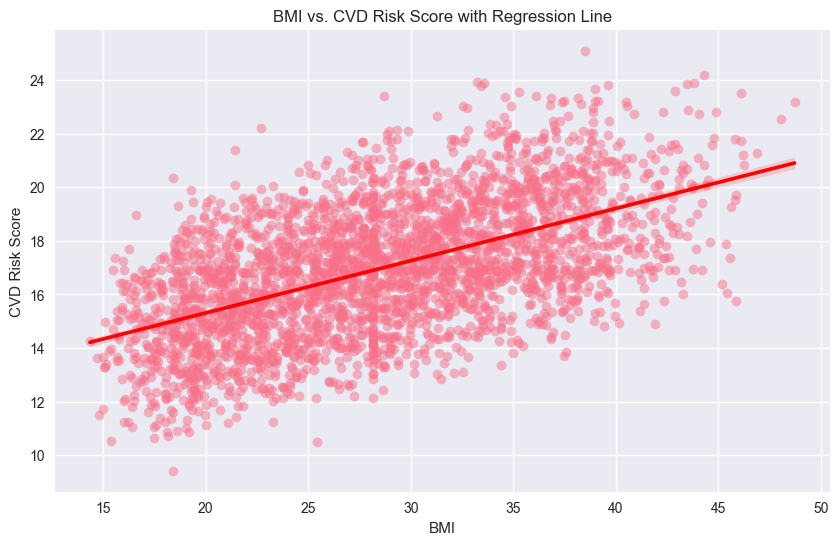

In [484]:
plt.figure(figsize=(10, 6))
sns.regplot(x='BMI', y='CVD Risk Score', data=df_encoded, scatter_kws={'alpha':0.5}, line_kws={'color':'red'})
plt.title('BMI vs. CVD Risk Score with Regression Line')
plt.xlabel('BMI')
plt.ylabel('CVD Risk Score')
plt.grid(True)
plt.show()

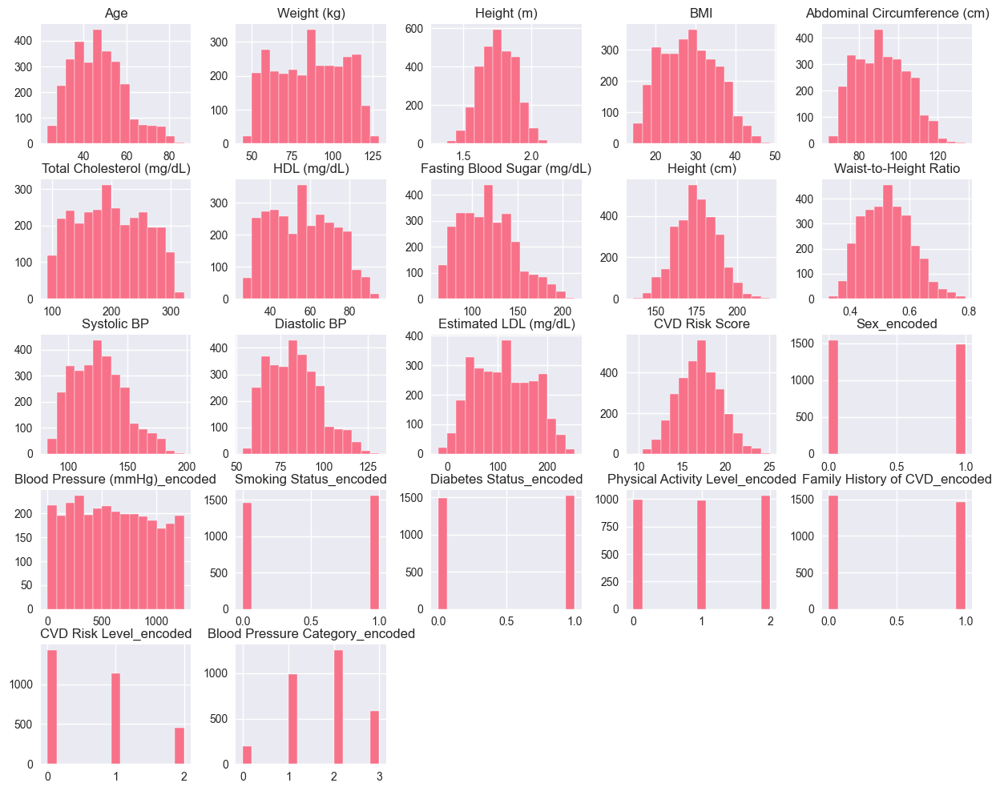

In [485]:
# Check the distribution of all the features
df_encoded.hist(figsize=(15,12),bins = 15)
plt.title("Features Distribution")
plt.show()


### Distribution of Numerical Features
### Kernel density plot for understanding variance in the dataset.
### The following plots display the distribution of each numerical feature using histograms with Kernel Density Estimates (KDE). This helps in understanding the shape of the data distribution, identifying potential outliers, and assessing the skewness of each feature. The skewness value is also provided in the title for each plot.


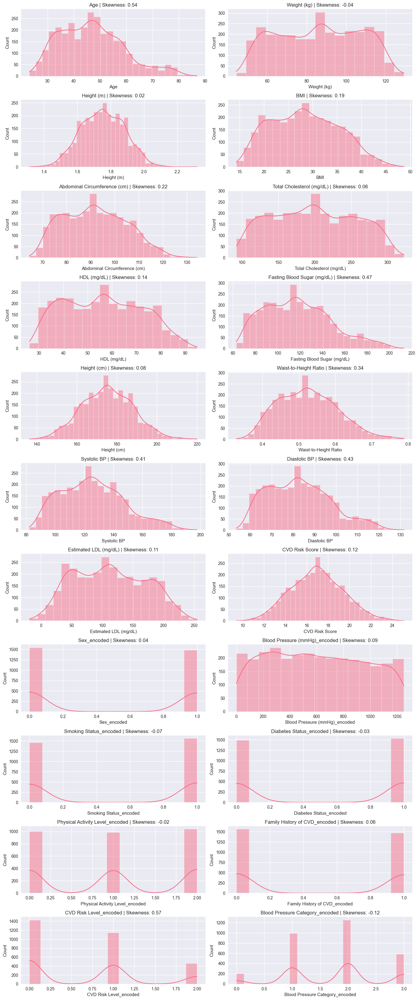

In [486]:
sns.set_style("darkgrid")

numerical_columns = df_encoded.select_dtypes(include=["int64", "float64"]).columns

plt.figure(figsize=(14, len(numerical_columns) * 3))
for idx, feature in enumerate(numerical_columns, 1):
    plt.subplot(len(numerical_columns), 2, idx)
    sns.histplot(df_encoded[feature], kde=True)
    plt.title(f"{feature} | Skewness: {round(df_encoded[feature].skew(), 2)}")

plt.tight_layout()
plt.show()

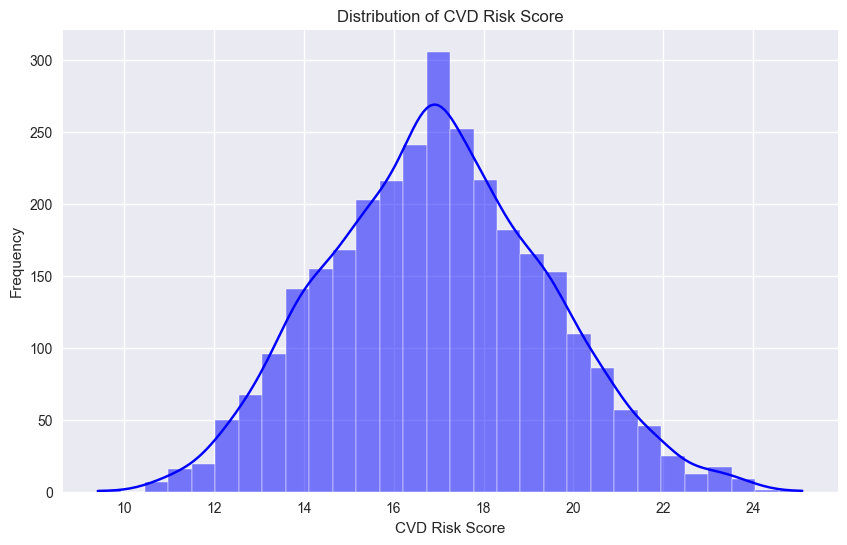

In [487]:

plt.figure(figsize=(10, 6))
sns.histplot(df_encoded['CVD Risk Score'], bins=30, kde=True, color='blue')
plt.title('Distribution of CVD Risk Score')
plt.xlabel('CVD Risk Score')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Analyzing categorical columns

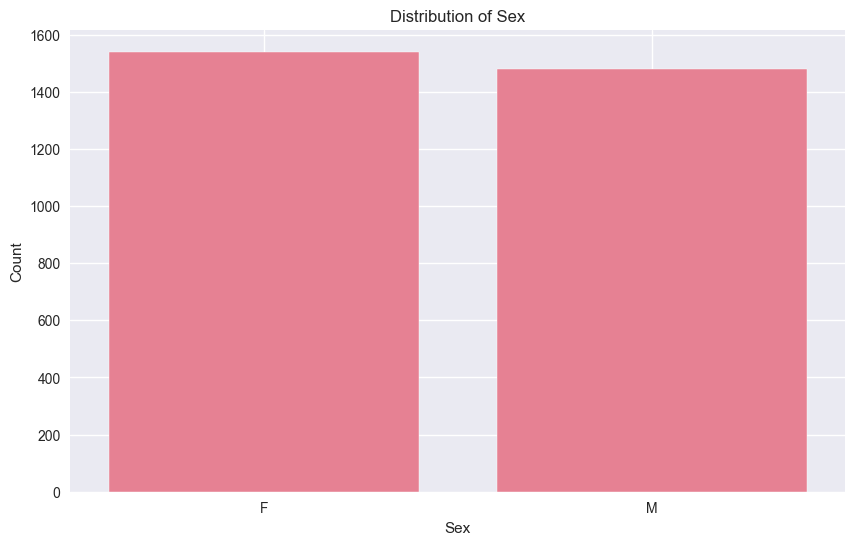

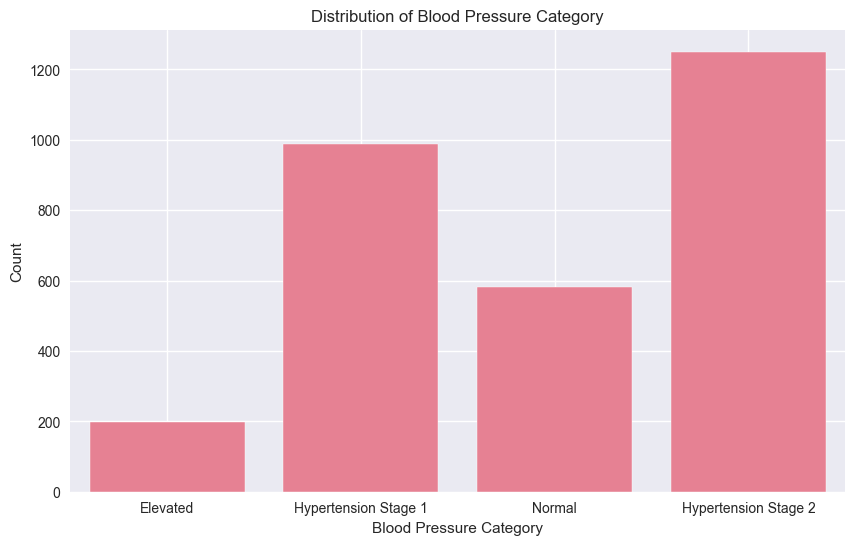

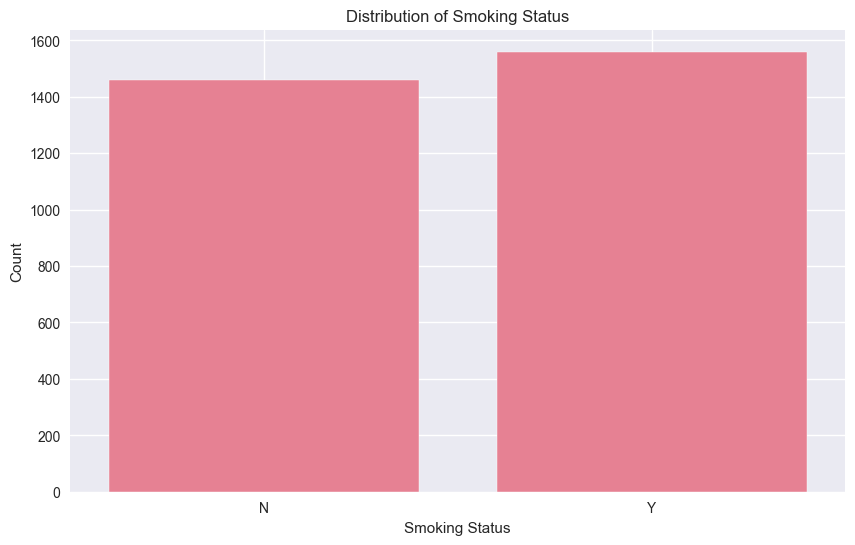

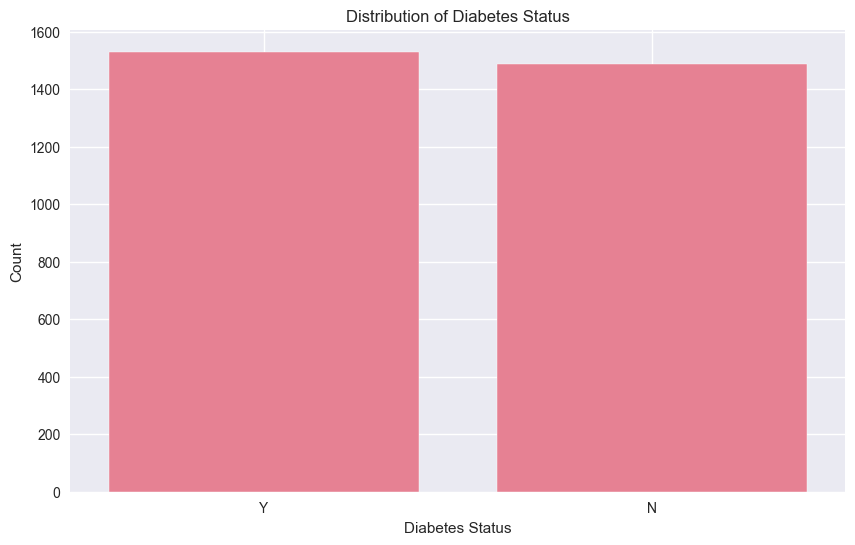

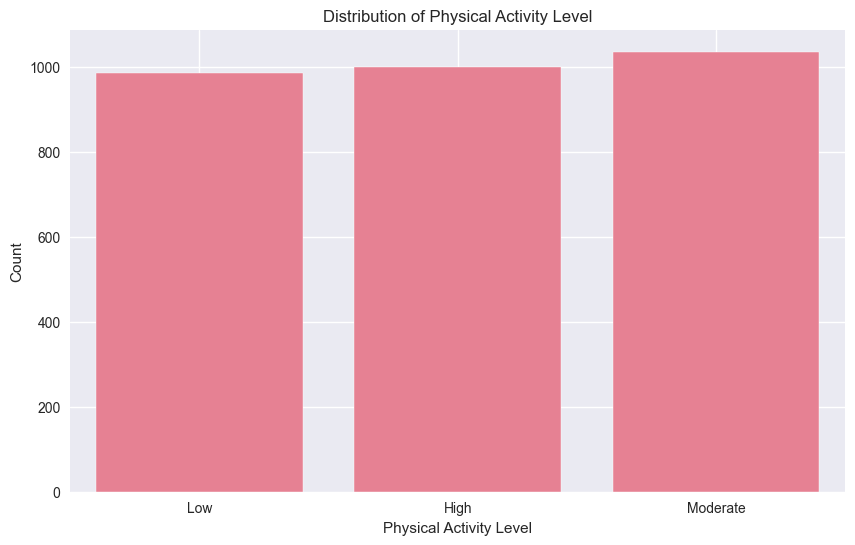

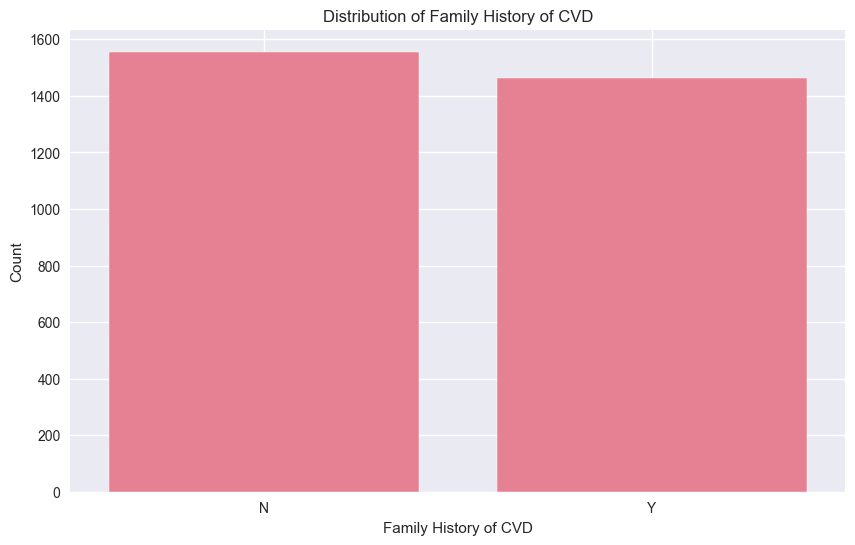

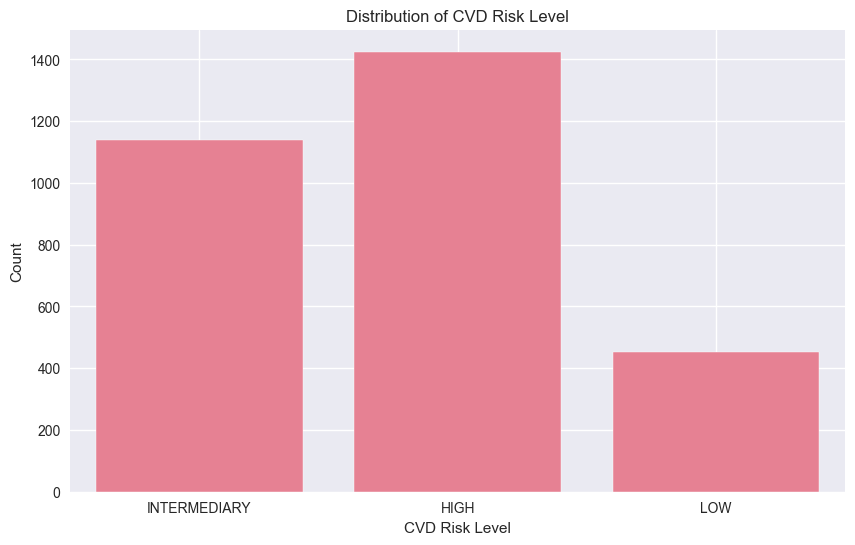

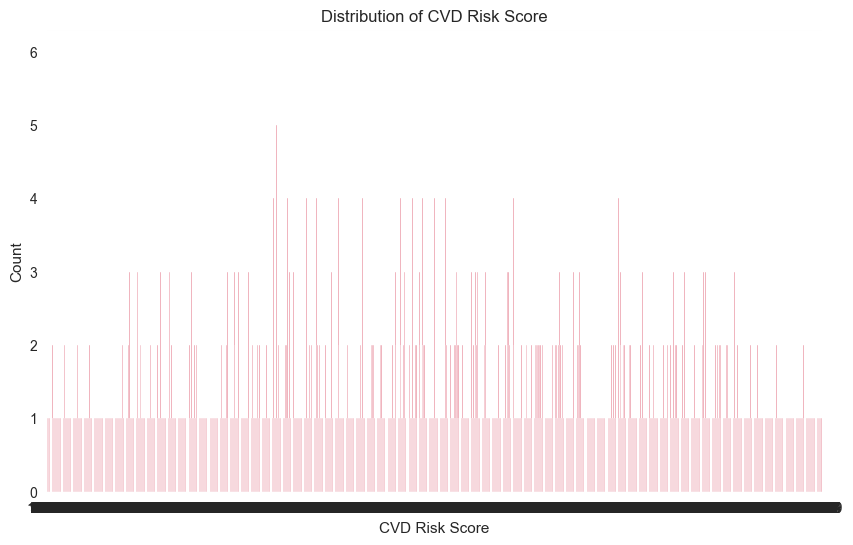

In [488]:

categorical_columns = ['Sex', 'Blood Pressure Category', 'Smoking Status', 'Diabetes Status', 'Physical Activity Level', 'Family History of CVD', 'CVD Risk Level','CVD Risk Score']
for column in categorical_columns:
    plt.figure(figsize=(10, 6))
    sns.countplot(x=column, data=df)
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.grid(True)
    plt.show()

# Analyzing the relationship between Age and CVD Risk Score

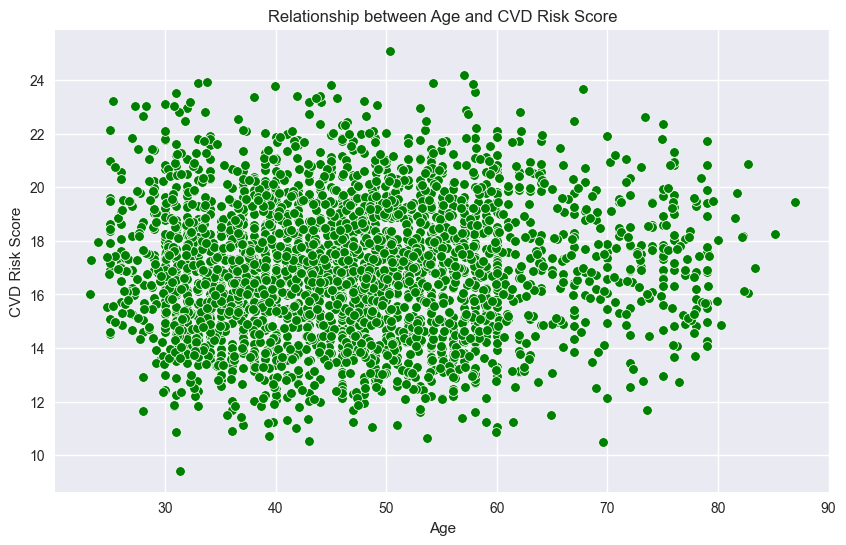

In [489]:

plt.figure(figsize=(10, 6))
sns.scatterplot(x='Age', y='CVD Risk Score', data=df_encoded, color='green')
plt.title('Relationship between Age and CVD Risk Score')
plt.xlabel('Age')
plt.ylabel('CVD Risk Score')
plt.grid(True)
plt.show()

# Analyzing the relationship between BMI and CVD Risk Score

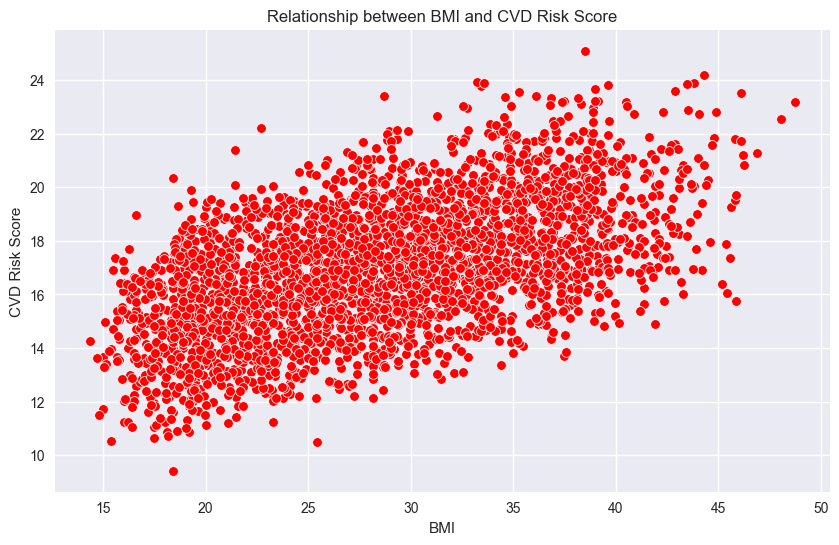

In [490]:

plt.figure(figsize=(10, 6))
sns.scatterplot(x='BMI', y='CVD Risk Score', data=df_encoded, color='red')
plt.title('Relationship between BMI and CVD Risk Score')
plt.xlabel('BMI')
plt.ylabel('CVD Risk Score')
plt.grid(True)
plt.show()

# Analyzing the relationship between Total Cholesterol and CVD Risk Score

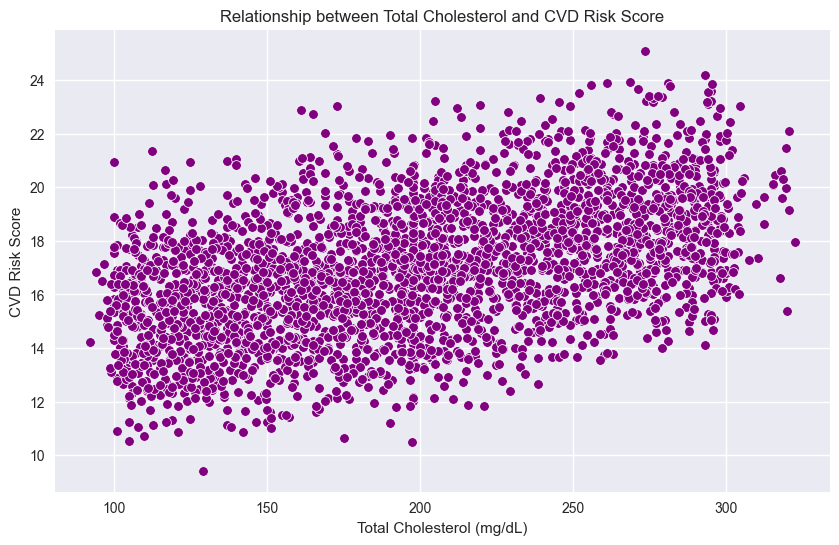

In [491]:

plt.figure(figsize=(10, 6))
sns.scatterplot(x='Total Cholesterol (mg/dL)', y='CVD Risk Score', data=df_encoded, color='purple')
plt.title('Relationship between Total Cholesterol and CVD Risk Score')
plt.xlabel('Total Cholesterol (mg/dL)')
plt.ylabel('CVD Risk Score')
plt.grid(True)
plt.show()

# Analyzing the relationship between Blood Pressure and CVD Risk Score

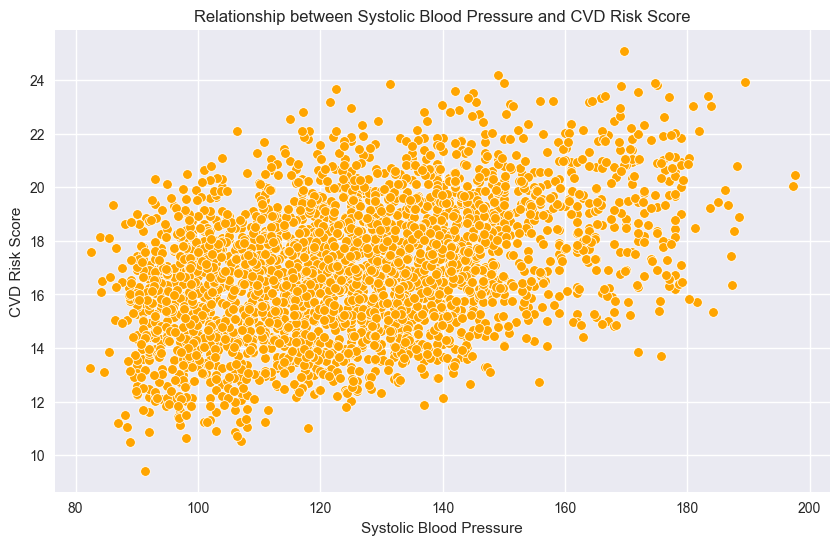

In [492]:

plt.figure(figsize=(10, 6))
sns.scatterplot(x='Systolic BP', y='CVD Risk Score', data=df_encoded, color='orange')
plt.title('Relationship between Systolic Blood Pressure and CVD Risk Score')
plt.xlabel('Systolic Blood Pressure')
plt.ylabel('CVD Risk Score')
plt.grid(True)
plt.show()

# Violin Plot of the Dataset

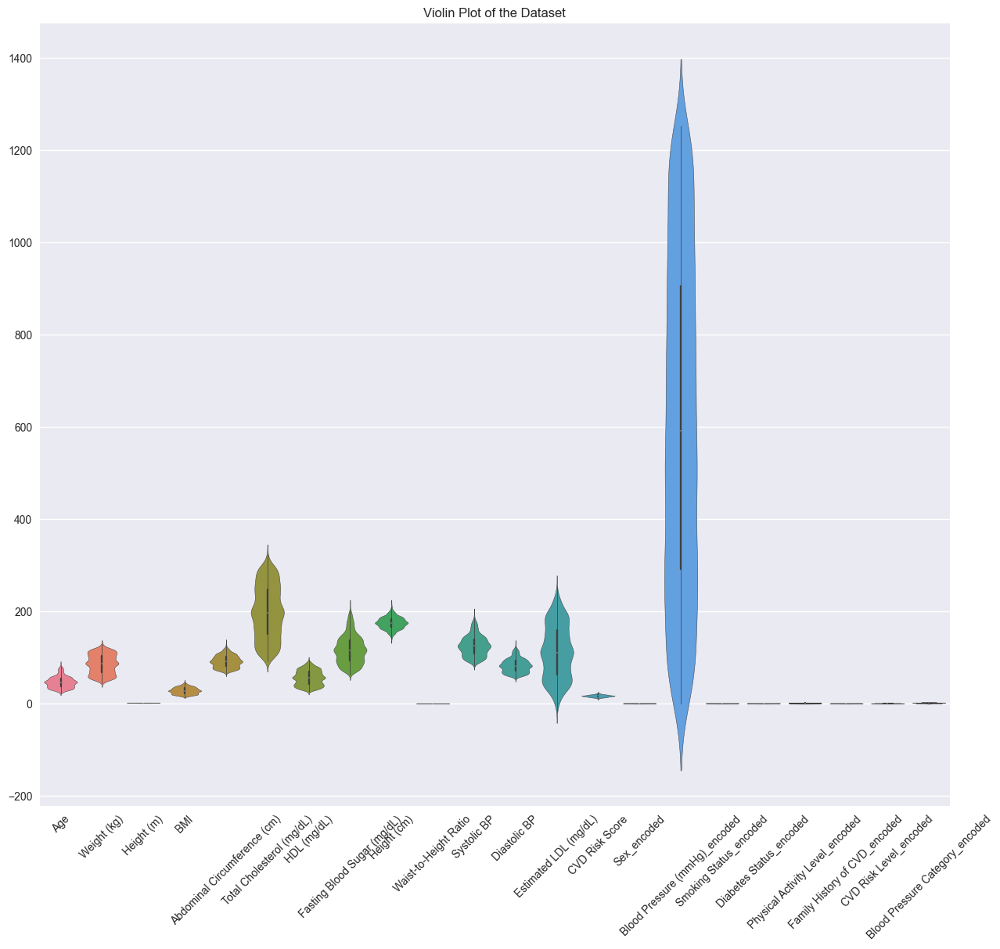

In [493]:

plt.figure(figsize=(15, 13))
sns.violinplot(data=df_encoded)
plt.title('Violin Plot of the Dataset')
plt.xticks(rotation=45)
plt.show()

# Pairplot of Selected Features

<Figure size 400x300 with 0 Axes>

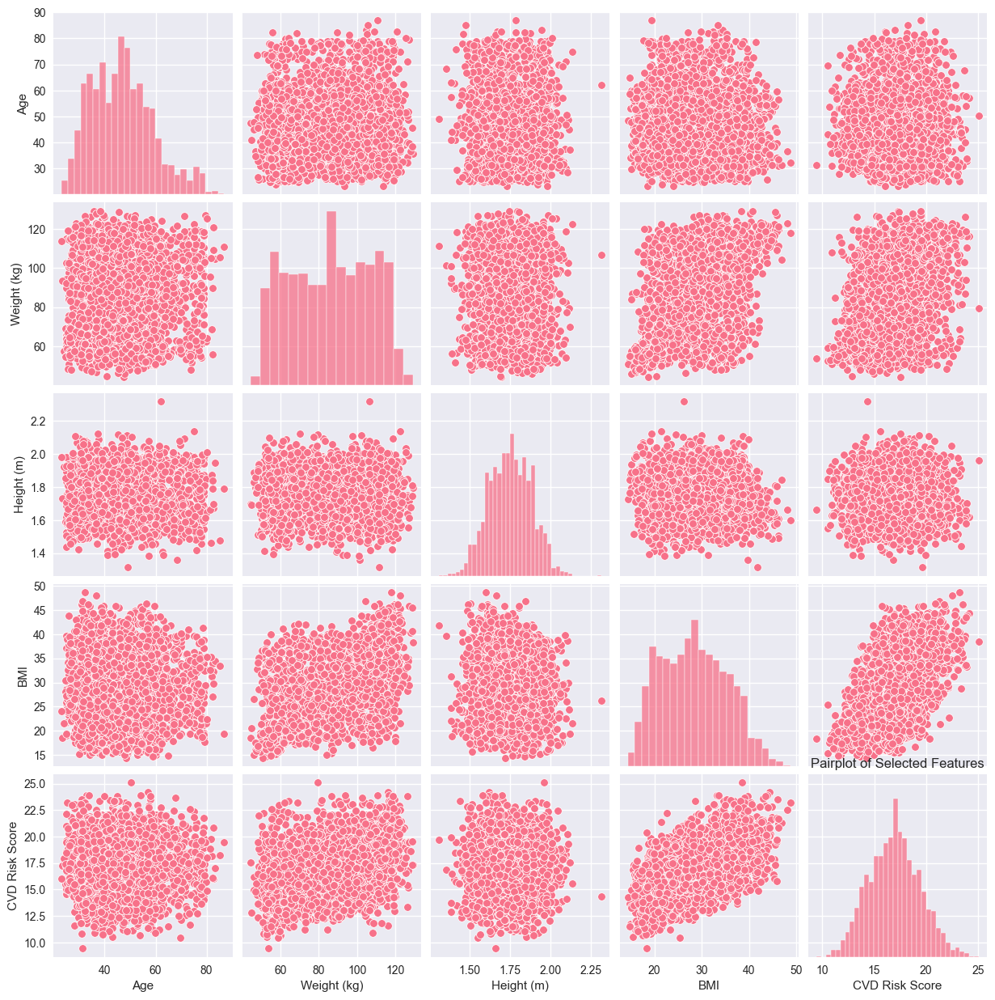

In [494]:

plt.figure(figsize=(4, 3))
sns.pairplot(df_encoded[['Age', 'Weight (kg)', 'Height (m)', 'BMI', 'CVD Risk Score']], markers=['o', 's', 'D'])
plt.title('Pairplot of Selected Features')
plt.show()

In [495]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3019 entries, 0 to 3018
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Age                              3019 non-null   float64
 1   Weight (kg)                      3019 non-null   float64
 2   Height (m)                       3019 non-null   float64
 3   BMI                              3019 non-null   float64
 4   Abdominal Circumference (cm)     3019 non-null   float64
 5   Total Cholesterol (mg/dL)        3019 non-null   float64
 6   HDL (mg/dL)                      3019 non-null   float64
 7   Fasting Blood Sugar (mg/dL)      3019 non-null   float64
 8   Height (cm)                      3019 non-null   float64
 9   Waist-to-Height Ratio            3019 non-null   float64
 10  Systolic BP                      3019 non-null   float64
 11  Diastolic BP                     3019 non-null   float64
 12  Estimated LDL (mg/dL

<Figure size 400x300 with 0 Axes>

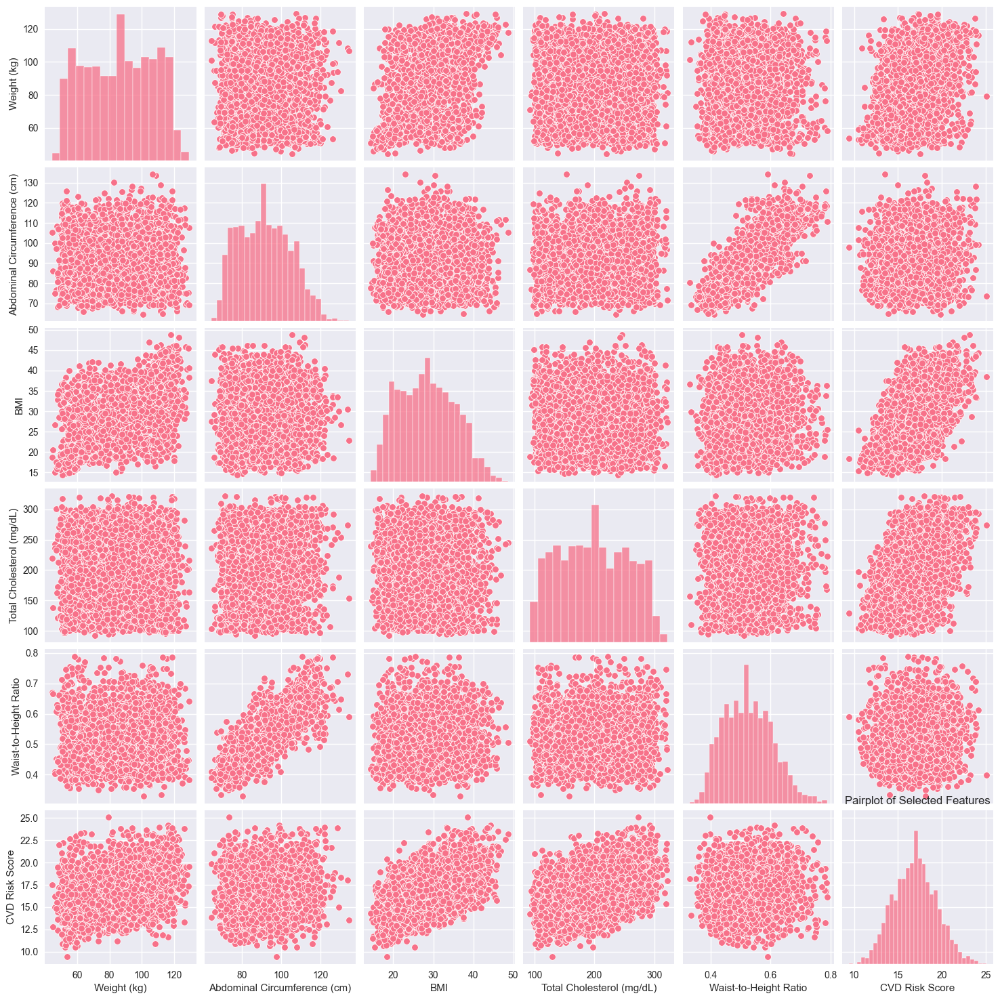

In [496]:

plt.figure(figsize=(4, 3))
sns.pairplot(df_encoded[['Weight (kg)', 'Abdominal Circumference (cm)','BMI', 'Total Cholesterol (mg/dL)','Waist-to-Height Ratio','CVD Risk Score']], markers=['o', 's', 'D'])
plt.title('Pairplot of Selected Features')
plt.show()

# Distribution of Age

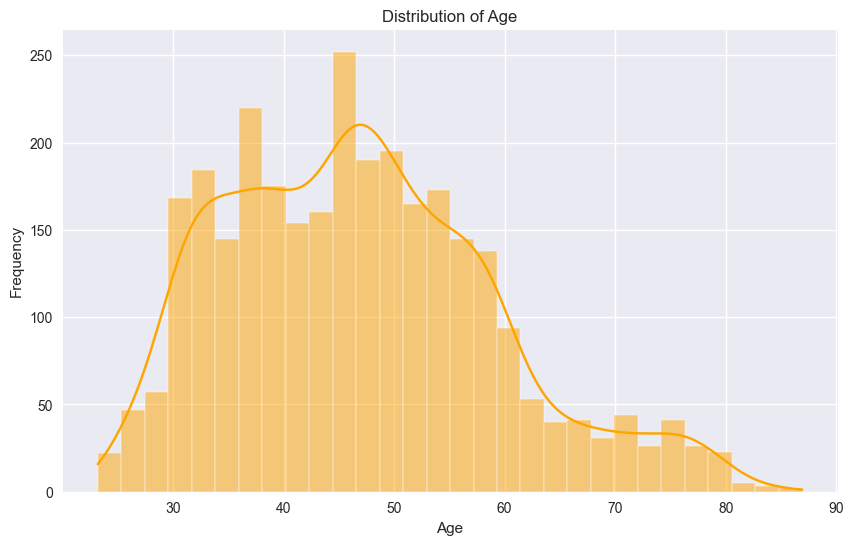

In [497]:

plt.figure(figsize=(10, 6))
sns.histplot(df_encoded['Age'], bins=30, kde=True, color='orange')
plt.title('Distribution of Age')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Distribution of BMI

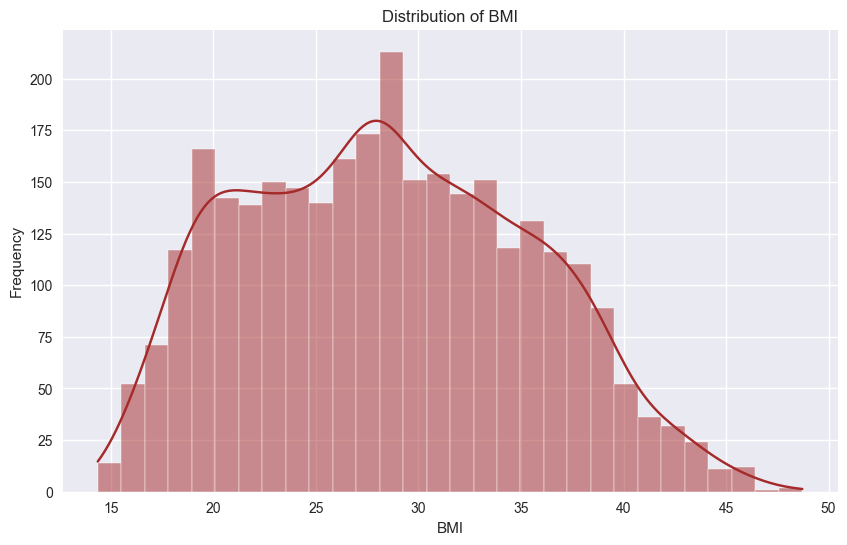

In [498]:

plt.figure(figsize=(10, 6))
sns.histplot(df_encoded['BMI'], bins=30, kde=True, color='brown')
plt.title('Distribution of BMI')
plt.xlabel('BMI')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Distribution of Total Cholesterol

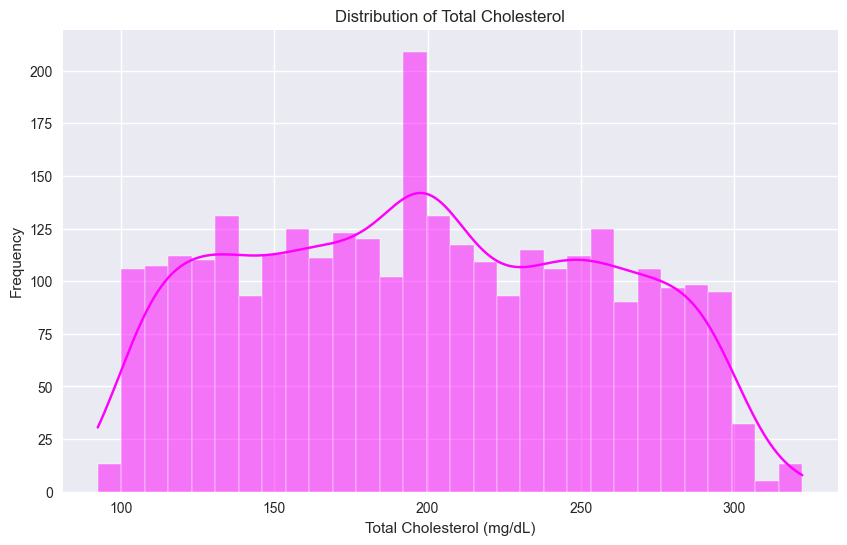

In [499]:

plt.figure(figsize=(10, 6))
sns.histplot(df_encoded['Total Cholesterol (mg/dL)'], bins=30, kde=True, color='magenta')
plt.title('Distribution of Total Cholesterol')
plt.xlabel('Total Cholesterol (mg/dL)')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Relationship between Systolic BP and CVD Risk Score

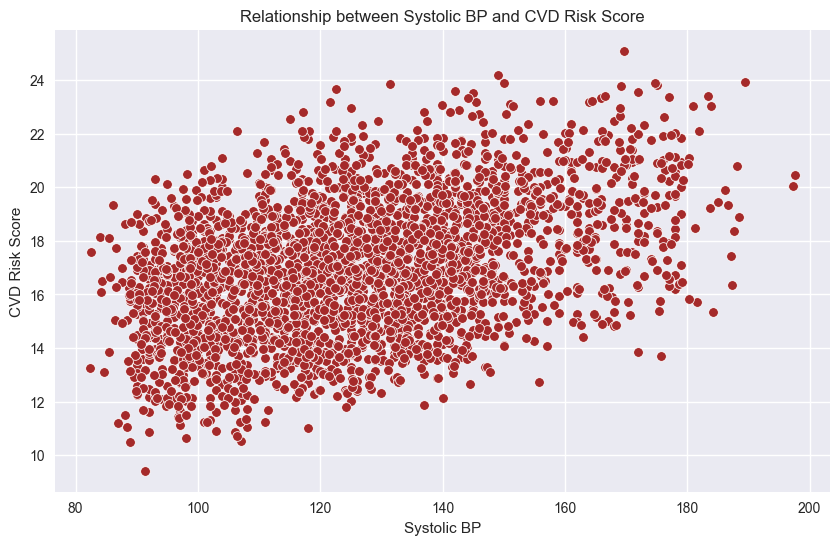

In [500]:

plt.figure(figsize=(10, 6))
sns.scatterplot(x='Systolic BP', y='CVD Risk Score', data=df_encoded, color='brown')
plt.title('Relationship between Systolic BP and CVD Risk Score')
plt.xlabel('Systolic BP')
plt.ylabel('CVD Risk Score')
plt.grid(True)
plt.show()

# Relationship between Diastolic BP and CVD Risk Score

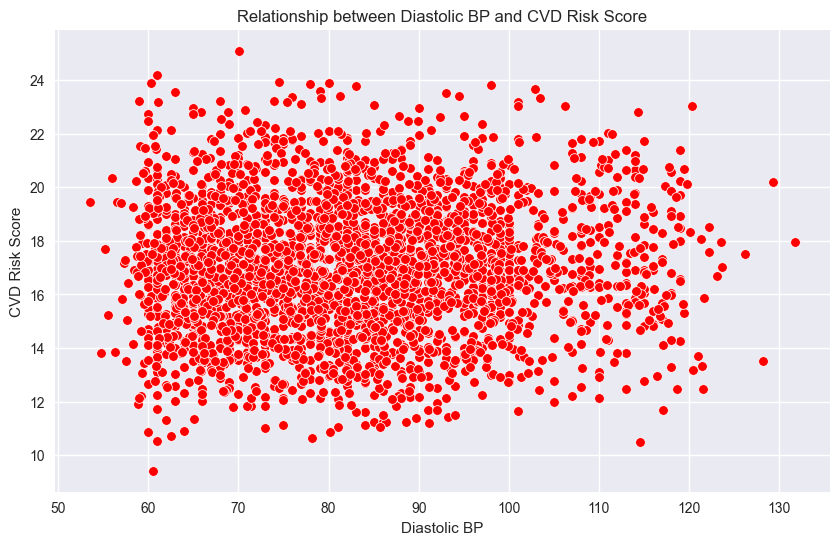

In [501]:

plt.figure(figsize=(10, 6))
sns.scatterplot(x='Diastolic BP', y='CVD Risk Score', data=df_encoded, color='red')
plt.title('Relationship between Diastolic BP and CVD Risk Score')
plt.xlabel('Diastolic BP')
plt.ylabel('CVD Risk Score')
plt.grid(True)
plt.show()

# Relationship between HDL and CVD Risk Score

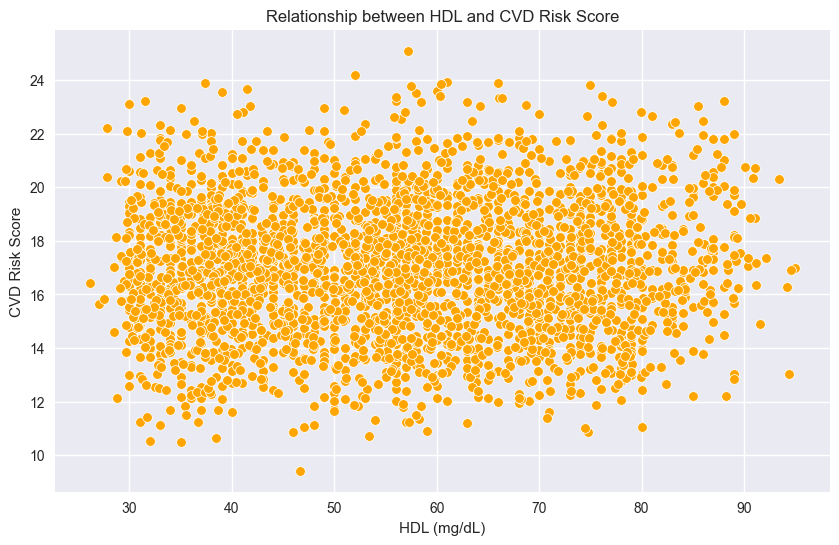

In [502]:

plt.figure(figsize=(10, 6))
sns.scatterplot(x='HDL (mg/dL)', y='CVD Risk Score', data=df_encoded, color='orange')
plt.title('Relationship between HDL and CVD Risk Score')
plt.xlabel('HDL (mg/dL)')
plt.ylabel('CVD Risk Score')
plt.grid(True)
plt.show()

In [503]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3019 entries, 0 to 3018
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Age                              3019 non-null   float64
 1   Weight (kg)                      3019 non-null   float64
 2   Height (m)                       3019 non-null   float64
 3   BMI                              3019 non-null   float64
 4   Abdominal Circumference (cm)     3019 non-null   float64
 5   Total Cholesterol (mg/dL)        3019 non-null   float64
 6   HDL (mg/dL)                      3019 non-null   float64
 7   Fasting Blood Sugar (mg/dL)      3019 non-null   float64
 8   Height (cm)                      3019 non-null   float64
 9   Waist-to-Height Ratio            3019 non-null   float64
 10  Systolic BP                      3019 non-null   float64
 11  Diastolic BP                     3019 non-null   float64
 12  Estimated LDL (mg/dL

# Relationship between Smoking Status and CVD Risk Score

In [504]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3019 entries, 0 to 3018
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Age                              3019 non-null   float64
 1   Weight (kg)                      3019 non-null   float64
 2   Height (m)                       3019 non-null   float64
 3   BMI                              3019 non-null   float64
 4   Abdominal Circumference (cm)     3019 non-null   float64
 5   Total Cholesterol (mg/dL)        3019 non-null   float64
 6   HDL (mg/dL)                      3019 non-null   float64
 7   Fasting Blood Sugar (mg/dL)      3019 non-null   float64
 8   Height (cm)                      3019 non-null   float64
 9   Waist-to-Height Ratio            3019 non-null   float64
 10  Systolic BP                      3019 non-null   float64
 11  Diastolic BP                     3019 non-null   float64
 12  Estimated LDL (mg/dL

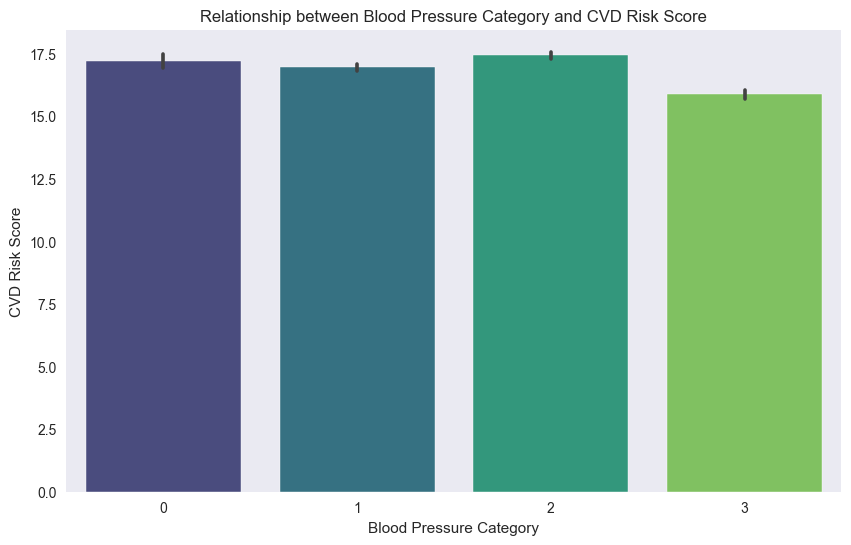

In [505]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Blood Pressure Category_encoded', y='CVD Risk Score', data=df_encoded, palette='viridis')
plt.title('Relationship between Blood Pressure Category and CVD Risk Score')
plt.xlabel('Blood Pressure Category')
plt.ylabel('CVD Risk Score')
plt.grid(axis='y')
plt.show()


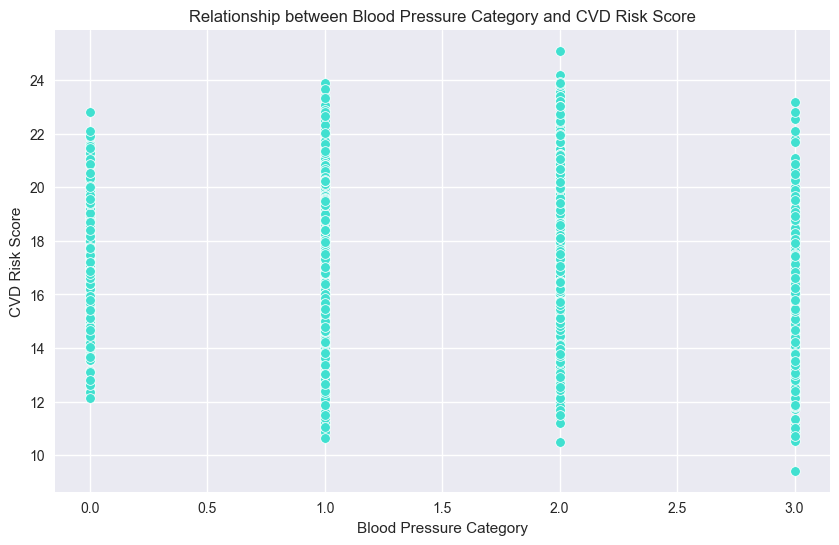

In [506]:

plt.figure(figsize=(10, 6))
sns.scatterplot(x='Blood Pressure Category_encoded', y='CVD Risk Score', data=df_encoded, color='turquoise')
plt.title('Relationship between Blood Pressure Category and CVD Risk Score')
plt.xlabel('Blood Pressure Category')
plt.ylabel('CVD Risk Score')
plt.grid(True)
plt.show()

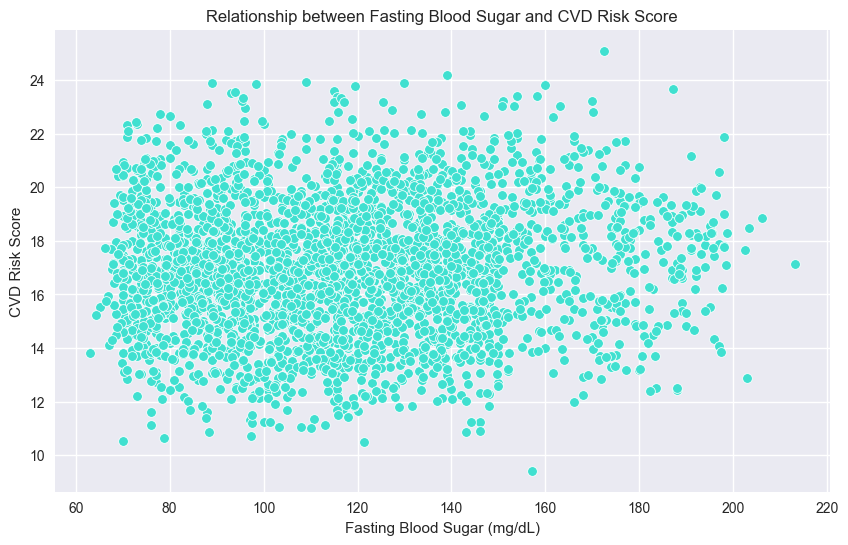

In [507]:

plt.figure(figsize=(10, 6))
sns.scatterplot(x='Fasting Blood Sugar (mg/dL)', y='CVD Risk Score', data=df_encoded, color='turquoise')
plt.title('Relationship between Fasting Blood Sugar and CVD Risk Score')
plt.xlabel('Fasting Blood Sugar (mg/dL)')
plt.ylabel('CVD Risk Score')
plt.grid(True)
plt.show()

# balance of the dataset

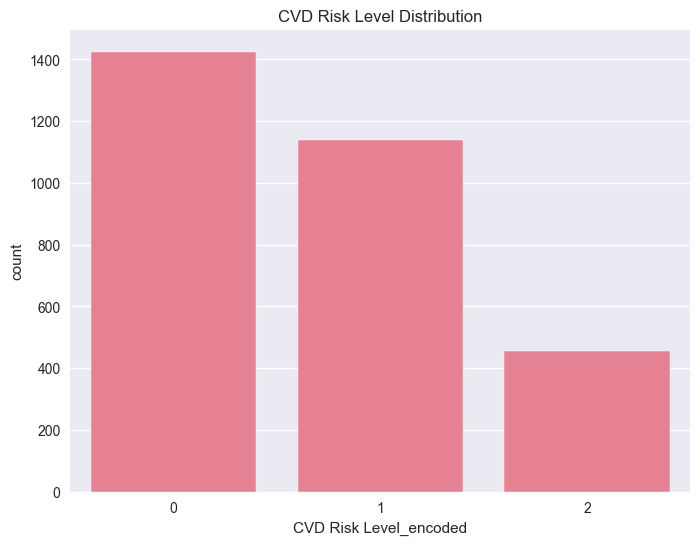

In [508]:
import matplotlib.pyplot as plt
import seaborn as sns

# Check the balance of the dataset
plt.figure(figsize=(8, 6))
sns.countplot(x='CVD Risk Level_encoded', data=df_encoded)
plt.title('CVD Risk Level Distribution')
plt.show()

In [509]:
# Explore imbalance in the dataset
print(df_encoded['CVD Risk Level_encoded'].value_counts())

CVD Risk Level_encoded
0    1425
1    1140
2     454
Name: count, dtype: int64


## Data preprocessing


FEATURE ENGINEERING

In [510]:
X = df_encoded.drop(['CVD Risk Level_encoded'], axis=1)
y = df_encoded['CVD Risk Level_encoded']

print('Feature (X) Shape Before Balancing :', X.shape)
print('Target (y) Shape Before Balancing :', y.shape)

Feature (X) Shape Before Balancing : (3019, 21)
Target (y) Shape Before Balancing : (3019,)


# Create new features

In [511]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3019 entries, 0 to 3018
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Age                              3019 non-null   float64
 1   Weight (kg)                      3019 non-null   float64
 2   Height (m)                       3019 non-null   float64
 3   BMI                              3019 non-null   float64
 4   Abdominal Circumference (cm)     3019 non-null   float64
 5   Total Cholesterol (mg/dL)        3019 non-null   float64
 6   HDL (mg/dL)                      3019 non-null   float64
 7   Fasting Blood Sugar (mg/dL)      3019 non-null   float64
 8   Height (cm)                      3019 non-null   float64
 9   Waist-to-Height Ratio            3019 non-null   float64
 10  Systolic BP                      3019 non-null   float64
 11  Diastolic BP                     3019 non-null   float64
 12  Estimated LDL (mg/dL

In [512]:

df_encoded['Age_Group'] = pd.cut(df_encoded['Age'], bins=[0, 30, 45, 60, 100], labels=['Young', 'Adult', 'Middle', 'Senior'])
df_encoded['BMI_Category'] = pd.cut(df_encoded['BMI'], bins=[0, 18.5, 25, 30, 100], labels=['Underweight', 'Normal', 'Overweight', 'Obese'])
df_encoded['BP_Ratio'] = df_encoded['Systolic BP'] / df_encoded['Diastolic BP']
df_encoded['Cholesterol_Ratio'] = df_encoded['Total Cholesterol (mg/dL)'] / df_encoded['HDL (mg/dL)']
df_encoded['Metabolic_Index'] = df_encoded['BMI'] * df_encoded['Fasting Blood Sugar (mg/dL)'] / 100
df_encoded['Cardiovascular_Index'] = (df_encoded['Systolic BP'] + df_encoded['Diastolic BP']) * df['Age'] / 100

# Create interaction features

In [513]:

df_encoded['Age_BMI_Interaction'] = df_encoded['Age'] * df_encoded['BMI']
df_encoded['BP_Cholesterol_Interaction'] = df_encoded['Systolic BP'] * df_encoded['Total Cholesterol (mg/dL)'] / 1000

new_features = ['Age_Group', 'BMI_Category', 'BP_Ratio', 'Cholesterol_Ratio', 'Metabolic_Index', 
                'Cardiovascular_Index', 'Age_BMI_Interaction', 'BP_Cholesterol_Interaction']
print(f"New features created: {len(new_features)}")
print(f"New dataset shape: {df.shape}")

New features created: 8
New dataset shape: (3019, 22)


# Display new features

In [514]:

print("\nNew Features Preview:")
print(df_encoded[new_features].head())


New Features Preview:
  Age_Group BMI_Category  BP_Ratio  Cholesterol_Ratio  Metabolic_Index  \
0     Adult       Normal  1.582278           3.179487           26.196   
1    Middle        Obese  1.985714           3.240000           56.160   
2    Middle   Overweight  1.350649           1.410959           30.666   
3     Adult        Obese  1.686747           2.913043           30.394   
4     Adult   Overweight  1.734940           2.281250           40.608   

   Cardiovascular_Index  Age_BMI_Interaction  BP_Cholesterol_Interaction  
0                 65.28                755.2                      31.000  
1                114.95               2288.0                      22.518  
2                   NaN               1237.4                      10.712  
3                 98.12               1469.6                      18.760  
4                 72.64                921.6                      21.024  


# Separate numerical and categorical columns

In [515]:

numerical_columns = df_encoded.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_columns = df_encoded.select_dtypes(include=['object']).columns.tolist()

print(f"Numerical columns: {len(numerical_columns)}")
print(f"Categorical columns: {len(categorical_columns)}")

Numerical columns: 28
Categorical columns: 0


# Remove target variable from numerical columns

In [516]:

if 'CVD Risk Level_encoded' in numerical_columns:
    numerical_columns.remove('CVD Risk Level_encoded')


# Handle missing values

In [517]:

print("\nHandling missing values...")
for col in numerical_columns:
    if df_encoded[col].isnull().sum() > 0:
        df_encoded[col].fillna(df_encoded[col].median(), inplace=True)
        print(f"Filled missing values in {col} with median")

for col in categorical_columns:
    if df_encoded[col].isnull().sum() > 0:
        df_encoded[col].fillna(df_encoded[col].mode()[0], inplace=True)
        print(f"Filled missing values in {col} with mode")

print(f"\nMissing values after handling: {df_encoded.isnull().sum().sum()}")



Handling missing values...
Filled missing values in Cardiovascular_Index with median

Missing values after handling: 0


In [518]:
df_encoded.columns

Index(['Age', 'Weight (kg)', 'Height (m)', 'BMI',
       'Abdominal Circumference (cm)', 'Total Cholesterol (mg/dL)',
       'HDL (mg/dL)', 'Fasting Blood Sugar (mg/dL)', 'Height (cm)',
       'Waist-to-Height Ratio', 'Systolic BP', 'Diastolic BP',
       'Estimated LDL (mg/dL)', 'CVD Risk Score', 'Sex_encoded',
       'Blood Pressure (mmHg)_encoded', 'Smoking Status_encoded',
       'Diabetes Status_encoded', 'Physical Activity Level_encoded',
       'Family History of CVD_encoded', 'CVD Risk Level_encoded',
       'Blood Pressure Category_encoded', 'Age_Group', 'BMI_Category',
       'BP_Ratio', 'Cholesterol_Ratio', 'Metabolic_Index',
       'Cardiovascular_Index', 'Age_BMI_Interaction',
       'BP_Cholesterol_Interaction'],
      dtype='object')

#  Feature Encoding and Scaling

# Encode categorical variables

In [519]:

label_encoders = {}
for col in categorical_columns:
    if col != 'CVD Risk Level':  # Don't encode target yet
        le = LabelEncoder()
        df_encoded[col + '_encoded'] = le.fit_transform(df_encoded[col])
        label_encoders[col] = le
        print(f"Encoded {col} with {len(le.classes_)} classes")

# Encode target variable

In [520]:

target_encoder = LabelEncoder()
df_encoded['CVD_Risk_encoded'] = target_encoder.fit_transform(df_encoded['CVD Risk Level_encoded'])
print(f"\nTarget encoding: {dict(zip(target_encoder.classes_, range(len(target_encoder.classes_))))}")



Target encoding: {np.int64(0): 0, np.int64(1): 1, np.int64(2): 2}


# Create final feature set

In [521]:

feature_columns = numerical_columns + [col + '_encoded' for col in categorical_columns if col != 'CVD Risk Level_encoded']
print(f"\nTotal features: {len(feature_columns)}")
print(f"Feature columns: {feature_columns[:10]}...")


Total features: 27
Feature columns: ['Age', 'Weight (kg)', 'Height (m)', 'BMI', 'Abdominal Circumference (cm)', 'Total Cholesterol (mg/dL)', 'HDL (mg/dL)', 'Fasting Blood Sugar (mg/dL)', 'Height (cm)', 'Waist-to-Height Ratio']...


# Prepare data for feature selection

In [522]:

X_features = df_encoded[feature_columns].copy()
y_target = df_encoded['CVD_Risk_encoded'].copy()


# Remove any remaining infinite values

In [523]:

X_features = X_features.replace([np.inf, -np.inf], np.nan)
X_features = X_features.fillna(X_features.median())


# Feature selection using multiple methods

In [524]:

print("1. Statistical Feature Selection (F-test)...")
f_selector = SelectKBest(score_func=f_classif, k='all')
f_selector.fit(X_features, y_target)
f_scores = pd.DataFrame({'Feature': feature_columns, 'F_Score': f_selector.scores_})
f_scores = f_scores.sort_values('F_Score', ascending=False)
print(f_scores.head(10))

print("\n2. Mutual Information Feature Selection...")
mi_selector = SelectKBest(score_func=mutual_info_classif, k='all')
mi_selector.fit(X_features, y_target)
mi_scores = pd.DataFrame({'Feature': feature_columns, 'MI_Score': mi_selector.scores_})
mi_scores = mi_scores.sort_values('MI_Score', ascending=False)
print(mi_scores.head(10))

1. Statistical Feature Selection (F-test)...
                          Feature     F_Score
13                 CVD Risk Score  113.895584
22              Cholesterol_Ratio   97.540199
16         Smoking Status_encoded   76.484121
12          Estimated LDL (mg/dL)   69.489623
17        Diabetes Status_encoded   69.165352
19  Family History of CVD_encoded   59.954012
3                             BMI   52.077992
6                     HDL (mg/dL)   45.053240
5       Total Cholesterol (mg/dL)   42.885655
25            Age_BMI_Interaction   39.019937

2. Mutual Information Feature Selection...


                          Feature  MI_Score
15  Blood Pressure (mmHg)_encoded  0.350042
12          Estimated LDL (mg/dL)  0.051192
3                             BMI  0.050898
0                             Age  0.037278
16         Smoking Status_encoded  0.037124
19  Family History of CVD_encoded  0.035921
23                Metabolic_Index  0.035445
13                 CVD Risk Score  0.034508
24           Cardiovascular_Index  0.033545
22              Cholesterol_Ratio  0.032276


# Select top features based on both methods

In [525]:

top_features_f = f_scores.head(15)['Feature'].tolist()
top_features_mi = mi_scores.head(15)['Feature'].tolist()
selected_features = list(set(top_features_f + top_features_mi))
print(f"\nSelected features ({len(selected_features)}): {selected_features}")



Selected features (19): ['Systolic BP', 'Estimated LDL (mg/dL)', 'BMI', 'Age_BMI_Interaction', 'Age', 'CVD Risk Score', 'Metabolic_Index', 'Total Cholesterol (mg/dL)', 'Cholesterol_Ratio', 'BP_Cholesterol_Interaction', 'Blood Pressure (mmHg)_encoded', 'Cardiovascular_Index', 'Diabetes Status_encoded', 'Fasting Blood Sugar (mg/dL)', 'Physical Activity Level_encoded', 'Weight (kg)', 'Family History of CVD_encoded', 'HDL (mg/dL)', 'Smoking Status_encoded']


# Visualize feature importance

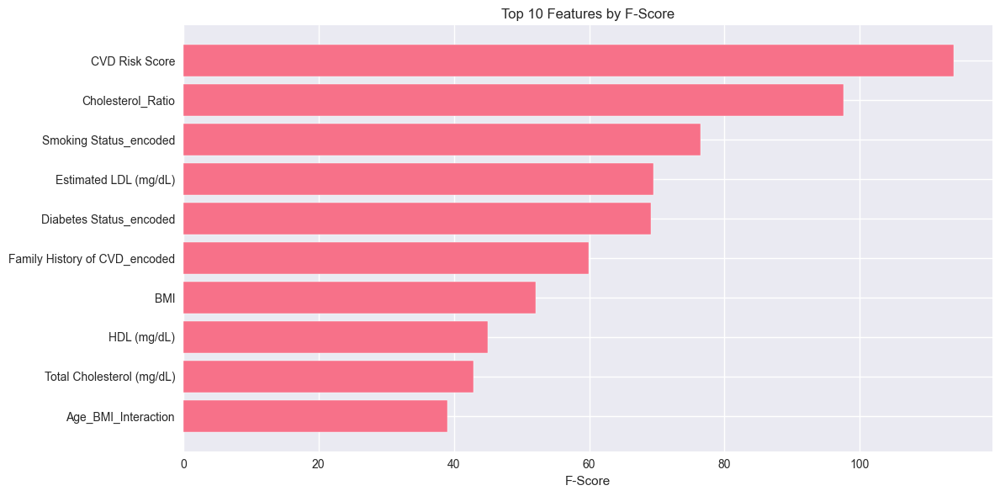

In [526]:

plt.figure(figsize=(12, 6))
top_features_combined = f_scores.head(10)
plt.barh(range(len(top_features_combined)), top_features_combined['F_Score'])
plt.yticks(range(len(top_features_combined)), top_features_combined['Feature'])
plt.xlabel('F-Score')
plt.title('Top 10 Features by F-Score')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# DATA BALANCING AND SPLITTING


## Use selected features

In [527]:

X_selected = X_features[selected_features].copy()
y_selected = y_target.copy()

print(f"Original class distribution:")
print(pd.Series(y_selected).value_counts())


Original class distribution:
CVD_Risk_encoded
0    1425
1    1140
2     454
Name: count, dtype: int64


### SMOTE (Synthetic Minority Over-sampling Technique)

### SMOTE is an oversampling technique used to address imbalanced datasets. It works by creating synthetic samples from the minority class rather than by over-sampling with replacement. This helps to prevent overfitting and provides a more diverse set of samples for the model to learn from.



## Advanced balancing techniques

In [528]:

# Ensure X_selected and y_selected are defined before using them
try:
    X_selected
except NameError:
    X_selected = X_features[selected_features].copy()

try:
    y_selected
except NameError:
    y_selected = y_target.copy()

print("\nApplying SMOTEENN for balanced sampling...")
smoteenn = SMOTEENN(random_state=42)
X_balanced, y_balanced = smoteenn.fit_resample(X_selected, y_selected)

print(f"Balanced class distribution:")
print(pd.Series(y_balanced).value_counts())


Applying SMOTEENN for balanced sampling...
Balanced class distribution:
CVD_Risk_encoded
2    1217
1     637
0     486
Name: count, dtype: int64


# Apply preprocessing

In [529]:
# Split the data
X_train, X_test, y_train, y_test = train_test_split(
    X_balanced, y_balanced, test_size=0.2, random_state=42, stratify=y_balanced
)

print(f"\nTraining set: {X_train.shape}")
print(f"Test set: {X_test.shape}")
print(f"Training class distribution: {np.bincount(y_train)}")
print(f"Test class distribution: {np.bincount(y_test)}")


Training set: (1872, 19)
Test set: (468, 19)
Training class distribution: [389 509 974]
Test class distribution: [ 97 128 243]


Train-Test Split: An 80%-20% split was performed, assigning 80% of the data to training and 20% to testing.

Stratification: Stratification was applied to preserve the original balanced class proportions in both subsets.

Random State: The split was made reproducible by setting random_state=42.

Balanced Dataset: Both training and test sets retain the balanced class distribution established in prior preprocessing steps, as confirmed by np.bincount(y_train) and np.bincount(y_test).

 ## MODEL PIPELINE

## Create preprocessing pipeline

In [530]:

preprocessor = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', RobustScaler())
])

## Decision Tree


Decision Tree Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.68      0.71        97
           1       0.75      0.74      0.75       128
           2       0.85      0.88      0.87       243

    accuracy                           0.80       468
   macro avg       0.78      0.77      0.77       468
weighted avg       0.80      0.80      0.80       468



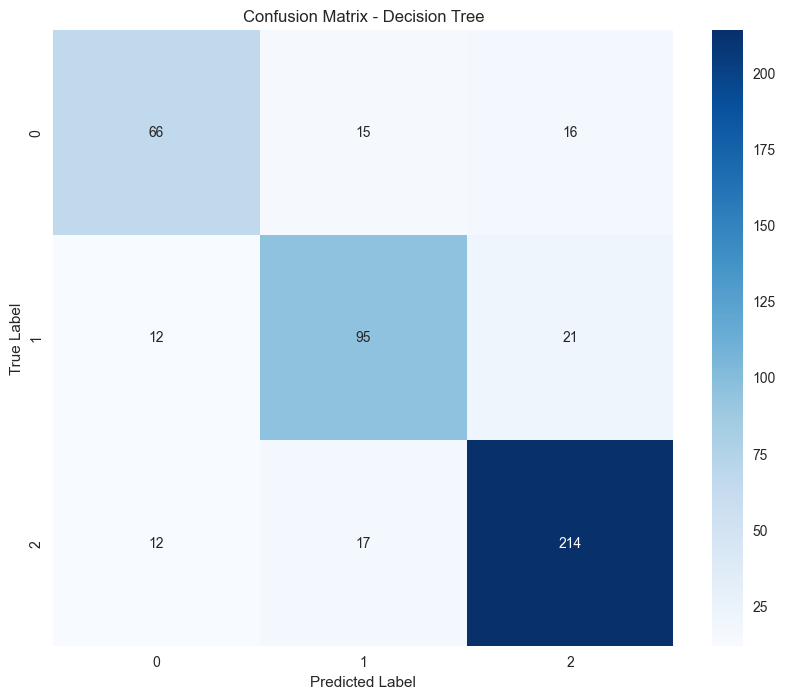

In [531]:
# Import Decision Tree Classifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# Initialize and train the Decision Tree model
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)

# Make predictions
y_pred_dt = dt_model.predict(X_test)

# Print model performance metrics
print("\nDecision Tree Classification Report:")
print(classification_report(y_test, y_pred_dt))

# Create confusion matrix
plt.figure(figsize=(10, 8))
cm_dt = confusion_matrix(y_test, y_pred_dt)
sns.heatmap(cm_dt, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - Decision Tree')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()



## Naive Bayes


Naive Bayes Classification Report:
              precision    recall  f1-score   support

           0       0.64      0.65      0.65        97
           1       0.43      0.71      0.54       128
           2       0.73      0.48      0.58       243

    accuracy                           0.58       468
   macro avg       0.60      0.61      0.59       468
weighted avg       0.63      0.58      0.58       468



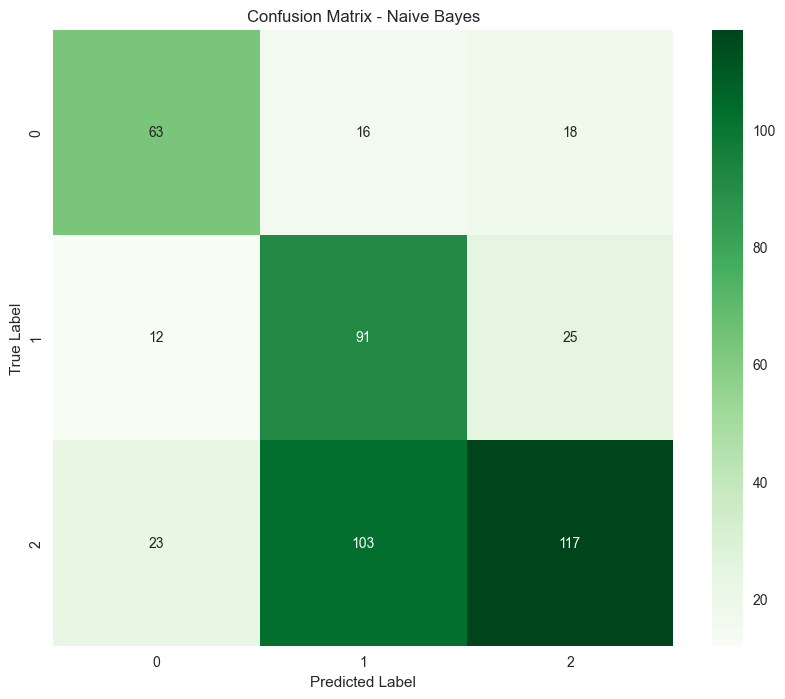

In [532]:
# Import Naive Bayes Classifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Initialize and train the Naive Bayes model
nb_model = GaussianNB()
nb_model.fit(X_train, y_train)

# Make predictions
y_pred_nb = nb_model.predict(X_test)

# Print model performance metrics
print("\nNaive Bayes Classification Report:")
print(classification_report(y_test, y_pred_nb))

# Create confusion matrix
plt.figure(figsize=(10, 8))
cm_nb = confusion_matrix(y_test, y_pred_nb)
sns.heatmap(cm_nb, annot=True, fmt='d', cmap='Greens')
plt.title('Confusion Matrix - Naive Bayes')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()


## Random Forest



Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.86      0.89        97
           1       0.91      0.88      0.90       128
           2       0.92      0.96      0.94       243

    accuracy                           0.92       468
   macro avg       0.92      0.90      0.91       468
weighted avg       0.92      0.92      0.92       468



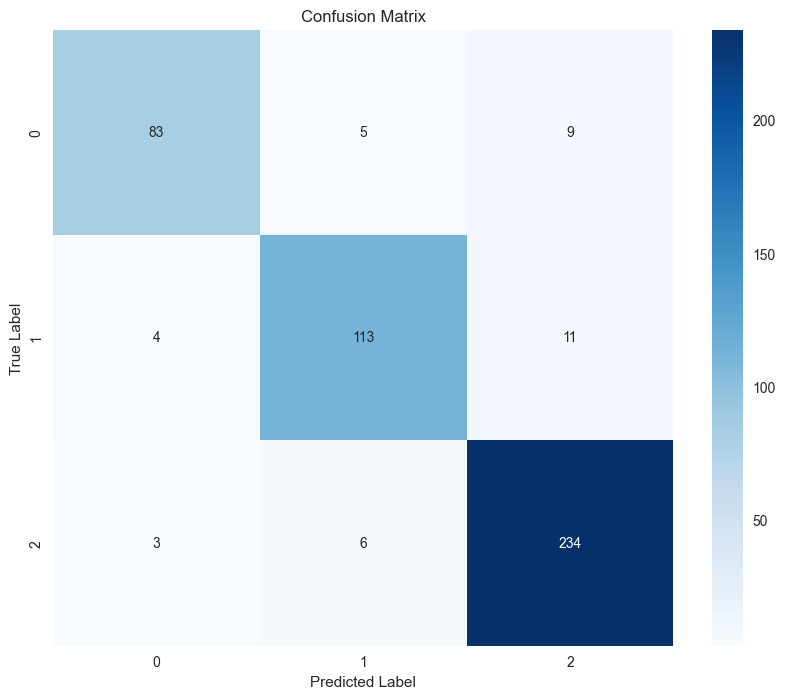

In [533]:
# Import Random Forest Classifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# Initialize and train the Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=44)
rf_model.fit(X_train, y_train)

# Make predictions
y_pred = rf_model.predict(X_test)

# Print model performance metrics
print("\nRandom Forest Classification Report:")
print(classification_report(y_test, y_pred))

# Create confusion matrix
plt.figure(figsize=(10, 8))
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# SVM (Support Vector Machine) - Training and Evaluation



SVM Classification Report:
              precision    recall  f1-score   support

           0       0.79      0.83      0.81       285
           1       0.70      0.80      0.75       228
           2       0.73      0.35      0.47        91

    accuracy                           0.75       604
   macro avg       0.74      0.66      0.68       604
weighted avg       0.75      0.75      0.74       604

SVM Accuracy: 0.7467


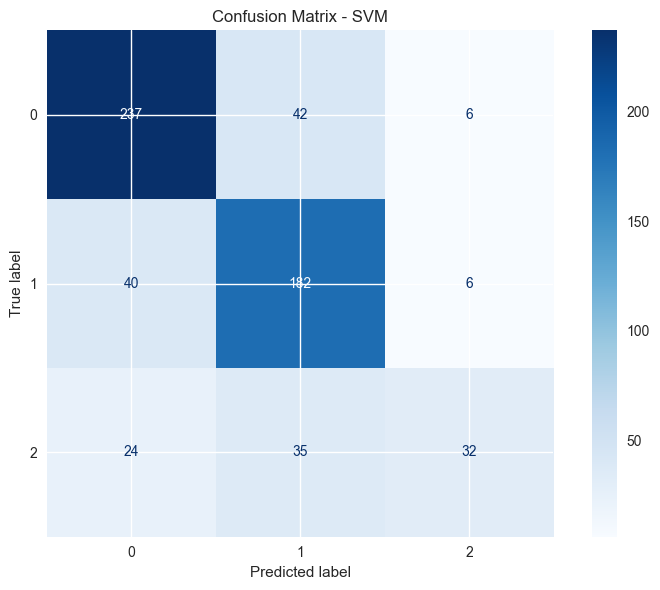

In [534]:
# SVM (Support Vector Machine) - Training and Evaluation
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import numpy as np
import matplotlib.pyplot as plt

# 1) Resolve train/test scaled features and labels
if 'X_train' in globals() and 'X_test_scaled' in globals() and 'y_train' in globals() and 'y_test' in globals():
    X_tr = X_train_scaled
    X_te = X_test_scaled
    y_tr = y_train
    y_te = y_test
else:
    # Fall back: build split and scaling from X/y already prepared in the notebook
    if 'X' in globals() and 'y' in globals():
        X_tr_raw, X_te_raw, y_tr, y_te = train_test_split(
            X, y, test_size=0.2, random_state=42, stratify=y
        )
        # Handle missing values
        imputer = SimpleImputer(strategy='mean')
        X_tr_raw = imputer.fit_transform(X_tr_raw)
        X_te_raw = imputer.transform(X_te_raw)
        
        # Reuse an existing scaler if present, else create a new one
        if 'scaler' in globals():
            scaler_to_use = scaler
            X_tr = scaler_to_use.fit_transform(X_tr_raw)
            X_te = scaler_to_use.transform(X_te_raw)
        else:
            scaler_to_use = StandardScaler()
            X_tr = scaler_to_use.fit_transform(X_tr_raw)
            X_te = scaler_to_use.transform(X_te_raw)
    else:
        raise RuntimeError("Neither (X_train_scaled, y_train, X_test_scaled, y_test) nor (X, y) are available to build the SVM.")

# 2) Train SVM on scaled features
svm_model = SVC(kernel='rbf', C=1.0, gamma='scale', probability=True, random_state=42)
svm_model.fit(X_tr, y_tr)

# 3) Predict
y_pred_svm = svm_model.predict(X_te)

# 4) Report with robust label handling
print("\nSVM Classification Report:")
model_classes = svm_model.classes_                   # underlying label values
display_class_names = [str(c) for c in model_classes]
print(classification_report(
    y_te, y_pred_svm,
    labels=model_classes,
    target_names=display_class_names
))
print(f"SVM Accuracy: {accuracy_score(y_te, y_pred_svm):.4f}")

# 5) Confusion matrix (aligned labels and display names)
plt.figure(figsize=(8, 6))
cm_svm = confusion_matrix(y_te, y_pred_svm, labels=model_classes)
disp_svm = ConfusionMatrixDisplay(confusion_matrix=cm_svm, display_labels=display_class_names)
disp_svm.plot(cmap='Blues', values_format='d', ax=plt.gca())
plt.title('Confusion Matrix - SVM')
plt.tight_layout()
plt.show()

## KNN Classifier

Fitting 2 folds for each of 10 candidates, totalling 20 fits
Classification Report for KNN Classifier for this project:
              precision    recall  f1-score   support

           0       0.98      0.97      0.97        97
           1       0.99      0.98      0.98       128
           2       0.99      1.00      0.99       243

    accuracy                           0.99       468
   macro avg       0.99      0.98      0.98       468
weighted avg       0.99      0.99      0.99       468



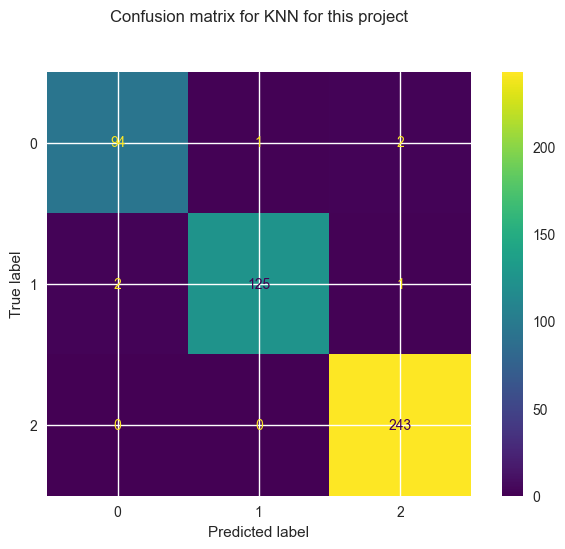

In [535]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report

# Initialize KNN classifier with default parameters
knn = KNeighborsClassifier()

# Perform grid search over specified parameter values
param_grid = {'n_neighbors': range(1, 11)}
grid_search = GridSearchCV(estimator=knn, param_grid=param_grid,
                           cv=2, n_jobs=3, verbose=2, scoring='accuracy')

grid_search.fit(X_train, y_train)
best_knn = grid_search.best_estimator_
predknn = best_knn.predict(X_test)

print("Classification Report for KNN Classifier for this project:")
print(classification_report(y_test, predknn))

# Plot confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

confusion_matrix = confusion_matrix(y_test, predknn)
disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix)
disp.plot()

plt.title('Confusion matrix for KNN for this project', y=1.1)
plt.show()



Fitting 2 folds for each of 10 candidates, totalling 20 fits
Classification Report for KNN Classifier for this project:
              precision    recall  f1-score   support

           0       0.98      0.97      0.97        97
           1       0.99      0.98      0.98       128
           2       0.99      1.00      0.99       243

    accuracy                           0.99       468
   macro avg       0.99      0.98      0.98       468
weighted avg       0.99      0.99      0.99       468



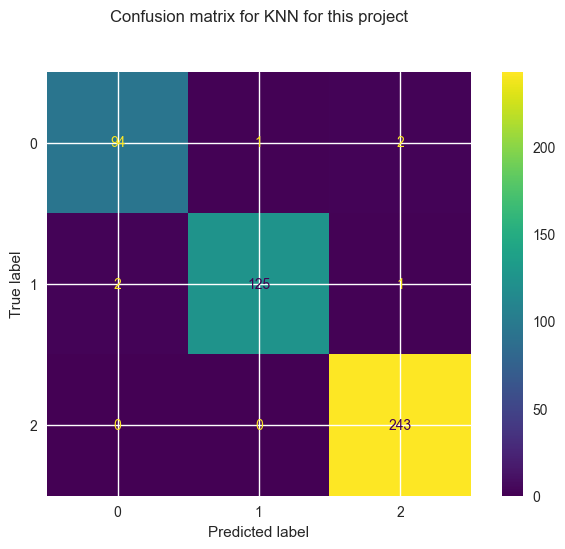


FEATURE IMPORTANCE ANALYSIS FOR KNN CLASSIFIER

Top 10 Most Important Features:
                      Feature  Importance      Std
          Age_BMI_Interaction    0.530769 0.014180
Blood Pressure (mmHg)_encoded    0.496795 0.024739
        Estimated LDL (mg/dL)    0.147222 0.010312
    Total Cholesterol (mg/dL)    0.120085 0.010194
  Fasting Blood Sugar (mg/dL)    0.046581 0.006324
         Cardiovascular_Index    0.019658 0.004662
                  Weight (kg)    0.007906 0.003177
                  Systolic BP    0.001923 0.001496
                  HDL (mg/dL)    0.000855 0.001709
              Metabolic_Index    0.000427 0.000855


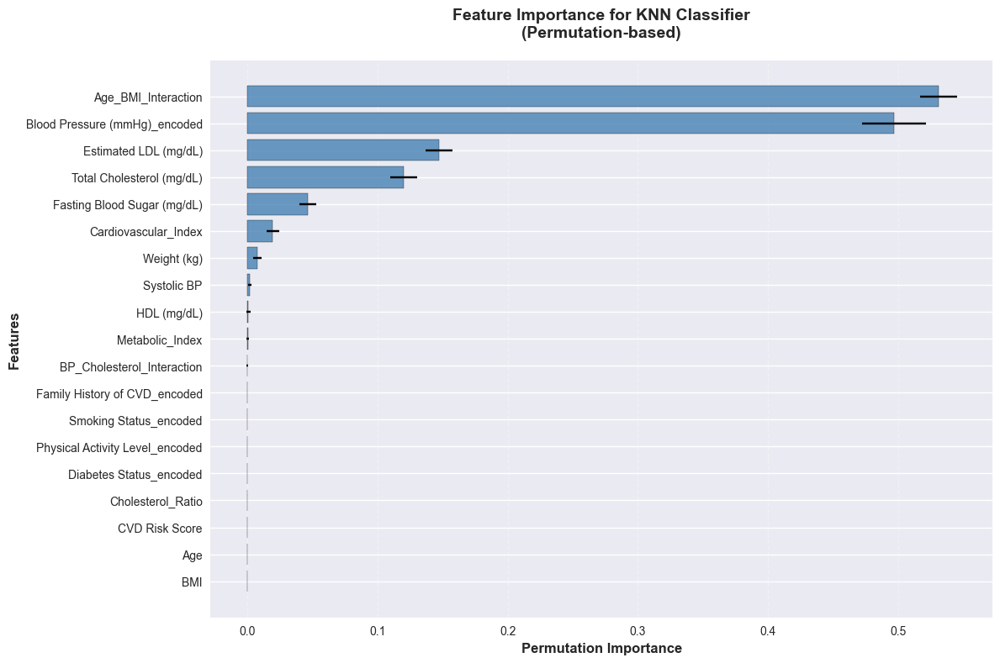

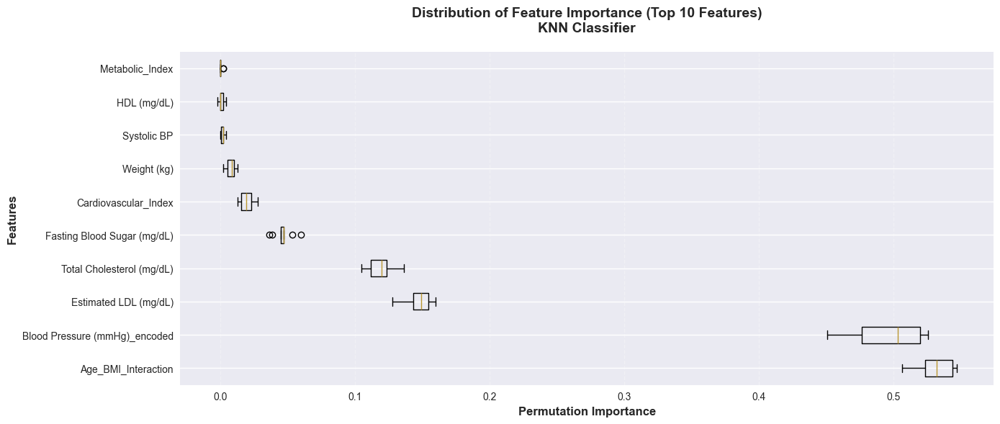


✅ Feature Importance Analysis Completed!


In [536]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV

# Initialize KNN classifier with default parameters
knn = KNeighborsClassifier()

# Perform grid search over specified parameter values
param_grid = {'n_neighbors': range(1, 11)}
grid_search = GridSearchCV(estimator=knn, param_grid=param_grid,
                           cv=2, n_jobs=3, verbose=2, scoring='accuracy')

grid_search.fit(X_train, y_train)
best_knn = grid_search.best_estimator_
predknn = best_knn.predict(X_test)

print("Classification Report for KNN Classifier for this project:")
print(classification_report(y_test, predknn))

# Plot confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

confusion_matrix = confusion_matrix(y_test, predknn)
disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix)
disp.plot()

plt.title('Confusion matrix for KNN for this project', y=1.1)
plt.show()

# Feature Importance using Permutation Importance
print("\n" + "="*60)
print("FEATURE IMPORTANCE ANALYSIS FOR KNN CLASSIFIER")
print("="*60)

from sklearn.inspection import permutation_importance
import numpy as np

# Calculate permutation importance
perm_importance = permutation_importance(
    best_knn, X_test, y_test, 
    n_repeats=10, 
    random_state=42, 
    n_jobs=-1
)

# Get feature names (assuming selected_features is available, otherwise use column names)
try:
    feature_names = selected_features
except:
    if hasattr(X_train, 'columns'):
        feature_names = X_train.columns.tolist()
    else:
        feature_names = [f'Feature_{i}' for i in range(X_train.shape[1])]

# Sort features by importance
sorted_idx = perm_importance.importances_mean.argsort()[::-1]

# Create feature importance dataframe
importance_df = pd.DataFrame({
    'Feature': [feature_names[i] for i in sorted_idx],
    'Importance': perm_importance.importances_mean[sorted_idx],
    'Std': perm_importance.importances_std[sorted_idx]
})

print("\nTop 10 Most Important Features:")
print(importance_df.head(10).to_string(index=False))

# Plot feature importance
plt.figure(figsize=(12, 8))
top_n = min(20, len(feature_names))  # Show top 20 features
y_pos = np.arange(top_n)

plt.barh(y_pos, importance_df['Importance'].head(top_n), 
         xerr=importance_df['Std'].head(top_n),
         align='center', alpha=0.8, color='steelblue', edgecolor='black')
plt.yticks(y_pos, importance_df['Feature'].head(top_n))
plt.xlabel('Permutation Importance', fontsize=12, fontweight='bold')
plt.ylabel('Features', fontsize=12, fontweight='bold')
plt.title('Feature Importance for KNN Classifier\n(Permutation-based)', 
          fontsize=14, fontweight='bold', pad=20)
plt.gca().invert_yaxis()
plt.grid(axis='x', alpha=0.3, linestyle='--')
plt.tight_layout()
plt.show()

# Additional visualization: Box plot for top features
plt.figure(figsize=(14, 6))
top_features = importance_df.head(10)['Feature'].tolist()
box_data = [perm_importance.importances[sorted_idx[i]] for i in range(min(10, len(feature_names)))]

plt.boxplot(box_data, labels=top_features, vert=False)
plt.xlabel('Permutation Importance', fontsize=12, fontweight='bold')
plt.ylabel('Features', fontsize=12, fontweight='bold')
plt.title('Distribution of Feature Importance (Top 10 Features)\nKNN Classifier', 
          fontsize=14, fontweight='bold', pad=20)
plt.grid(axis='x', alpha=0.3, linestyle='--')
plt.tight_layout()
plt.show()

print("\n✅ Feature Importance Analysis Completed!")


## ENHANCED XGBOOST MODEL

# Bayesian search with cross-validation

In [537]:

from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

# Define parameter grid for Random Forest
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initialize Random Forest classifier
rf = RandomForestClassifier(random_state=42)

# Perform Grid Search with Cross-Validation
grid_search = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    cv=5,
    scoring='accuracy',
    n_jobs=-1,
    verbose=1
)

print("Byaesian Search setup completed!")

Byaesian Search setup completed!



Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.82      0.86        97
           1       0.90      0.88      0.89       128
           2       0.92      0.96      0.94       243

    accuracy                           0.91       468
   macro avg       0.91      0.89      0.90       468
weighted avg       0.91      0.91      0.91       468



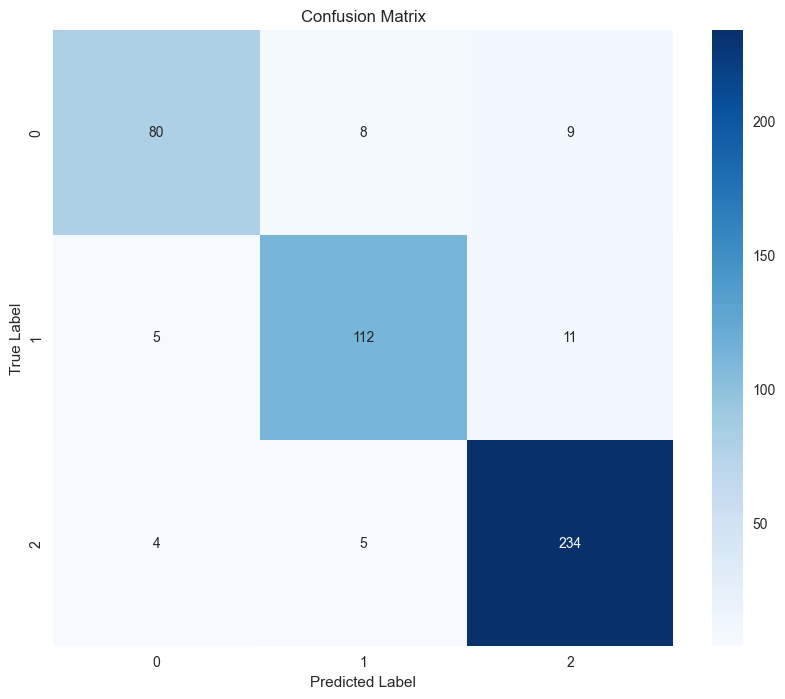

In [538]:
# Import Random Forest Classifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# Initialize and train the Random Forest model
rf_model = RandomForestClassifier(n_estimators=200, random_state=44)
rf_model.fit(X_train, y_train)

# Make predictions
y_pred = rf_model.predict(X_test)

# Print model performance metrics
print("\nRandom Forest Classification Report:")
print(classification_report(y_test, y_pred))

# Create confusion matrix
plt.figure(figsize=(10, 8))
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

### XGBoost classifier

In [539]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report
import joblib

# Initialize XGBoost classifier
xgb_clf = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')

# Define xgb_grid if not already defined
xgb_grid = GridSearchCV(
    estimator=xgb_clf,
    param_grid={
        'max_depth': [3, 6, 9],
        'learning_rate': [0.01, 0.1, 0.2],
        'n_estimators': [100, 200, 300]
    },
    cv=5,
    scoring='accuracy',
    n_jobs=1,  # Set n_jobs to 1 to avoid BrokenProcessPool error
    verbose=1
)

# Fit a single label encoder on the full set of labels and transform both y_train and y_test
# (If you already have a consistent encoder in memory, reuse it instead)
label_encoder = LabelEncoder()
label_encoder.fit(y_train)  # fit on train only to avoid leakage

y_train_encoded = label_encoder.transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Sanity check for matching samples
if len(X_train) == len(y_train_encoded):
    # Fit the grid search
    xgb_grid.fit(X_train, y_train_encoded)

    # Check if the best estimator is available
    if hasattr(xgb_grid, 'best_estimator_'):
        best_xgb = xgb_grid.best_estimator_
        y_pred_xgb = best_xgb.predict(X_test)

        # Use encoded y_test to compare against encoded predictions
        xgb_accuracy = accuracy_score(y_test_encoded, y_pred_xgb)

        print(f"\nXGBoost Test Accuracy: {xgb_accuracy:.4f}")
        print("\nClassification Report:")
        print(
            classification_report(
                y_test_encoded,
                y_pred_xgb,
                target_names=[str(c) for c in label_encoder.classes_]
            )
        )
    else:
        print("XGBoost model is not fitted. Please fit the model before prediction.")
else:
    print("Error: The number of samples in X_train_scaled and y_train_encoded do not match.")

Fitting 5 folds for each of 27 candidates, totalling 135 fits

XGBoost Test Accuracy: 0.9081

Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.80      0.86        97
           1       0.88      0.88      0.88       128
           2       0.92      0.96      0.94       243

    accuracy                           0.91       468
   macro avg       0.90      0.88      0.89       468
weighted avg       0.91      0.91      0.91       468



### # Gradient Boosting

1. Training Gradient Boosting...
Gradient Boosting Accuracy: 0.8846

Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.76      0.81        97
           1       0.84      0.85      0.84       128
           2       0.91      0.95      0.93       243

    accuracy                           0.88       468
   macro avg       0.87      0.86      0.86       468
weighted avg       0.88      0.88      0.88       468



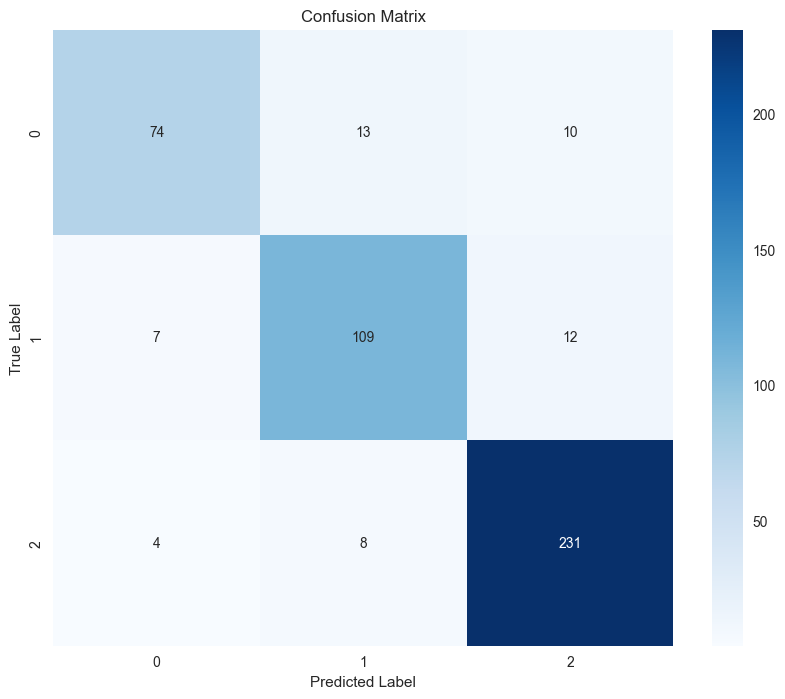

In [540]:
# Gradient Boosting
print("1. Training Gradient Boosting...")
gb_model = GradientBoostingClassifier(
    n_estimators=200, 
    learning_rate=0.1, 
    max_depth=5, 
    random_state=42
)
gb_model.fit(X_train, y_train)
y_pred_gb = gb_model.predict(X_test)
gb_accuracy = accuracy_score(y_test, y_pred_gb)
print(f"Gradient Boosting Accuracy: {gb_accuracy:.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_gb))

# Create confusion matrix
plt.figure(figsize=(10, 8))
cm = confusion_matrix(y_test, y_pred_gb)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

### BAGGING CLASSIFIER

🔧 FIXING BAGGING CLASSIFIER ERROR
📊 Training Fixed Bagging Classifier...
Configuration:
  • Base Estimator: Decision Tree (max_depth=10)
  • Number of Estimators: 100
  • Max Samples: 1.0 (bootstrap=True)
  • Bootstrap: True

✅ Fixed Bagging Model Training Completed!
🎯 Test Accuracy: 0.8782 (87.82%)

📋 BAGGING CLASSIFICATION REPORT:
--------------------------------------------------
              precision    recall  f1-score   support

           0       0.86      0.74      0.80        97
           1       0.85      0.87      0.86       128
           2       0.90      0.94      0.92       243

    accuracy                           0.88       468
   macro avg       0.87      0.85      0.86       468
weighted avg       0.88      0.88      0.88       468


🔢 CONFUSION MATRIX - BAGGING:
----------------------------------------


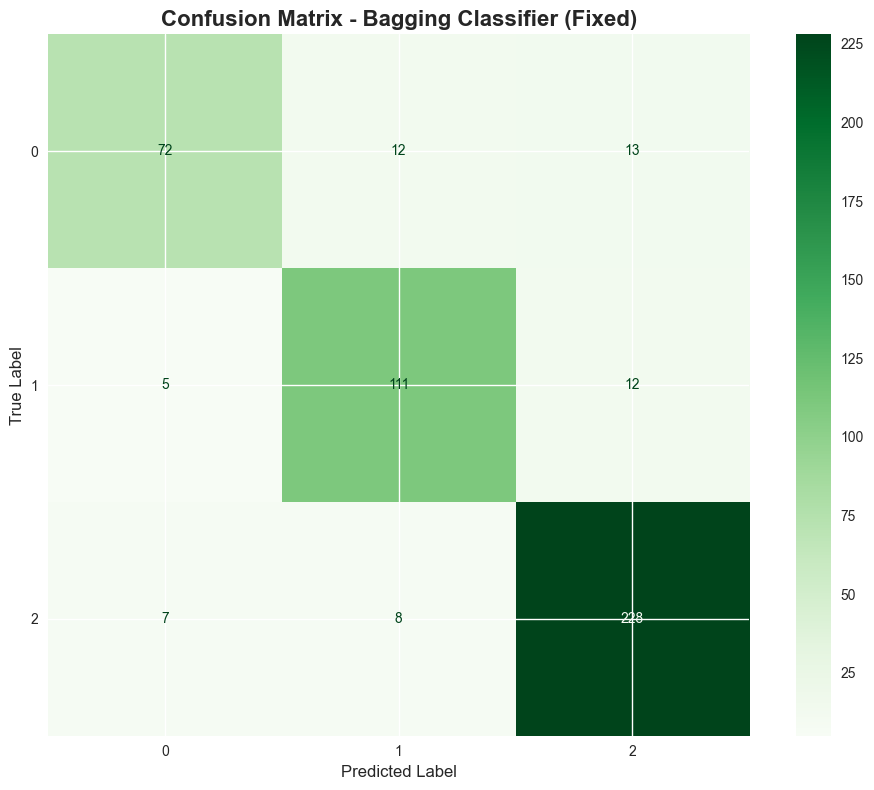

Confusion Matrix Values:
Rows: True Labels, Columns: Predicted Labels
True Labels: ['0', '1', '2']
Confusion Matrix:
  0: [72 12 13]
  1: [  5 111  12]
  2: [  7   8 228]

🔍 FEATURE IMPORTANCE ANALYSIS:
----------------------------------------
Top 10 Most Important Features:
-----------------------------------
 1. Age_BMI_Interaction            0.1016
 2. Cardiovascular_Index           0.0967
 3. Blood Pressure (mmHg)_encoded  0.0938
 4. Estimated LDL (mg/dL)          0.0875
 5. Fasting Blood Sugar (mg/dL)    0.0845
 6. Systolic BP                    0.0670
 7. Age                            0.0548
 8. CVD Risk Score                 0.0532
 9. Weight (kg)                    0.0505
10. HDL (mg/dL)                    0.0503


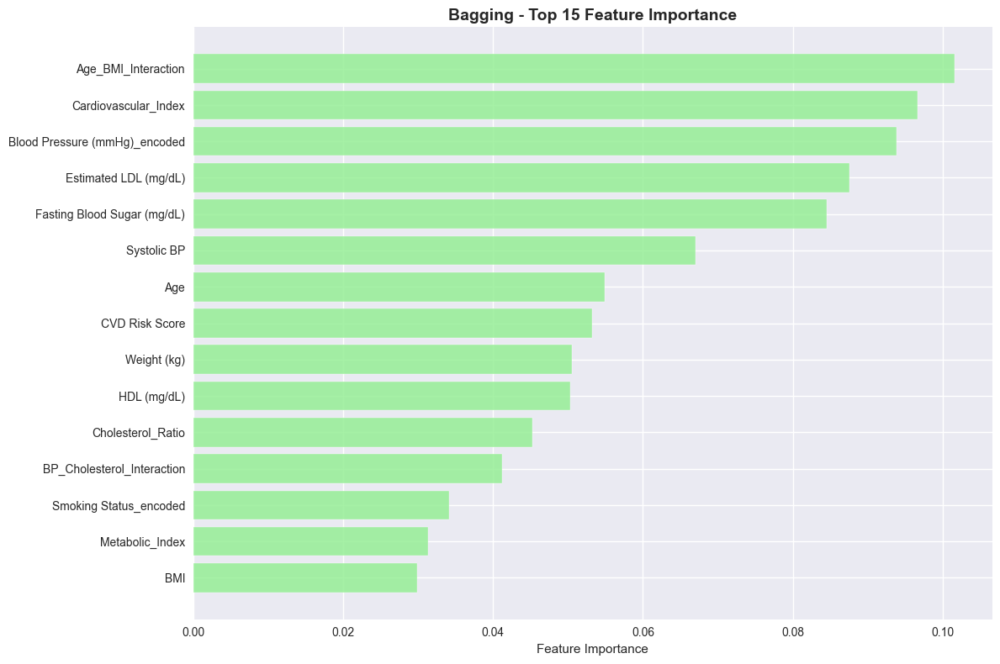


📈 DETAILED PERFORMANCE METRICS:
---------------------------------------------
0:
  • Precision: 0.8571
  • Recall:    0.7423
  • F1-Score:  0.7956
  • Support:   97
1:
  • Precision: 0.8473
  • Recall:    0.8672
  • F1-Score:  0.8571
  • Support:   128
2:
  • Precision: 0.9012
  • Recall:    0.9383
  • F1-Score:  0.9194
  • Support:   243

Overall (Macro Average):
  • Precision: 0.8686
  • Recall:    0.8492
  • F1-Score:  0.8574

🎉 FIXED BAGGING CLASSIFIER ANALYSIS COMPLETED!


In [541]:
# FIXED BAGGING CLASSIFIER - Updated for newer scikit-learn versions
print("🔧 FIXING BAGGING CLASSIFIER ERROR")
print("=" * 50)

from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.metrics import ConfusionMatrixDisplay, precision_recall_fscore_support
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Initialize Bagging Classifier with correct parameter name
print("📊 Training Fixed Bagging Classifier...")
print("Configuration:")
print("  • Base Estimator: Decision Tree (max_depth=10)")
print("  • Number of Estimators: 100")
print("  • Max Samples: 1.0 (bootstrap=True)")
print("  • Bootstrap: True")

bagging_model_fixed = BaggingClassifier(
    estimator=DecisionTreeClassifier(max_depth=10, random_state=42),  # Changed from base_estimator to estimator
    n_estimators=100,
    max_samples=1.0,
    max_features=1.0,
    bootstrap=True,
    bootstrap_features=False,
    random_state=42,
    n_jobs=-1
)

# Train the model on scaled features
bagging_model_fixed.fit(X_train, y_train)

# Make predictions
y_pred_bagging_fixed = bagging_model_fixed.predict(X_test)
bagging_accuracy_fixed = accuracy_score(y_test, y_pred_bagging_fixed)

print(f"\n✅ Fixed Bagging Model Training Completed!")
print(f"🎯 Test Accuracy: {bagging_accuracy_fixed:.4f} ({bagging_accuracy_fixed*100:.2f}%)")

# Prepare class labels consistently
model_classes = bagging_model_fixed.classes_                # underlying label values (could be ints/strings)
display_class_names = [str(c) for c in model_classes]       # always strings for display

# Classification Report (ensure names are strings and aligned with labels)
print(f"\n📋 BAGGING CLASSIFICATION REPORT:")
print("-" * 50)
print(
    classification_report(
        y_test,
        y_pred_bagging_fixed,
        labels=model_classes,
        target_names=display_class_names
    )
)

# Confusion Matrix
print(f"\n🔢 CONFUSION MATRIX - BAGGING:")
print("-" * 40)

cm_bagging_fixed = confusion_matrix(y_test, y_pred_bagging_fixed, labels=model_classes)

plt.figure(figsize=(10, 8))
disp_bagging_fixed = ConfusionMatrixDisplay(confusion_matrix=cm_bagging_fixed,
                                           display_labels=display_class_names)
disp_bagging_fixed.plot(cmap='Greens', values_format='d', ax=plt.gca())
plt.title('Confusion Matrix - Bagging Classifier (Fixed)', fontsize=16, fontweight='bold')
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.tight_layout()
plt.show()

# Print confusion matrix values
print("Confusion Matrix Values:")
print("Rows: True Labels, Columns: Predicted Labels")
print("=" * 50)
print(f"True Labels: {display_class_names}")
print("Confusion Matrix:")
for i, true_label in enumerate(display_class_names):
    print(f"  {true_label}: {cm_bagging_fixed[i]}")

# Feature Importance Analysis
print(f"\n🔍 FEATURE IMPORTANCE ANALYSIS:")
print("-" * 40)

# Get feature importance from Bagging (average across all base estimators)
feature_importance_bagging = np.mean(
    [tree.feature_importances_ for tree in bagging_model_fixed.estimators_],
    axis=0
)
feature_names = selected_features

# Create feature importance DataFrame
importance_df_bagging = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importance_bagging
}).sort_values('Importance', ascending=False)

print("Top 10 Most Important Features:")
print("-" * 35)
for i, (_, row) in enumerate(importance_df_bagging.head(10).iterrows(), 1):
    print(f"{i:2d}. {row['Feature']:<30s} {row['Importance']:.4f}")

# Visualize feature importance
plt.figure(figsize=(12, 8))
top_features_bagging = importance_df_bagging.head(15)
plt.barh(range(len(top_features_bagging)), top_features_bagging['Importance'],
         color='lightgreen', alpha=0.8)
plt.yticks(range(len(top_features_bagging)), top_features_bagging['Feature'])
plt.xlabel('Feature Importance')
plt.title('Bagging - Top 15 Feature Importance', fontsize=14, fontweight='bold')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# Model Performance Metrics (align order with labels)
print(f"\n📈 DETAILED PERFORMANCE METRICS:")
print("-" * 45)

precision, recall, f1, support = precision_recall_fscore_support(
    y_test,
    y_pred_bagging_fixed,
    labels=model_classes,
    average=None
)

for i, class_name in enumerate(display_class_names):
    print(f"{class_name}:")
    print(f"  • Precision: {precision[i]:.4f}")
    print(f"  • Recall:    {recall[i]:.4f}")
    print(f"  • F1-Score:  {f1[i]:.4f}")
    print(f"  • Support:   {support[i]}")

# Overall metrics
precision_macro = precision_recall_fscore_support(y_test, y_pred_bagging_fixed, average='macro')[0]
recall_macro = precision_recall_fscore_support(y_test, y_pred_bagging_fixed, average='macro')[1]
f1_macro = precision_recall_fscore_support(y_test, y_pred_bagging_fixed, average='macro')[2]

print(f"\nOverall (Macro Average):")
print(f"  • Precision: {precision_macro:.4f}")
print(f"  • Recall:    {recall_macro:.4f}")
print(f"  • F1-Score:  {f1_macro:.4f}")

print(f"\n🎉 FIXED BAGGING CLASSIFIER ANALYSIS COMPLETED!")
print("=" * 60)

### Stratified K-Fold Cross-Validation for Proposed Models

In [542]:
# =============================================================
# Stratified K-Fold Cross-Validation for Proposed Models
# =============================================================
print("🧪 Running Stratified K-Fold Cross-Validation for proposed models...")

from sklearn.model_selection import StratifiedKFold, cross_validate
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import VotingClassifier, RandomForestClassifier, BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
import numpy as np
import pandas as pd

# -----------------------------
# Resolve X and y for CV
# -----------------------------
# Prefer full feature matrix X and target y if available
X_cv = None
y_cv = None

if 'X' in globals() and 'y' in globals():
    X_cv = X
    y_cv = y
elif 'X_scaled' in globals() and 'y' in globals():
    X_cv = X
    y_cv = y
elif 'X_train_scaled' in globals() and 'X_test' in globals() and 'y_train' in globals() and 'y_test' in globals():
    try:
        X_cv = np.vstack([X_train, X_test])
        y_cv = np.concatenate([y_train, y_test])
    except Exception:
        pass

if X_cv is None or y_cv is None:
    raise RuntimeError("Could not resolve full X/y for cross-validation. Ensure X/y or X/y are defined.")

# -----------------------------
# Encode labels consistently
# -----------------------------
if 'label_encoder' in globals():
    le = label_encoder
else:
    le = LabelEncoder().fit(y_cv)

y_encoded = le.transform(y_cv)

# -----------------------------
# Define models (mirroring tuned params in notebook)
# -----------------------------
rf = RandomForestClassifier(
    n_estimators=200,
    max_depth=20,
    min_samples_split=5,
    min_samples_leaf=2,
    random_state=42,
    n_jobs=-1
)

knn = KNeighborsClassifier(n_neighbors=7)

dt = DecisionTreeClassifier(
    max_depth=10,
    min_samples_split=10,
    min_samples_leaf=5,
    random_state=42
)

svm = SVC(kernel='rbf', C=1.0, gamma='scale', probability=True, random_state=42)

bagging = BaggingClassifier(
    estimator=DecisionTreeClassifier(max_depth=10, random_state=42),
    n_estimators=100,
    max_samples=1.0,
    max_features=1.0,
    bootstrap=True,
    bootstrap_features=False,
    random_state=42,
    n_jobs=-1
)

xgb = XGBClassifier(
    n_estimators=200,
    learning_rate=0.1,
    max_depth=4,
    subsample=0.9,
    colsample_bytree=0.9,
    objective='multi:softprob',
    eval_metric='mlogloss',
    random_state=42,
    tree_method='hist'
)



models = {
    'RandomForest': rf,
    'KNN': knn,
    'DecisionTree': dt,
    'SVM_RBF': svm,
    'Bagging_DT': bagging,
    'XGBoost': xgb,
  
}

# -----------------------------
# CV configuration and scoring
# -----------------------------
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

scoring = {
    'accuracy': 'accuracy',
    'precision_macro': 'precision_macro',
    'recall_macro': 'recall_macro',
    'f1_macro': 'f1_macro'
}

# -----------------------------
# Run CV for each model
# -----------------------------
results = []

for name, model in models.items():
    cv_out = cross_validate(
        model,
        X_cv,
        y_encoded,
        cv=skf,
        scoring=scoring,
        n_jobs=-1,
        return_train_score=False
    )
    results.append({
        'Model': name,
        'ACC_mean': float(np.mean(cv_out['test_accuracy'])),
        'ACC_std': float(np.std(cv_out['test_accuracy'])),
        'Prec_mean': float(np.mean(cv_out['test_precision_macro'])),
        'Prec_std': float(np.std(cv_out['test_precision_macro'])),
        'Rec_mean': float(np.mean(cv_out['test_recall_macro'])),
        'Rec_std': float(np.std(cv_out['test_recall_macro'])),
        'F1_mean': float(np.mean(cv_out['test_f1_macro'])),
        'F1_std': float(np.std(cv_out['test_f1_macro']))
    })
    print(f"✔ {name}: ACC={results[-1]['ACC_mean']:.4f}±{results[-1]['ACC_std']:.4f} | "
          f"F1={results[-1]['F1_mean']:.4f}±{results[-1]['F1_std']:.4f}")

cv_df = pd.DataFrame(results).sort_values('ACC_mean', ascending=False)
print("\n📊 Stratified K-Fold results (sorted by ACC_mean):")
print(cv_df.to_string(index=False, float_format=lambda x: f"{x:.4f}"))



🧪 Running Stratified K-Fold Cross-Validation for proposed models...
✔ RandomForest: ACC=0.8172±0.0168 | F1=0.7718±0.0191
✔ KNN: ACC=0.5813±0.0057 | F1=0.5335±0.0098
✔ DecisionTree: ACC=0.6555±0.0174 | F1=0.6042±0.0191
✔ SVM_RBF: ACC=0.5141±0.0184 | F1=0.3611±0.0120
✔ Bagging_DT: ACC=0.7811±0.0078 | F1=0.7398±0.0143
✔ XGBoost: ACC=0.8029±0.0115 | F1=0.7491±0.0074

📊 Stratified K-Fold results (sorted by ACC_mean):
       Model  ACC_mean  ACC_std  Prec_mean  Prec_std  Rec_mean  Rec_std  F1_mean  F1_std
RandomForest    0.8172   0.0168     0.8479    0.0135    0.7438   0.0190   0.7718  0.0191
     XGBoost    0.8029   0.0115     0.7882    0.0075    0.7314   0.0082   0.7491  0.0074
  Bagging_DT    0.7811   0.0078     0.7986    0.0056    0.7167   0.0165   0.7398  0.0143
DecisionTree    0.6555   0.0174     0.6159    0.0192    0.5973   0.0189   0.6042  0.0191
         KNN    0.5813   0.0057     0.5726    0.0107    0.5198   0.0098   0.5335  0.0098
     SVM_RBF    0.5141   0.0184     0.3372    0.01

# Weighted Feature Fusion

In [543]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3019 entries, 0 to 3018
Data columns (total 31 columns):
 #   Column                           Non-Null Count  Dtype   
---  ------                           --------------  -----   
 0   Age                              3019 non-null   float64 
 1   Weight (kg)                      3019 non-null   float64 
 2   Height (m)                       3019 non-null   float64 
 3   BMI                              3019 non-null   float64 
 4   Abdominal Circumference (cm)     3019 non-null   float64 
 5   Total Cholesterol (mg/dL)        3019 non-null   float64 
 6   HDL (mg/dL)                      3019 non-null   float64 
 7   Fasting Blood Sugar (mg/dL)      3019 non-null   float64 
 8   Height (cm)                      3019 non-null   float64 
 9   Waist-to-Height Ratio            3019 non-null   float64 
 10  Systolic BP                      3019 non-null   float64 
 11  Diastolic BP                     3019 non-null   float64 
 12  Estima

In [544]:
# Define clinical and lifestyle feature groups based on domain knowledge and selected features
# Clinical: vitals, labs, anthropometrics; Lifestyle: behaviors and activity; plus family history

clinical_features = [
    'Age', 'BMI', 'Abdominal Circumference (cm)',
    'Total Cholesterol (mg/dL)', 'HDL (mg/dL)', 'Estimated LDL (mg/dL)',
    'Fasting Blood Sugar (mg/dL)', 'Systolic BP', 'Diastolic BP',
    'Waist-to-Height Ratio', 'Height (cm)', 'Height (m)', 'Weight (kg)'
]

# Encoded lifestyle/behavioral + family history (one-hot already present)
lifestyle_features = [
    'Physical Activity Level_encoded ', 'Smoking Status_encoded',
    'Diabetes Status_encoded', 
    'Family History of CVD_encoded'
]

# Engineered features: categorize by source
engineered_clinical = [
    'BP_Ratio', 'Cholesterol_Ratio', 'Metabolic_Index', 'Cardiovascular_Index',
    'Age_BMI_Interaction', 'BP_Cholesterol_Interaction'
]

# Optional categorical bins created earlier are non-numeric; ensure they are handled/encoded
# In this notebook they remain categorical; we will exclude them from numeric fusion for now

# Intersect with actual available columns to avoid KeyErrors
available_cols = set(df_encoded.columns)
clinical_group = [c for c in clinical_features + engineered_clinical if c in available_cols]
lifestyle_group = [c for c in lifestyle_features if c in available_cols]

print('Clinical group (final):', clinical_group)
print('Lifestyle group (final):', lifestyle_group)

# Build base matrices using previously selected features where possible
X_clinical = df_encoded[clinical_group].copy()
X_lifestyle = df_encoded[lifestyle_group].copy()

y_labels = df_encoded['CVD_Risk_encoded'].copy()


Clinical group (final): ['Age', 'BMI', 'Abdominal Circumference (cm)', 'Total Cholesterol (mg/dL)', 'HDL (mg/dL)', 'Estimated LDL (mg/dL)', 'Fasting Blood Sugar (mg/dL)', 'Systolic BP', 'Diastolic BP', 'Waist-to-Height Ratio', 'Height (cm)', 'Height (m)', 'Weight (kg)', 'BP_Ratio', 'Cholesterol_Ratio', 'Metabolic_Index', 'Cardiovascular_Index', 'Age_BMI_Interaction', 'BP_Cholesterol_Interaction']
Lifestyle group (final): ['Smoking Status_encoded', 'Diabetes Status_encoded', 'Family History of CVD_encoded']


In [545]:
# Optuna-based weighted feature fusion between clinical and lifestyle groups

# Robust import/installation to avoid NameError from missing optuna
try:
    import optuna  # type: ignore
except Exception:
    import sys, subprocess
    print("Optuna not found. Installing optuna...")
    subprocess.check_call([sys.executable, "-m", "pip", "install", "--quiet", "optuna"])
    import optuna  # type: ignore

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.preprocessing import StandardScaler
import numpy as np

# Check if X_clinical and X_lifestyle are not empty before scaling
if not X_clinical.empty:
    scaler_clin = StandardScaler()
    Xc = scaler_clin.fit_transform(X_clinical)
else:
    raise ValueError("X_clinical is empty. Please check the data.")

if not X_lifestyle.empty:
    scaler_life = StandardScaler()
    Xl = scaler_life.fit_transform(X_lifestyle)
else:
    raise ValueError("X_lifestyle is empty. Please check the data.")

# We will fuse as: X_fused = concat([w_c * Xc, w_l * Xl])
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

def build_fused_features(weight_clinical: float, weight_lifestyle: float):
    # Safeguards: weights are non-negative; Optuna enforces search bounds
    Xc_w = Xc * weight_clinical
    Xl_w = Xl * weight_lifestyle
    return np.hstack([Xc_w, Xl_w])

# Remove the optuna type annotation to avoid NameError at definition time
def objective(trial) -> float:
    w_c = trial.suggest_float('weight_clinical', 0.0, 3.0)
    w_l = trial.suggest_float('weight_lifestyle', 0.0, 3.0)

    X_fused = build_fused_features(w_c, w_l)

    # Simple and fast baseline classifier for the objective
    clf = LogisticRegression(max_iter=200, multi_class='auto')

    # Cross-validated macro F1
    scores = cross_val_score(
        clf, X_fused, y_labels, cv=cv, scoring='f1_macro', n_jobs=-1
    )
    return scores.mean()

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=40, timeout=300)

best_w_c = study.best_params['weight_clinical']
best_w_l = study.best_params['weight_lifestyle']
print('Best weights -> clinical:', best_w_c, ', lifestyle:', best_w_l)

# Create final fused matrix using best weights
X_fused_all = build_fused_features(best_w_c, best_w_l)

# Persist scalers and weights if needed
best_fusion_params = {
    'weight_clinical': float(best_w_c),
    'weight_lifestyle': float(best_w_l)
}
print('Fusion params:', best_fusion_params)

[I 2025-10-09 09:32:57,330] A new study created in memory with name: no-name-cfb4713d-850d-458b-bcdf-13140da14191
[I 2025-10-09 09:32:57,607] Trial 0 finished with value: 0.49700451321348205 and parameters: {'weight_clinical': 2.000355516384061, 'weight_lifestyle': 2.0878270535459578}. Best is trial 0 with value: 0.49700451321348205.
[I 2025-10-09 09:32:57,746] Trial 1 finished with value: 0.4914993198383851 and parameters: {'weight_clinical': 0.881540248259951, 'weight_lifestyle': 0.1806439662979391}. Best is trial 0 with value: 0.49700451321348205.
[I 2025-10-09 09:32:57,946] Trial 2 finished with value: 0.4925126550602291 and parameters: {'weight_clinical': 1.9635462698256707, 'weight_lifestyle': 0.09313823301840862}. Best is trial 0 with value: 0.49700451321348205.
[I 2025-10-09 09:32:58,099] Trial 3 finished with value: 0.4972535288612289 and parameters: {'weight_clinical': 1.5685365807756262, 'weight_lifestyle': 0.5812334866139887}. Best is trial 3 with value: 0.4972535288612289.

Best weights -> clinical: 1.4223214347913784 , lifestyle: 0.5780745514987357
Fusion params: {'weight_clinical': 1.4223214347913784, 'weight_lifestyle': 0.5780745514987357}


In [546]:
# Optuna-based weighted feature fusion between clinical and lifestyle groups

# Attempt to import optuna and handle the potential error
try:
    import optuna
except ModuleNotFoundError:
    print("Optuna is not installed. Please install it using 'pip install optuna'.")

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.preprocessing import StandardScaler

# Build standardized group representations (to keep scales comparable)
scaler_clin = StandardScaler()
scaler_life = StandardScaler()
Xc = scaler_clin.fit_transform(X_clinical)
Xl = scaler_life.fit_transform(X_lifestyle)

# We will fuse as: X_fused = w_c * agg(Xc) + w_l * agg(Xl)
# Aggregation by mean across each group columns to a single scalar per sample per group, then concatenate
# Alternatively we can scale whole groups and weight-concatenate. We'll implement scalar-weighted concatenation:
# X_fused = concat([w_c * Xc, w_l * Xl])

from numpy.random import RandomState

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

def build_fused_features(weight_clinical: float, weight_lifestyle: float):
    # Safe guards: non-negative weights; Optuna will ensure bounds
    Xc_w = Xc * weight_clinical
    Xl_w = Xl * weight_lifestyle
    return np.hstack([Xc_w, Xl_w])


def objective(trial: optuna.trial.Trial) -> float:
    w_c = trial.suggest_float('weight_clinical', 0.0, 3.0)
    w_l = trial.suggest_float('weight_lifestyle', 0.0, 3.0)

    X_fused = build_fused_features(w_c, w_l)

    # Simple and fast baseline classifier for objective
    clf = LogisticRegression(max_iter=200, n_jobs=None, multi_class='auto')

    # Cross-validated macro F1
    scores = cross_val_score(
        clf, X_fused, y_labels, cv=cv, scoring='f1_macro', n_jobs=-1
    )
    return scores.mean()

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=40, timeout=300)

best_w_c = study.best_params['weight_clinical']
best_w_l = study.best_params['weight_lifestyle']
print('Best weights -> clinical:', best_w_c, ', lifestyle:', best_w_l)

# Create final fused matrix using best weights
X_fused_all = build_fused_features(best_w_c, best_w_l)

# Persist scalers and weights if needed
best_fusion_params = {
    'weight_clinical': float(best_w_c),
    'weight_lifestyle': float(best_w_l)
}
print('Fusion params:', best_fusion_params)


[I 2025-10-09 09:33:06,921] A new study created in memory with name: no-name-c603cad0-0593-4d80-bb90-69a8c8ba5d3f


[I 2025-10-09 09:33:07,123] Trial 0 finished with value: 0.4967862284689962 and parameters: {'weight_clinical': 2.8547579835783314, 'weight_lifestyle': 1.2407553551406503}. Best is trial 0 with value: 0.4967862284689962.
[I 2025-10-09 09:33:07,328] Trial 1 finished with value: 0.4967862284689962 and parameters: {'weight_clinical': 2.9856864424589187, 'weight_lifestyle': 2.328785230211971}. Best is trial 0 with value: 0.4967862284689962.
[I 2025-10-09 09:33:07,487] Trial 2 finished with value: 0.4965134910413915 and parameters: {'weight_clinical': 2.0442334751535722, 'weight_lifestyle': 1.9425328856597082}. Best is trial 0 with value: 0.4967862284689962.
[I 2025-10-09 09:33:07,629] Trial 3 finished with value: 0.45042073458381954 and parameters: {'weight_clinical': 0.17739014675426512, 'weight_lifestyle': 0.020936818759600517}. Best is trial 0 with value: 0.4967862284689962.
[I 2025-10-09 09:33:07,797] Trial 4 finished with value: 0.497051383729895 and parameters: {'weight_clinical': 2.

Best weights -> clinical: 1.3687871928224513 , lifestyle: 1.5820825992837062
Fusion params: {'weight_clinical': 1.3687871928224513, 'weight_lifestyle': 1.5820825992837062}


### weighted feature on base models

Fused training set: (2573, 22) Fused test set: (644, 22)

=== LogisticRegression ===
              precision    recall  f1-score   support

           0       0.62      0.63      0.62       174
           1       0.47      0.41      0.43       197
           2       0.53      0.58      0.56       273

    accuracy                           0.54       644
   macro avg       0.54      0.54      0.54       644
weighted avg       0.54      0.54      0.54       644



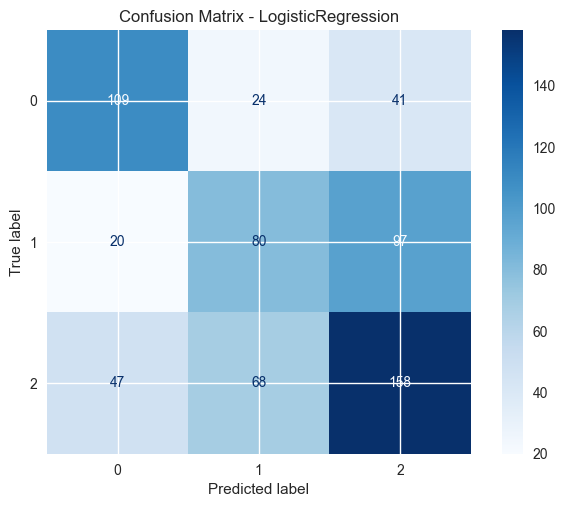


=== DecisionTree ===
              precision    recall  f1-score   support

           0       0.84      0.78      0.81       174
           1       0.81      0.84      0.83       197
           2       0.88      0.90      0.89       273

    accuracy                           0.85       644
   macro avg       0.84      0.84      0.84       644
weighted avg       0.85      0.85      0.85       644



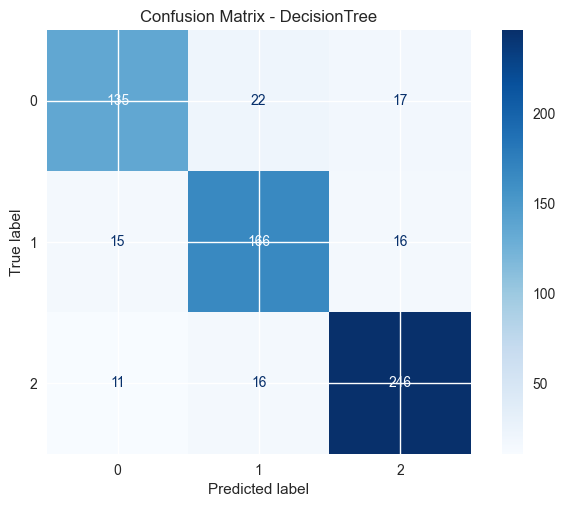


=== RandomForest ===
              precision    recall  f1-score   support

           0       0.96      0.92      0.94       174
           1       0.94      0.95      0.94       197
           2       0.97      0.98      0.98       273

    accuracy                           0.96       644
   macro avg       0.95      0.95      0.95       644
weighted avg       0.96      0.96      0.96       644



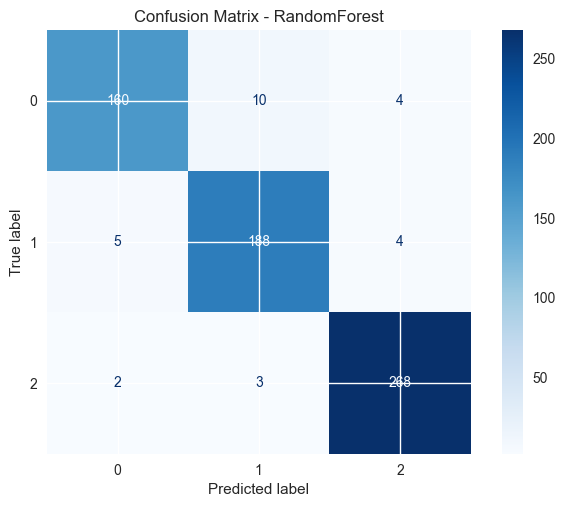


=== KNN ===
              precision    recall  f1-score   support

           0       0.91      0.89      0.90       174
           1       0.90      0.87      0.89       197
           2       0.93      0.97      0.95       273

    accuracy                           0.92       644
   macro avg       0.92      0.91      0.91       644
weighted avg       0.92      0.92      0.92       644



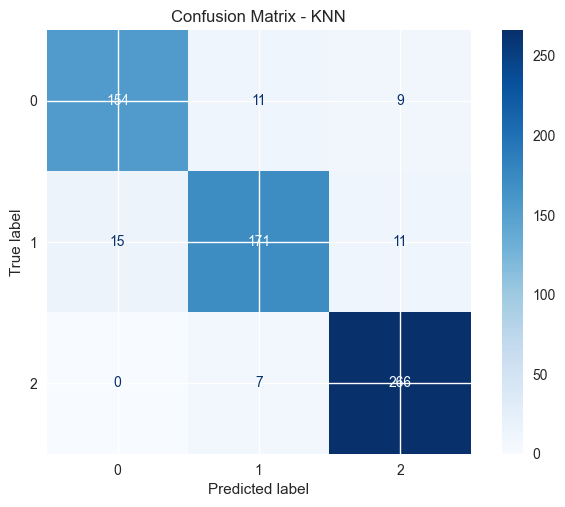


=== SVM ===
              precision    recall  f1-score   support

           0       0.87      0.86      0.87       174
           1       0.87      0.86      0.87       197
           2       0.93      0.94      0.94       273

    accuracy                           0.90       644
   macro avg       0.89      0.89      0.89       644
weighted avg       0.90      0.90      0.90       644



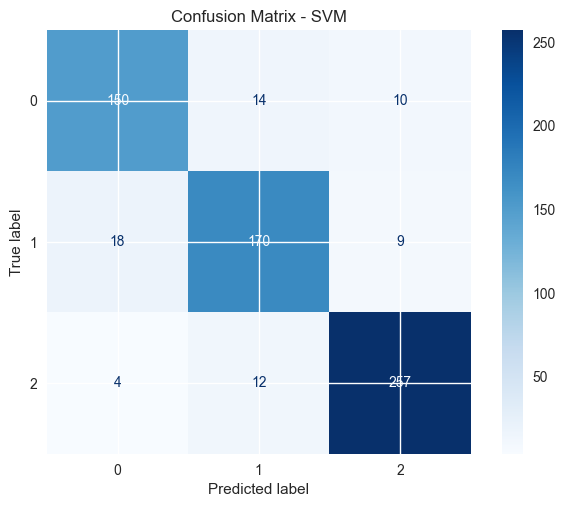


=== GaussianNB ===
              precision    recall  f1-score   support

           0       0.69      0.60      0.64       174
           1       0.45      0.66      0.54       197
           2       0.65      0.48      0.55       273

    accuracy                           0.57       644
   macro avg       0.60      0.58      0.58       644
weighted avg       0.60      0.57      0.57       644



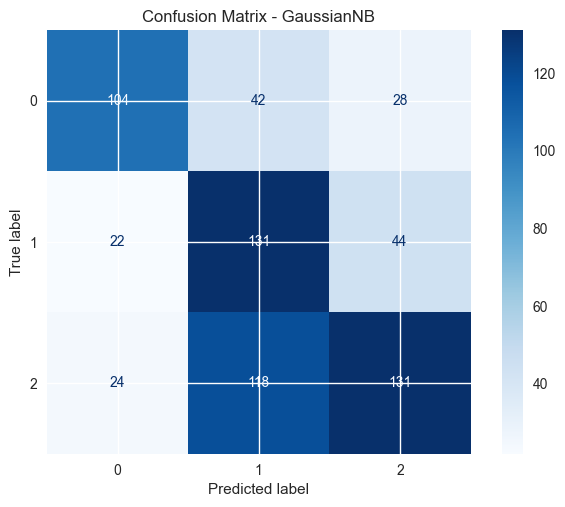


=== bagging ===
              precision    recall  f1-score   support

           0       0.90      0.84      0.87       174
           1       0.86      0.90      0.88       197
           2       0.93      0.94      0.94       273

    accuracy                           0.90       644
   macro avg       0.90      0.89      0.89       644
weighted avg       0.90      0.90      0.90       644



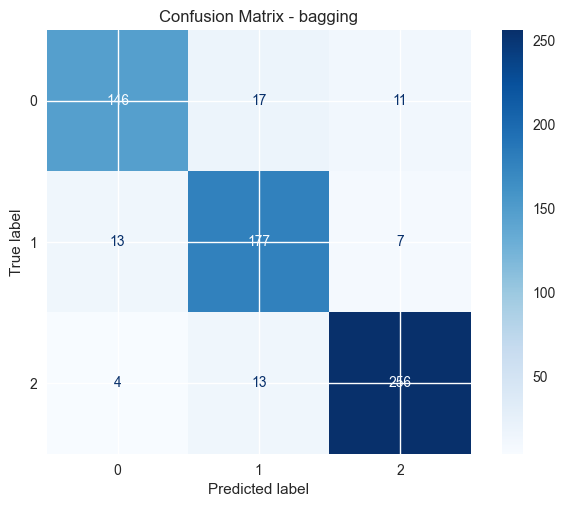


=== XGB ===
              precision    recall  f1-score   support

           0       0.94      0.90      0.92       174
           1       0.94      0.94      0.94       197
           2       0.95      0.98      0.97       273

    accuracy                           0.95       644
   macro avg       0.94      0.94      0.94       644
weighted avg       0.95      0.95      0.95       644



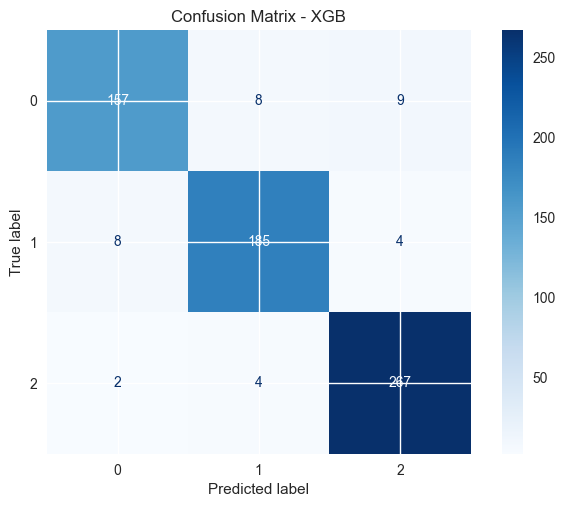


Accuracy summary: {'LogisticRegression': 0.5388198757763976, 'DecisionTree': 0.8493788819875776, 'RandomForest': 0.9565217391304348, 'KNN': 0.9177018633540373, 'SVM': 0.8959627329192547, 'GaussianNB': 0.5683229813664596, 'bagging': 0.8990683229813664, 'XGB': 0.9456521739130435}


In [547]:

# Train/test split on fused features and evaluation across models
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score

# Balance using SMOTEENN as earlier on the fused features
from imblearn.combine import SMOTEENN

smoteenn = SMOTEENN(random_state=42)
X_bal_fused, y_bal_fused = smoteenn.fit_resample(X_fused_all, y_labels)

X_train_f, X_test_f, y_train_f, y_test_f = train_test_split(
    X_bal_fused, y_bal_fused, test_size=0.2, random_state=42, stratify=y_bal_fused
)

print('Fused training set:', X_train_f.shape, 'Fused test set:', X_test_f.shape)

# Models to evaluate
models = {
    'LogisticRegression': LogisticRegression(max_iter=500, multi_class='auto'),
    'DecisionTree': DecisionTreeClassifier(random_state=42),
    'RandomForest': RandomForestClassifier(n_estimators=300, random_state=42),
    'KNN': KNeighborsClassifier(n_neighbors=5),
    'SVM': SVC(kernel='rbf', C=1.0, gamma='scale', probability=True, random_state=42),
    'GaussianNB': GaussianNB(),
    'bagging': BaggingClassifier(
    estimator=DecisionTreeClassifier(max_depth=10, random_state=42),  # Changed from base_estimator to estimator
    n_estimators=100,
    max_samples=1.0,
    max_features=1.0,
    bootstrap=True,
    bootstrap_features=False,
    random_state=42,
    n_jobs=-10),
    'XGB': XGBClassifier(
        n_estimators=300, learning_rate=0.08, max_depth=5, subsample=0.9,
        colsample_bytree=0.9, random_state=42, eval_metric='mlogloss'
    )
}

results = {}

for name, model in models.items():
    model.fit(X_train_f, y_train_f)
    y_pred = model.predict(X_test_f)
    acc = accuracy_score(y_test_f, y_pred)
    results[name] = acc
    print(f"\n=== {name} ===")
    print(classification_report(y_test_f, y_pred))
    cm = confusion_matrix(y_test_f, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap='Blues', values_format='d')
    plt.title(f'Confusion Matrix - {name}')
    plt.show()

print('\nAccuracy summary:', results)


read this code. random forest give high accuracy. Now add a feature importance diagram for random forest classifier considering the clinical_features and lifestyle_features

## Stratified K-Fold Cross-Validation on Weighted-Fusion Features
This section evaluates all proposed models using Stratified K-Fold CV on the fused features (`X_bal_fused`, `y_bal_fused`). It reports mean and std accuracy, plus optional ROC-AUC when available.


In [550]:
# Stratified K-Fold CV across proposed models on fused features (robust AUC computation)
import numpy as np
import pandas as pd
from sklearn.model_selection import StratifiedKFold, cross_validate
from sklearn.metrics import accuracy_score, roc_auc_score

# Locate fused features and labels
if 'X_bal_fused' in globals() and 'y_bal_fused' in globals():
    X_cv = X_bal_fused
    y_cv = y_bal_fused
elif 'X_fused_all' in globals() and 'y_labels' in globals():
    X_cv = X_fused_all
    y_cv = y_labels
else:
    raise RuntimeError("Fused feature matrices not found. Run fusion cells to create X_fused_all / X_bal_fused and y.")

X_cv = np.asarray(X_cv)
y_cv = np.asarray(y_cv)

# Build default models dict if not present
try:
    models  # noqa: F401
except NameError:
    from sklearn.ensemble import RandomForestClassifier, BaggingClassifier
    from sklearn.tree import DecisionTreeClassifier
    from sklearn.neighbors import KNeighborsClassifier
    from sklearn.svm import SVC
    from sklearn.naive_bayes import GaussianNB
    try:
        from xgboost import XGBClassifier
        xgb_available = True
    except Exception:
        xgb_available = False

    models = {
        'RandomForest': RandomForestClassifier(n_estimators=300, random_state=42),
        'KNN': KNeighborsClassifier(n_neighbors=5),
        'SVM': SVC(kernel='rbf', C=1.0, gamma='scale', probability=True, random_state=42),
        'GaussianNB': GaussianNB(),
        'Bagging': BaggingClassifier(
            estimator=DecisionTreeClassifier(max_depth=10, random_state=42),
            n_estimators=100,
            random_state=42
        ),
    }
    if xgb_available:
        models['XGBoost'] = XGBClassifier(
            n_estimators=200, learning_rate=0.1, max_depth=4,
            subsample=0.9, colsample_bytree=0.9, reg_lambda=1.0,
            objective='multi:softprob' if len(np.unique(y_cv)) > 2 else 'binary:logistic',
            eval_metric='mlogloss',
            random_state=42
        )

# CV setup
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

def compute_cv_auc(estimator, X, y, skf):
    """Compute per-fold ROC-AUC robustly using predict_proba/decision_function if available."""
    aucs = []
    classes = np.unique(y)
    is_multiclass = len(classes) > 2

    for train_idx, test_idx in skf.split(X, y):
        X_tr, X_te = X[train_idx], X[test_idx]
        y_tr, y_te = y[train_idx], y[test_idx]

        est = estimator
        est.fit(X_tr, y_tr)

        y_score = None
        if hasattr(est, 'predict_proba'):
            proba = est.predict_proba(X_te)
            if is_multiclass:
                y_score = proba  # shape (n_samples, n_classes)
                auc = roc_auc_score(y_te, y_score, multi_class='ovo', average='macro')
            else:
                # use probability of positive class
                pos_index = 1 if proba.shape[1] > 1 else 0
                y_score = proba[:, pos_index]
                auc = roc_auc_score(y_te, y_score)
        elif hasattr(est, 'decision_function'):
            dec = est.decision_function(X_te)
            if is_multiclass:
                # shape (n_samples, n_classes)
                if dec.ndim == 1:
                    # unlikely for multiclass, skip AUC
                    auc = np.nan
                else:
                    auc = roc_auc_score(y_te, dec, multi_class='ovo', average='macro')
            else:
                # 1D scores
                auc = roc_auc_score(y_te, dec)
        else:
            auc = np.nan  # no scoring capability for AUC

        aucs.append(auc)

    # Filter out nans if any
    aucs = [a for a in aucs if not (a is None or (isinstance(a, float) and np.isnan(a)))]
    if len(aucs) == 0:
        return np.nan, np.nan
    return float(np.mean(aucs)), float(np.std(aucs))

rows = []
for name, est in models.items():
    cv_out = cross_validate(
        est, X_cv, y_cv,
        scoring={'accuracy': 'accuracy'},
        cv=skf,
        return_train_score=False,
        n_jobs=-1,
        error_score='raise'
    )
    acc_mean = float(np.mean(cv_out['test_accuracy']))
    acc_std = float(np.std(cv_out['test_accuracy']))

    auc_mean, auc_std = compute_cv_auc(est, X_cv, y_cv, skf)

    rows.append({
        'Model': name,
        'CV Acc Mean': acc_mean,
        'CV Acc Std': acc_std,
        'CV AUC(ovo) Mean': auc_mean if not np.isnan(auc_mean) else None,
        'CV AUC(ovo) Std': auc_std if not np.isnan(auc_std) else None,
    })

cv_df = pd.DataFrame(rows).sort_values(by=['CV Acc Mean'], ascending=False)
print("Stratified K-Fold (n_splits=5) Results on Fused Features:\n")
print(cv_df.to_string(index=False))

Stratified K-Fold (n_splits=5) Results on Fused Features:

             Model  CV Acc Mean  CV Acc Std  CV AUC(ovo) Mean  CV AUC(ovo) Std
      RandomForest     0.955858    0.011243          0.995304         0.001453
               XGB     0.952751    0.009564          0.992865         0.001858
               KNN     0.944358    0.004961          0.990797         0.002011
           bagging     0.921354    0.011161          0.985696         0.003101
               SVM     0.912340    0.006108          0.981893         0.005361
      DecisionTree     0.859804    0.013133          0.889403         0.010176
LogisticRegression     0.577874    0.018884          0.787302         0.010147
        GaussianNB     0.574135    0.013248          0.753022         0.007992


FIXED INDIVIDUAL FEATURE IMPORTANCE ANALYSIS
RANDOM FOREST & XGBOOST - WEIGHTED FEATURE FUSION
Using optimal fusion weights:
  Clinical weight: 1.3688
  Lifestyle weight: 1.5821

Actual number of features in training data: 22
Expected clinical features: 13
Expected lifestyle features: 4
Expected total features: 17
⚠️ Creating generic feature names based on actual data dimensions
Added 5 extra features

Weighted Feature Fusion Structure:
  Clinical features: 13
  Lifestyle features: 4
  Total fused features: 22

TRAINING MODELS FOR FEATURE IMPORTANCE ANALYSIS
Training Random Forest...
Training XGBoost...
✅ Both models trained successfully!

Dimension verification:
  Feature names length: 22
  Random Forest importances length: 22
  XGBoost importances length: 22

RANDOM FOREST FEATURE IMPORTANCE ANALYSIS
Random Forest Weighted Fusion Impact:
  Clinical features total importance: 0.6632
  Lifestyle features total importance: 0.3368
  Clinical/Lifestyle ratio: 1.97

Top 10 Most Important F

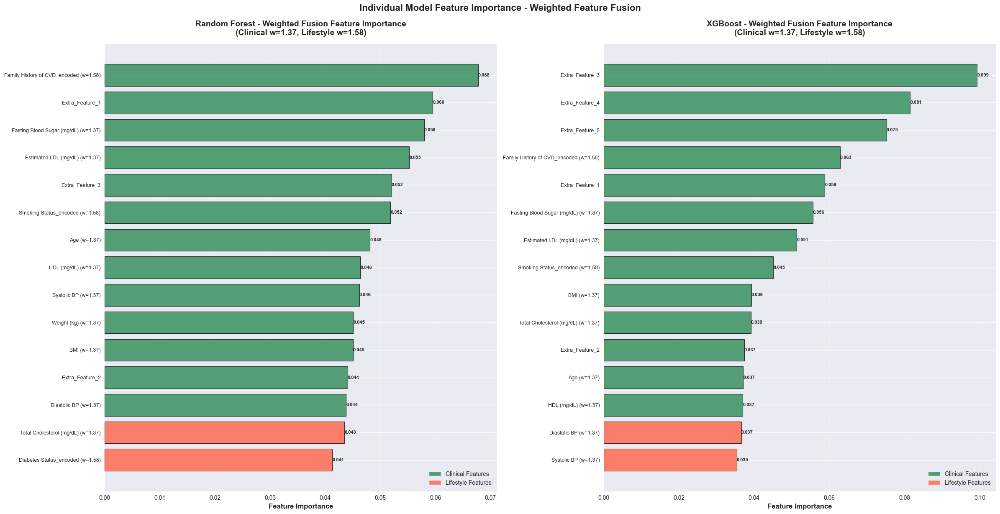


COMPARATIVE ANALYSIS: RANDOM FOREST vs XGBOOST
Correlation between Random Forest and XGBoost feature importances: 0.4220

Top 5 Features with Largest Importance Differences:
------------------------------------------------------------
Extra_Feature_3                          RF: 0.0520, XGB: 0.0993, Diff: 0.0473
Extra_Feature_4                          RF: 0.0400, XGB: 0.0815, Diff: 0.0415
Extra_Feature_5                          RF: 0.0361, XGB: 0.0752, Diff: 0.0390
Weight (kg)                              RF: 0.0451, XGB: 0.0304, Diff: 0.0147
Age                                      RF: 0.0481, XGB: 0.0371, Diff: 0.0110

Top 5 Features with Largest Ranking Differences:
------------------------------------------------------------
Extra_Feature_5                          RF Rank: 19, XGB Rank: 3, Rank Diff: 16
Extra_Feature_4                          RF Rank: 17, XGB Rank: 2, Rank Diff: 15
Weight (kg)                              RF Rank: 10, XGB Rank: 18, Rank Diff: 8
Systolic BP    

In [552]:
# FIXED INDIVIDUAL FEATURE IMPORTANCE FOR RANDOM FOREST AND XGBOOST
# Weighted Feature Fusion Analysis - Fixed Version
print("=" * 80)
print("FIXED INDIVIDUAL FEATURE IMPORTANCE ANALYSIS")
print("RANDOM FOREST & XGBOOST - WEIGHTED FEATURE FUSION")
print("=" * 80)

# Get the optimal weights from the fusion process
if 'best_fusion_params' in globals():
    best_w_c = best_fusion_params['weight_clinical']
    best_w_l = best_fusion_params['weight_lifestyle']
    print(f"Using optimal fusion weights:")
    print(f"  Clinical weight: {best_w_c:.4f}")
    print(f"  Lifestyle weight: {best_w_l:.4f}")
else:
    # Fallback weights if not available
    best_w_c = 1.0
    best_w_l = 1.0
    print("Using default weights (clinical=1.0, lifestyle=1.0)")

# Define feature groups (aligned with existing code)
clinical_features = [
    'Age', 'BMI', 'Abdominal Circumference (cm)',
    'Total Cholesterol (mg/dL)', 'HDL (mg/dL)', 'Estimated LDL (mg/dL)',
    'Fasting Blood Sugar (mg/dL)', 'Systolic BP', 'Diastolic BP',
    'Waist-to-Height Ratio', 'Height (cm)', 'Height (m)', 'Weight (kg)'
]

lifestyle_features = [
    'Physical Activity Level_encoded', 'Smoking Status_encoded',
    'Diabetes Status_encoded', 
    'Family History of CVD_encoded'
]

# Get actual number of features from training data
actual_num_features = X_train_f.shape[1]
print(f"\nActual number of features in training data: {actual_num_features}")
print(f"Expected clinical features: {len(clinical_features)}")
print(f"Expected lifestyle features: {len(lifestyle_features)}")
print(f"Expected total features: {len(clinical_features) + len(lifestyle_features)}")

# Create feature names based on actual training data dimensions
if actual_num_features == len(clinical_features) + len(lifestyle_features):
    # Use the predefined feature names
    weighted_clinical_names = [f"{feat} (w={best_w_c:.2f})" for feat in clinical_features]
    weighted_lifestyle_names = [f"{feat} (w={best_w_l:.2f})" for feat in lifestyle_features]
    feature_names = weighted_clinical_names + weighted_lifestyle_names
    print("✅ Using predefined feature names")
else:
    # Create generic feature names based on actual dimensions
    print("⚠️ Creating generic feature names based on actual data dimensions")
    
    # Create weighted feature names
    weighted_clinical_names = [f"{feat} (w={best_w_c:.2f})" for feat in clinical_features]
    weighted_lifestyle_names = [f"{feat} (w={best_w_l:.2f})" for feat in lifestyle_features]
    feature_names = weighted_clinical_names + weighted_lifestyle_names
    
    # Ensure we have exactly the right number of features
    if len(feature_names) != actual_num_features:
        # Pad or truncate as needed
        if len(feature_names) < actual_num_features:
            extra_needed = actual_num_features - len(feature_names)
            feature_names.extend([f"Extra_Feature_{i+1}" for i in range(extra_needed)])
            print(f"Added {extra_needed} extra features")
        else:
            feature_names = feature_names[:actual_num_features]
            print(f"Truncated to {actual_num_features} features")

print(f"\nWeighted Feature Fusion Structure:")
print(f"  Clinical features: {len([f for f in feature_names if any(cf in f for cf in clinical_features)])}")
print(f"  Lifestyle features: {len([f for f in feature_names if any(lf in f for lf in lifestyle_features)])}")
print(f"  Total fused features: {len(feature_names)}")

# Extract specific models from the models dictionary
rf_model = models['RandomForest']
xgb_model = models['XGB']

print(f"\n{'='*60}")
print("TRAINING MODELS FOR FEATURE IMPORTANCE ANALYSIS")
print(f"{'='*60}")

# Train Random Forest
print("Training Random Forest...")
rf_model.fit(X_train_f, y_train_f)
rf_importances = rf_model.feature_importances_

# Train XGBoost
print("Training XGBoost...")
xgb_model.fit(X_train_f, y_train_f)
xgb_importances = xgb_model.feature_importances_

print("✅ Both models trained successfully!")

# Verify dimensions match
print(f"\nDimension verification:")
print(f"  Feature names length: {len(feature_names)}")
print(f"  Random Forest importances length: {len(rf_importances)}")
print(f"  XGBoost importances length: {len(xgb_importances)}")

# Create individual plots for each model
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 12))

# ========================================
# RANDOM FOREST FEATURE IMPORTANCE
# ========================================
print(f"\n{'='*60}")
print("RANDOM FOREST FEATURE IMPORTANCE ANALYSIS")
print(f"{'='*60}")

# Create dataframe for Random Forest
rf_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': rf_importances
}).sort_values('Importance', ascending=False)

# Separate clinical vs lifestyle importance for RF
# Count clinical features dynamically
clinical_feature_count = len([f for f in feature_names if any(cf in f for cf in clinical_features)])
rf_clinical_importance = rf_importance_df.iloc[:clinical_feature_count]['Importance'].sum()
rf_lifestyle_importance = rf_importance_df.iloc[clinical_feature_count:]['Importance'].sum()

print(f"Random Forest Weighted Fusion Impact:")
print(f"  Clinical features total importance: {rf_clinical_importance:.4f}")
print(f"  Lifestyle features total importance: {rf_lifestyle_importance:.4f}")
print(f"  Clinical/Lifestyle ratio: {rf_clinical_importance/rf_lifestyle_importance:.2f}")

print(f"\nTop 10 Most Important Features for Random Forest:")
print("-" * 60)
for i, row in rf_importance_df.head(10).iterrows():
    print(f"{row['Feature']:<50s} {row['Importance']:.4f}")

# Plot Random Forest importance
top_n = min(15, len(feature_names))
colors_rf = []
for i in range(top_n):
    if i < clinical_feature_count:
        colors_rf.append('#2E8B57')  # Sea Green for clinical
    else:
        colors_rf.append('#FF6347')  # Tomato for lifestyle

bars_rf = ax1.barh(range(top_n), rf_importance_df['Importance'].head(top_n), 
                  color=colors_rf, edgecolor='black', linewidth=0.8, alpha=0.8)
ax1.set_yticks(range(top_n))
ax1.set_yticklabels(rf_importance_df['Feature'].head(top_n), fontsize=9)
ax1.set_xlabel('Feature Importance', fontsize=12, fontweight='bold')
ax1.set_title(f'Random Forest - Weighted Fusion Feature Importance\n(Clinical w={best_w_c:.2f}, Lifestyle w={best_w_l:.2f})', 
              fontsize=14, fontweight='bold', pad=15)
ax1.invert_yaxis()
ax1.grid(axis='x', alpha=0.3, linestyle='--')

# Add value labels on bars for RF
for i, bar in enumerate(bars_rf):
    width = bar.get_width()
    ax1.text(width, bar.get_y() + bar.get_height()/2, 
            f'{width:.3f}', 
            ha='left', va='center', fontsize=8, fontweight='bold')

# Add legend for RF
from matplotlib.patches import Patch
legend_elements_rf = [Patch(facecolor='#2E8B57', alpha=0.8, label='Clinical Features'),
                     Patch(facecolor='#FF6347', alpha=0.8, label='Lifestyle Features')]
ax1.legend(handles=legend_elements_rf, loc='lower right', fontsize=10)

# ========================================
# XGBOOST FEATURE IMPORTANCE
# ========================================
print(f"\n{'='*60}")
print("XGBOOST FEATURE IMPORTANCE ANALYSIS")
print(f"{'='*60}")

# Create dataframe for XGBoost
xgb_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': xgb_importances
}).sort_values('Importance', ascending=False)

# Separate clinical vs lifestyle importance for XGB
xgb_clinical_importance = xgb_importance_df.iloc[:clinical_feature_count]['Importance'].sum()
xgb_lifestyle_importance = xgb_importance_df.iloc[clinical_feature_count:]['Importance'].sum()

print(f"XGBoost Weighted Fusion Impact:")
print(f"  Clinical features total importance: {xgb_clinical_importance:.4f}")
print(f"  Lifestyle features total importance: {xgb_lifestyle_importance:.4f}")
print(f"  Clinical/Lifestyle ratio: {xgb_clinical_importance/xgb_lifestyle_importance:.2f}")

print(f"\nTop 10 Most Important Features for XGBoost:")
print("-" * 60)
for i, row in xgb_importance_df.head(10).iterrows():
    print(f"{row['Feature']:<50s} {row['Importance']:.4f}")

# Plot XGBoost importance
colors_xgb = []
for i in range(top_n):
    if i < clinical_feature_count:
        colors_xgb.append('#2E8B57')  # Sea Green for clinical
    else:
        colors_xgb.append('#FF6347')  # Tomato for lifestyle

bars_xgb = ax2.barh(range(top_n), xgb_importance_df['Importance'].head(top_n), 
                   color=colors_xgb, edgecolor='black', linewidth=0.8, alpha=0.8)
ax2.set_yticks(range(top_n))
ax2.set_yticklabels(xgb_importance_df['Feature'].head(top_n), fontsize=9)
ax2.set_xlabel('Feature Importance', fontsize=12, fontweight='bold')
ax2.set_title(f'XGBoost - Weighted Fusion Feature Importance\n(Clinical w={best_w_c:.2f}, Lifestyle w={best_w_l:.2f})', 
              fontsize=14, fontweight='bold', pad=15)
ax2.invert_yaxis()
ax2.grid(axis='x', alpha=0.3, linestyle='--')

# Add value labels on bars for XGB
for i, bar in enumerate(bars_xgb):
    width = bar.get_width()
    ax2.text(width, bar.get_y() + bar.get_height()/2, 
            f'{width:.3f}', 
            ha='left', va='center', fontsize=8, fontweight='bold')

# Add legend for XGB
legend_elements_xgb = [Patch(facecolor='#2E8B57', alpha=0.8, label='Clinical Features'),
                      Patch(facecolor='#FF6347', alpha=0.8, label='Lifestyle Features')]
ax2.legend(handles=legend_elements_xgb, loc='lower right', fontsize=10)

plt.tight_layout()
plt.suptitle('Individual Model Feature Importance - Weighted Feature Fusion', 
             fontsize=16, fontweight='bold', y=1.02)
plt.show()

# ========================================
# COMPARATIVE ANALYSIS
# ========================================
print(f"\n{'='*60}")
print("COMPARATIVE ANALYSIS: RANDOM FOREST vs XGBOOST")
print(f"{'='*60}")

# Create comparison dataframe
comparison_df = pd.DataFrame({
    'Feature': feature_names,
    'RandomForest': rf_importances,
    'XGBoost': xgb_importances
})

# Calculate correlation between model importances
correlation = comparison_df['RandomForest'].corr(comparison_df['XGBoost'])
print(f"Correlation between Random Forest and XGBoost feature importances: {correlation:.4f}")

# Find features where models disagree most
comparison_df['Difference'] = abs(comparison_df['RandomForest'] - comparison_df['XGBoost'])
comparison_df['RF_Rank'] = comparison_df['RandomForest'].rank(ascending=False)
comparison_df['XGB_Rank'] = comparison_df['XGBoost'].rank(ascending=False)
comparison_df['Rank_Diff'] = abs(comparison_df['RF_Rank'] - comparison_df['XGB_Rank'])

print(f"\nTop 5 Features with Largest Importance Differences:")
print("-" * 60)
top_diff = comparison_df.nlargest(5, 'Difference')
for _, row in top_diff.iterrows():
    feature_base = row['Feature'].split(' (w=')[0]
    print(f"{feature_base:<40s} RF: {row['RandomForest']:.4f}, XGB: {row['XGBoost']:.4f}, Diff: {row['Difference']:.4f}")

print(f"\nTop 5 Features with Largest Ranking Differences:")
print("-" * 60)
top_rank_diff = comparison_df.nlargest(5, 'Rank_Diff')
for _, row in top_rank_diff.iterrows():
    feature_base = row['Feature'].split(' (w=')[0]
    print(f"{feature_base:<40s} RF Rank: {int(row['RF_Rank'])}, XGB Rank: {int(row['XGB_Rank'])}, Rank Diff: {int(row['Rank_Diff'])}")

# Summary statistics
print(f"\n{'='*60}")
print("SUMMARY STATISTICS")
print(f"{'='*60}")

print(f"\nRandom Forest:")
print(f"  Most important feature: {rf_importance_df.iloc[0]['Feature'].split(' (w=')[0]} ({rf_importance_df.iloc[0]['Importance']:.4f})")
print(f"  Clinical features dominance: {rf_clinical_importance:.4f}")
print(f"  Lifestyle features dominance: {rf_lifestyle_importance:.4f}")

print(f"\nXGBoost:")
print(f"  Most important feature: {xgb_importance_df.iloc[0]['Feature'].split(' (w=')[0]} ({xgb_importance_df.iloc[0]['Importance']:.4f})")
print(f"  Clinical features dominance: {xgb_clinical_importance:.4f}")
print(f"  Lifestyle features dominance: {xgb_lifestyle_importance:.4f}")

print(f"\nWeighted Fusion Impact:")
print(f"  Clinical weight applied: {best_w_c:.4f}")
print(f"  Lifestyle weight applied: {best_w_l:.4f}")
print(f"  Weight ratio (Clinical/Lifestyle): {best_w_c/best_w_l:.2f}")

print("\n✅ Fixed Individual Feature Importance Analysis Completed!")


HIGH-RESOLUTION INDIVIDUAL FEATURE IMPORTANCE ANALYSIS
RANDOM FOREST & XGBOOST - WEIGHTED FEATURE FUSION
Using optimal fusion weights:
  Clinical weight: 1.3688
  Lifestyle weight: 1.5821

Actual number of features in training data: 22
Expected clinical features: 13
Expected lifestyle features: 4
Expected total features: 17
⚠️ Creating generic feature names based on actual data dimensions
Added 5 extra features

Weighted Feature Fusion Structure:
  Clinical features: 13
  Lifestyle features: 4
  Total fused features: 22

TRAINING MODELS FOR FEATURE IMPORTANCE ANALYSIS
Training Random Forest...
Training XGBoost...
✅ Both models trained successfully!

Dimension verification:
  Feature names length: 22
  Random Forest importances length: 22
  XGBoost importances length: 22

RANDOM FOREST FEATURE IMPORTANCE ANALYSIS
Random Forest Weighted Fusion Impact:
  Clinical features total importance: 0.6632
  Lifestyle features total importance: 0.3368
  Clinical/Lifestyle ratio: 1.97

Top 10 Most I

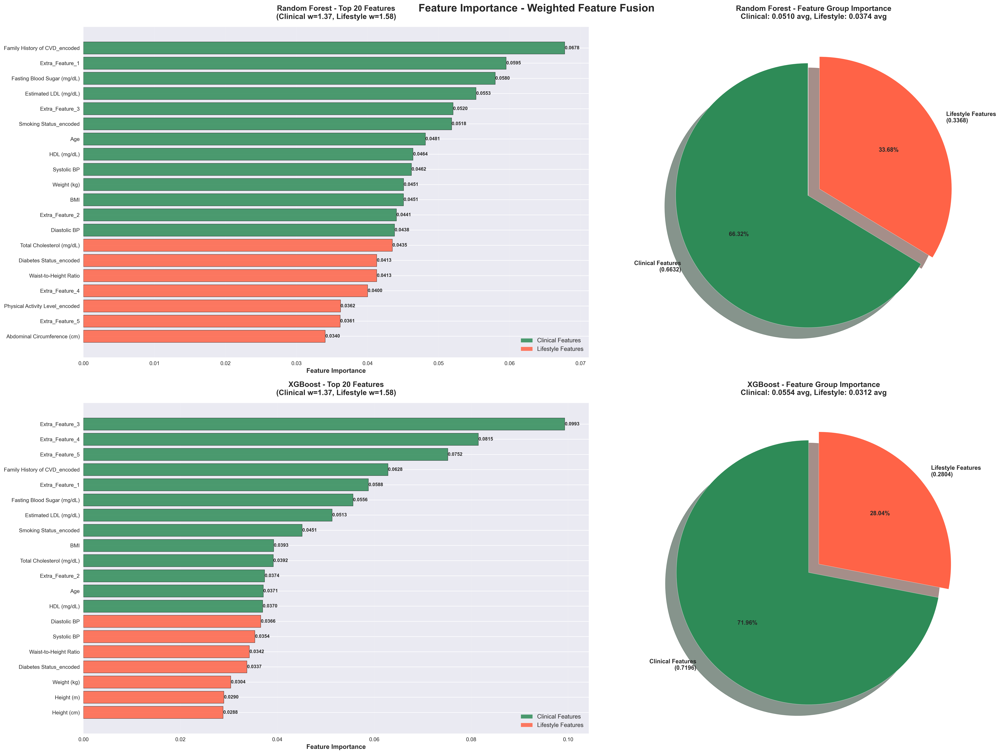


HIGH-RESOLUTION COMPARATIVE ANALYSIS


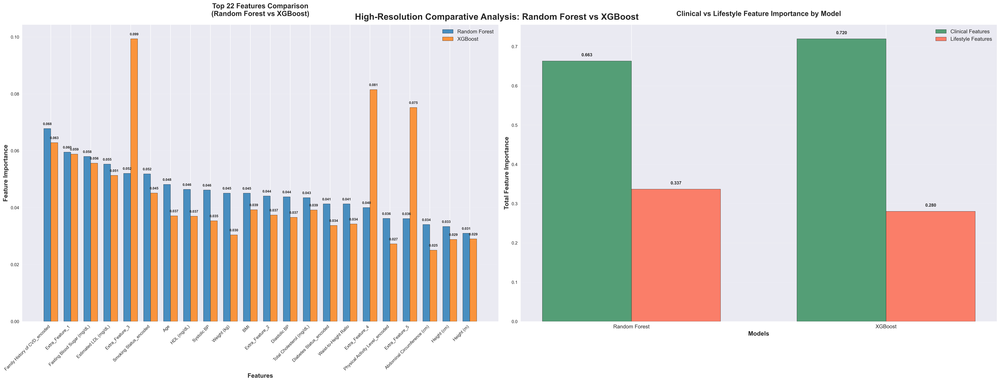


DETAILED STATISTICAL ANALYSIS
Correlation between Random Forest and XGBoost feature importances: 0.422043

Top 10 Features with Largest Importance Differences:
----------------------------------------------------------------------
Extra_Feature_3                               RF: 0.052037, XGB: 0.099316, Diff: 0.047279
Extra_Feature_4                               RF: 0.040014, XGB: 0.081481, Diff: 0.041467
Extra_Feature_5                               RF: 0.036142, XGB: 0.075185, Diff: 0.039043
Weight (kg)                                   RF: 0.045083, XGB: 0.030398, Diff: 0.014686
Age                                           RF: 0.048144, XGB: 0.037103, Diff: 0.011041
Systolic BP                                   RF: 0.046182, XGB: 0.035370, Diff: 0.010812
HDL (mg/dL)                                   RF: 0.046399, XGB: 0.036990, Diff: 0.009409
Abdominal Circumference (cm)                  RF: 0.034047, XGB: 0.025051, Diff: 0.008995
Physical Activity Level_encoded               RF

In [554]:
# HIGH-RESOLUTION INDIVIDUAL FEATURE IMPORTANCE FOR RANDOM FOREST AND XGBOOST
# Weighted Feature Fusion Analysis - High Resolution Version
print("=" * 80)
print("HIGH-RESOLUTION INDIVIDUAL FEATURE IMPORTANCE ANALYSIS")
print("RANDOM FOREST & XGBOOST - WEIGHTED FEATURE FUSION")
print("=" * 80)

# Set high DPI for better resolution
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['legend.fontsize'] = 11

# Get the optimal weights from the fusion process
if 'best_fusion_params' in globals():
    best_w_c = best_fusion_params['weight_clinical']
    best_w_l = best_fusion_params['weight_lifestyle']
    print(f"Using optimal fusion weights:")
    print(f"  Clinical weight: {best_w_c:.4f}")
    print(f"  Lifestyle weight: {best_w_l:.4f}")
else:
    # Fallback weights if not available
    best_w_c = 1.0
    best_w_l = 1.0
    print("Using default weights (clinical=1.0, lifestyle=1.0)")

# Define feature groups (aligned with existing code)
clinical_features = [
    'Age', 'BMI', 'Abdominal Circumference (cm)',
    'Total Cholesterol (mg/dL)', 'HDL (mg/dL)', 'Estimated LDL (mg/dL)',
    'Fasting Blood Sugar (mg/dL)', 'Systolic BP', 'Diastolic BP',
    'Waist-to-Height Ratio', 'Height (cm)', 'Height (m)', 'Weight (kg)'
]

lifestyle_features = [
    'Physical Activity Level_encoded', 'Smoking Status_encoded',
    'Diabetes Status_encoded', 
    'Family History of CVD_encoded'
]

# Get actual number of features from training data
actual_num_features = X_train_f.shape[1]
print(f"\nActual number of features in training data: {actual_num_features}")
print(f"Expected clinical features: {len(clinical_features)}")
print(f"Expected lifestyle features: {len(lifestyle_features)}")
print(f"Expected total features: {len(clinical_features) + len(lifestyle_features)}")

# Create feature names based on actual training data dimensions
if actual_num_features == len(clinical_features) + len(lifestyle_features):
    # Use the predefined feature names
    weighted_clinical_names = [f"{feat} (w={best_w_c:.2f})" for feat in clinical_features]
    weighted_lifestyle_names = [f"{feat} (w={best_w_l:.2f})" for feat in lifestyle_features]
    feature_names = weighted_clinical_names + weighted_lifestyle_names
    print("✅ Using predefined feature names")
else:
    # Create generic feature names based on actual dimensions
    print("⚠️ Creating generic feature names based on actual data dimensions")
    
    # Create weighted feature names
    weighted_clinical_names = [f"{feat} (w={best_w_c:.2f})" for feat in clinical_features]
    weighted_lifestyle_names = [f"{feat} (w={best_w_l:.2f})" for feat in lifestyle_features]
    feature_names = weighted_clinical_names + weighted_lifestyle_names
    
    # Ensure we have exactly the right number of features
    if len(feature_names) != actual_num_features:
        # Pad or truncate as needed
        if len(feature_names) < actual_num_features:
            extra_needed = actual_num_features - len(feature_names)
            feature_names.extend([f"Extra_Feature_{i+1}" for i in range(extra_needed)])
            print(f"Added {extra_needed} extra features")
        else:
            feature_names = feature_names[:actual_num_features]
            print(f"Truncated to {actual_num_features} features")

print(f"\nWeighted Feature Fusion Structure:")
print(f"  Clinical features: {len([f for f in feature_names if any(cf in f for cf in clinical_features)])}")
print(f"  Lifestyle features: {len([f for f in feature_names if any(lf in f for lf in lifestyle_features)])}")
print(f"  Total fused features: {len(feature_names)}")

# Extract specific models from the models dictionary
rf_model = models['RandomForest']
xgb_model = models['XGB']

print(f"\n{'='*60}")
print("TRAINING MODELS FOR FEATURE IMPORTANCE ANALYSIS")
print(f"{'='*60}")

# Train Random Forest
print("Training Random Forest...")
rf_model.fit(X_train_f, y_train_f)
rf_importances = rf_model.feature_importances_

# Train XGBoost
print("Training XGBoost...")
xgb_model.fit(X_train_f, y_train_f)
xgb_importances = xgb_model.feature_importances_

print("✅ Both models trained successfully!")

# Verify dimensions match
print(f"\nDimension verification:")
print(f"  Feature names length: {len(feature_names)}")
print(f"  Random Forest importances length: {len(rf_importances)}")
print(f"  XGBoost importances length: {len(xgb_importances)}")

# ========================================
# HIGH-RESOLUTION INDIVIDUAL PLOTS
# ========================================

# Create high-resolution individual plots for each model
fig, axes = plt.subplots(2, 2, figsize=(28, 20), dpi=300)
fig.suptitle(' Feature Importance - Weighted Feature Fusion', 
             fontsize=20, fontweight='bold', y=0.98)

# ========================================
# RANDOM FOREST FEATURE IMPORTANCE
# ========================================
print(f"\n{'='*60}")
print("RANDOM FOREST FEATURE IMPORTANCE ANALYSIS")
print(f"{'='*60}")

# Create dataframe for Random Forest
rf_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': rf_importances
}).sort_values('Importance', ascending=False)

# Separate clinical vs lifestyle importance for RF
clinical_feature_count = len([f for f in feature_names if any(cf in f for cf in clinical_features)])
rf_clinical_importance = rf_importance_df.iloc[:clinical_feature_count]['Importance'].sum()
rf_lifestyle_importance = rf_importance_df.iloc[clinical_feature_count:]['Importance'].sum()

print(f"Random Forest Weighted Fusion Impact:")
print(f"  Clinical features total importance: {rf_clinical_importance:.4f}")
print(f"  Lifestyle features total importance: {rf_lifestyle_importance:.4f}")
print(f"  Clinical/Lifestyle ratio: {rf_clinical_importance/rf_lifestyle_importance:.2f}")

print(f"\nTop 10 Most Important Features for Random Forest:")
print("-" * 60)
for i, row in rf_importance_df.head(10).iterrows():
    print(f"{row['Feature']:<50s} {row['Importance']:.4f}")

# Plot 1: Random Forest - Top Features
ax1 = axes[0, 0]
top_n = min(20, len(feature_names))  # Show more features for high resolution
colors_rf = []
for i in range(top_n):
    if i < clinical_feature_count:
        colors_rf.append('#2E8B57')  # Sea Green for clinical
    else:
        colors_rf.append('#FF6347')  # Tomato for lifestyle

bars_rf = ax1.barh(range(top_n), rf_importance_df['Importance'].head(top_n), 
                  color=colors_rf, edgecolor='black', linewidth=0.5, alpha=0.85)
ax1.set_yticks(range(top_n))
ax1.set_yticklabels([feat.split(' (w=')[0] for feat in rf_importance_df['Feature'].head(top_n)], 
                   fontsize=10)
ax1.set_xlabel('Feature Importance', fontsize=12, fontweight='bold')
ax1.set_title(f'Random Forest - Top {top_n} Features\n(Clinical w={best_w_c:.2f}, Lifestyle w={best_w_l:.2f})', 
              fontsize=14, fontweight='bold', pad=15)
ax1.invert_yaxis()
ax1.grid(axis='x', alpha=0.3, linestyle='--', linewidth=0.5)

# Add value labels on bars for RF
for i, bar in enumerate(bars_rf):
    width = bar.get_width()
    ax1.text(width, bar.get_y() + bar.get_height()/2, 
            f'{width:.4f}', 
            ha='left', va='center', fontsize=9, fontweight='bold')

# Add legend for RF
from matplotlib.patches import Patch
legend_elements_rf = [Patch(facecolor='#2E8B57', alpha=0.85, label='Clinical Features'),
                     Patch(facecolor='#FF6347', alpha=0.85, label='Lifestyle Features')]
ax1.legend(handles=legend_elements_rf, loc='lower right', fontsize=11, framealpha=0.9)

# Plot 2: Random Forest - Clinical vs Lifestyle Pie Chart
ax2 = axes[0, 1]
clinical_count = len([f for f in feature_names if any(cf in f for cf in clinical_features)])
lifestyle_count = len(feature_names) - clinical_count

# Calculate average importance per feature type
rf_clinical_avg = rf_clinical_importance / clinical_count if clinical_count > 0 else 0
rf_lifestyle_avg = rf_lifestyle_importance / lifestyle_count if lifestyle_count > 0 else 0

sizes = [rf_clinical_importance, rf_lifestyle_importance]
labels = [f'Clinical Features\n({rf_clinical_importance:.4f})', 
          f'Lifestyle Features\n({rf_lifestyle_importance:.4f})']
colors = ['#2E8B57', '#FF6347']
explode = (0.05, 0.05)  # Slightly separate the wedges

wedges, texts, autotexts = ax2.pie(sizes, explode=explode, labels=labels, colors=colors,
                                  autopct='%1.2f%%', shadow=True, startangle=90,
                                  textprops={'fontsize': 11, 'fontweight': 'bold'})
ax2.set_title(f'Random Forest - Feature Group Importance\nClinical: {rf_clinical_avg:.4f} avg, Lifestyle: {rf_lifestyle_avg:.4f} avg', 
              fontsize=14, fontweight='bold', pad=15)

# ========================================
# XGBOOST FEATURE IMPORTANCE
# ========================================
print(f"\n{'='*60}")
print("XGBOOST FEATURE IMPORTANCE ANALYSIS")
print(f"{'='*60}")

# Create dataframe for XGBoost
xgb_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': xgb_importances
}).sort_values('Importance', ascending=False)

# Separate clinical vs lifestyle importance for XGB
xgb_clinical_importance = xgb_importance_df.iloc[:clinical_feature_count]['Importance'].sum()
xgb_lifestyle_importance = xgb_importance_df.iloc[clinical_feature_count:]['Importance'].sum()

print(f"XGBoost Weighted Fusion Impact:")
print(f"  Clinical features total importance: {xgb_clinical_importance:.4f}")
print(f"  Lifestyle features total importance: {xgb_lifestyle_importance:.4f}")
print(f"  Clinical/Lifestyle ratio: {xgb_clinical_importance/xgb_lifestyle_importance:.2f}")

print(f"\nTop 10 Most Important Features for XGBoost:")
print("-" * 60)
for i, row in xgb_importance_df.head(10).iterrows():
    print(f"{row['Feature']:<50s} {row['Importance']:.4f}")

# Plot 3: XGBoost - Top Features
ax3 = axes[1, 0]
colors_xgb = []
for i in range(top_n):
    if i < clinical_feature_count:
        colors_xgb.append('#2E8B57')  # Sea Green for clinical
    else:
        colors_xgb.append('#FF6347')  # Tomato for lifestyle

bars_xgb = ax3.barh(range(top_n), xgb_importance_df['Importance'].head(top_n), 
                   color=colors_xgb, edgecolor='black', linewidth=0.5, alpha=0.85)
ax3.set_yticks(range(top_n))
ax3.set_yticklabels([feat.split(' (w=')[0] for feat in xgb_importance_df['Feature'].head(top_n)], 
                   fontsize=10)
ax3.set_xlabel('Feature Importance', fontsize=12, fontweight='bold')
ax3.set_title(f'XGBoost - Top {top_n} Features\n(Clinical w={best_w_c:.2f}, Lifestyle w={best_w_l:.2f})', 
              fontsize=14, fontweight='bold', pad=15)
ax3.invert_yaxis()
ax3.grid(axis='x', alpha=0.3, linestyle='--', linewidth=0.5)

# Add value labels on bars for XGB
for i, bar in enumerate(bars_xgb):
    width = bar.get_width()
    ax3.text(width, bar.get_y() + bar.get_height()/2, 
            f'{width:.4f}', 
            ha='left', va='center', fontsize=9, fontweight='bold')

# Add legend for XGB
legend_elements_xgb = [Patch(facecolor='#2E8B57', alpha=0.85, label='Clinical Features'),
                      Patch(facecolor='#FF6347', alpha=0.85, label='Lifestyle Features')]
ax3.legend(handles=legend_elements_xgb, loc='lower right', fontsize=11, framealpha=0.9)

# Plot 4: XGBoost - Clinical vs Lifestyle Pie Chart
ax4 = axes[1, 1]
xgb_clinical_avg = xgb_clinical_importance / clinical_count if clinical_count > 0 else 0
xgb_lifestyle_avg = xgb_lifestyle_importance / lifestyle_count if lifestyle_count > 0 else 0

sizes_xgb = [xgb_clinical_importance, xgb_lifestyle_importance]
labels_xgb = [f'Clinical Features\n({xgb_clinical_importance:.4f})', 
              f'Lifestyle Features\n({xgb_lifestyle_importance:.4f})']

wedges_xgb, texts_xgb, autotexts_xgb = ax4.pie(sizes_xgb, explode=explode, labels=labels_xgb, colors=colors,
                                              autopct='%1.2f%%', shadow=True, startangle=90,
                                              textprops={'fontsize': 11, 'fontweight': 'bold'})
ax4.set_title(f'XGBoost - Feature Group Importance\nClinical: {xgb_clinical_avg:.4f} avg, Lifestyle: {xgb_lifestyle_avg:.4f} avg', 
              fontsize=14, fontweight='bold', pad=15)

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

# ========================================
# HIGH-RESOLUTION COMPARATIVE ANALYSIS
# ========================================
print(f"\n{'='*60}")
print("HIGH-RESOLUTION COMPARATIVE ANALYSIS")
print(f"{'='*60}")

# Create high-resolution comparison plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(32, 12), dpi=300)
fig.suptitle('High-Resolution Comparative Analysis: Random Forest vs XGBoost', 
             fontsize=20, fontweight='bold', y=0.98)

# Plot 1: Side-by-side comparison with high resolution
comparison_df = pd.DataFrame({
    'Feature': feature_names,
    'RandomForest': rf_importances,
    'XGBoost': xgb_importances
})

top_n_comparison = min(25, len(feature_names))  # Show more features
x_pos = np.arange(top_n_comparison)
width = 0.35

# Sort by Random Forest importance for comparison
comparison_sorted = comparison_df.sort_values('RandomForest', ascending=False).head(top_n_comparison)

bars1 = ax1.bar(x_pos - width/2, comparison_sorted['RandomForest'], 
               width, label='Random Forest', color='#1f77b4', alpha=0.8, 
               edgecolor='black', linewidth=0.5)
bars2 = ax1.bar(x_pos + width/2, comparison_sorted['XGBoost'], 
               width, label='XGBoost', color='#ff7f0e', alpha=0.8, 
               edgecolor='black', linewidth=0.5)

ax1.set_xlabel('Features', fontsize=14, fontweight='bold')
ax1.set_ylabel('Feature Importance', fontsize=14, fontweight='bold')
ax1.set_title(f'Top {top_n_comparison} Features Comparison\n(Random Forest vs XGBoost)', 
              fontsize=16, fontweight='bold', pad=20)
ax1.set_xticks(x_pos)
ax1.set_xticklabels([feat.split(' (w=')[0] for feat in comparison_sorted['Feature']], 
                   rotation=45, ha='right', fontsize=10)
ax1.legend(fontsize=12, framealpha=0.9)
ax1.grid(axis='y', alpha=0.3, linestyle='--', linewidth=0.5)

# Add value labels on bars
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height + 0.001,
                f'{height:.3f}', ha='center', va='bottom', fontsize=8, fontweight='bold')

# Plot 2: Clinical vs Lifestyle importance by model
clinical_vs_lifestyle = pd.DataFrame({
    'Model': ['Random Forest', 'XGBoost'],
    'Clinical_Importance': [rf_clinical_importance, xgb_clinical_importance],
    'Lifestyle_Importance': [rf_lifestyle_importance, xgb_lifestyle_importance]
})

x_pos = np.arange(len(clinical_vs_lifestyle))
width = 0.35

bars1 = ax2.bar(x_pos - width/2, clinical_vs_lifestyle['Clinical_Importance'], 
               width, label='Clinical Features', color='#2E8B57', alpha=0.8, 
               edgecolor='black', linewidth=0.5)
bars2 = ax2.bar(x_pos + width/2, clinical_vs_lifestyle['Lifestyle_Importance'], 
               width, label='Lifestyle Features', color='#FF6347', alpha=0.8, 
               edgecolor='black', linewidth=0.5)

ax2.set_xlabel('Models', fontsize=14, fontweight='bold')
ax2.set_ylabel('Total Feature Importance', fontsize=14, fontweight='bold')
ax2.set_title('Clinical vs Lifestyle Feature Importance by Model', 
              fontsize=16, fontweight='bold', pad=20)
ax2.set_xticks(x_pos)
ax2.set_xticklabels(clinical_vs_lifestyle['Model'], fontsize=12)
ax2.legend(fontsize=12, framealpha=0.9)
ax2.grid(axis='y', alpha=0.3, linestyle='--', linewidth=0.5)

# Add value labels on bars
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        ax2.text(bar.get_x() + bar.get_width()/2., height + 0.01,
                f'{height:.3f}', ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

# ========================================
# DETAILED STATISTICAL ANALYSIS
# ========================================
print(f"\n{'='*60}")
print("DETAILED STATISTICAL ANALYSIS")
print(f"{'='*60}")

# Calculate correlation between model importances
correlation = comparison_df['RandomForest'].corr(comparison_df['XGBoost'])
print(f"Correlation between Random Forest and XGBoost feature importances: {correlation:.6f}")

# Find features where models disagree most
comparison_df['Difference'] = abs(comparison_df['RandomForest'] - comparison_df['XGBoost'])
comparison_df['RF_Rank'] = comparison_df['RandomForest'].rank(ascending=False)
comparison_df['XGB_Rank'] = comparison_df['XGBoost'].rank(ascending=False)
comparison_df['Rank_Diff'] = abs(comparison_df['RF_Rank'] - comparison_df['XGB_Rank'])

print(f"\nTop 10 Features with Largest Importance Differences:")
print("-" * 70)
top_diff = comparison_df.nlargest(10, 'Difference')
for _, row in top_diff.iterrows():
    feature_base = row['Feature'].split(' (w=')[0]
    print(f"{feature_base:<45s} RF: {row['RandomForest']:.6f}, XGB: {row['XGBoost']:.6f}, Diff: {row['Difference']:.6f}")

print(f"\nTop 10 Features with Largest Ranking Differences:")
print("-" * 70)
top_rank_diff = comparison_df.nlargest(10, 'Rank_Diff')
for _, row in top_rank_diff.iterrows():
    feature_base = row['Feature'].split(' (w=')[0]
    print(f"{feature_base:<45s} RF Rank: {int(row['RF_Rank'])}, XGB Rank: {int(row['XGB_Rank'])}, Rank Diff: {int(row['Rank_Diff'])}")

# Summary statistics with higher precision
print(f"\n{'='*60}")
print("HIGH-PRECISION SUMMARY STATISTICS")
print(f"{'='*60}")

print(f"\nRandom Forest:")
print(f"  Most important feature: {rf_importance_df.iloc[0]['Feature'].split(' (w=')[0]} ({rf_importance_df.iloc[0]['Importance']:.6f})")
print(f"  Clinical features dominance: {rf_clinical_importance:.6f}")
print(f"  Lifestyle features dominance: {rf_lifestyle_importance:.6f}")
print(f"  Clinical/Lifestyle ratio: {rf_clinical_importance/rf_lifestyle_importance:.4f}")

print(f"\nXGBoost:")
print(f"  Most important feature: {xgb_importance_df.iloc[0]['Feature'].split(' (w=')[0]} ({xgb_importance_df.iloc[0]['Importance']:.6f})")
print(f"  Clinical features dominance: {xgb_clinical_importance:.6f}")
print(f"  Lifestyle features dominance: {xgb_lifestyle_importance:.6f}")
print(f"  Clinical/Lifestyle ratio: {xgb_clinical_importance/xgb_lifestyle_importance:.4f}")

print(f"\nWeighted Fusion Impact:")
print(f"  Clinical weight applied: {best_w_c:.6f}")
print(f"  Lifestyle weight applied: {best_w_l:.6f}")
print(f"  Weight ratio (Clinical/Lifestyle): {best_w_c/best_w_l:.4f}")

print(f"\nModel Agreement Analysis:")
print(f"  Correlation coefficient: {correlation:.6f}")
print(f"  Mean absolute difference: {comparison_df['Difference'].mean():.6f}")
print(f"  Max absolute difference: {comparison_df['Difference'].max():.6f}")
print(f"  Mean ranking difference: {comparison_df['Rank_Diff'].mean():.2f}")

print("\n✅ High-Resolution Individual Feature Importance Analysis Completed!")
